In [1]:
from pynq import Overlay

overlay = Overlay('/home/xilinx/pynq/overlays/odin/ODIN_design_wrapper.bit')

In [2]:
ODIN_PROG_CONFIG = 0x00
ODIN_PROG_NEURON = 0x05
ODIN_PROG_SYNAPSE = 0x06
ODIN_READ_NEURON = 0x09
ODIN_READ_SYNAPSE = 0x0A
# Constants
AXI_SPI_LOADER_BASE_ADDR = 0x00000000  # Replace with actual base address of AXI_SPI_LOADER


SPI_GATE_ACTIVITY_ADDR = 0x00000
SPI_OPEN_LOOP_ADDR = 0x00001
SPI_SYN_SIGN_BASE_ADDR = 0x00002
SPI_BURST_TIMEREF_ADDR = 0x00012
SPI_AER_SRC_CTRL_nNEUR_ADDR = 0x00013
SPI_OUT_AER_MONITOR_EN_ADDR = 0x00014
SPI_MONITOR_NEUR_ADDR_ADDR = 0x00015
SPI_MONITOR_SYN_ADDR_ADDR = 0x00016
SPI_UPDATE_UNMAPPED_SYN_ADDR = 0x00017
SPI_PROPAGATE_UNMAPPED_SYN_ADDR = 0x00018
SPI_SDSP_ON_SYN_STIM_ADDR = 0x00019

In [3]:
import json

# Define the neuron configuration dictionary
neuron_config = {
    "null_space": 0,
    "null_space_2": 0,
    "lif_izh_sel": 1, #1 == LIF
    "leak_str": 12,
    "leak_en": 1,
    "thr": 64,
    "ca_en": 1,
    "thetamem": 12,
    "ca_theta1": 2,
    "ca_theta2": 4,
    "ca_theta3": 6,
    "ca_leak": 1,
    "core": 0,
    "calcium": 0,
    "caleak_cnt": 0,
    "neur_disable": 0
}

# Create a list to store the neuron configurations
neuron_data = []

# Generate 256 neuron configurations
for i in range(256):
    # Create a copy of the default neuron configuration
    neuron = neuron_config.copy()

    # Set the disable bit to 1 for neurons 10+
    if i >= 10:
        neuron["neur_disable"] = 1

    # Convert the neuron configuration to a 128-bit binary string
    binary_config = "".join([
        f"{neuron['neur_disable']:01b}",
        f"{neuron['null_space_2']:041b}",
        f"{neuron['caleak_cnt']:05b}",
        f"{neuron['calcium']:03b}",
        f"{neuron['core']:08b}",
        f"{neuron['null_space']:030b}",
        f"{neuron['ca_leak']:05b}",
        f"{neuron['ca_theta3']:03b}",
        f"{neuron['ca_theta2']:03b}",
        f"{neuron['ca_theta1']:03b}",
        f"{neuron['thetamem']:08b}",
        f"{neuron['ca_en']:01b}",
        f"{neuron['thr']:08b}",
        f"{neuron['leak_en']:01b}",
        f"{neuron['leak_str']:07b}",
        f"{neuron['lif_izh_sel']:01b}"
    ])

    # Append the binary configuration to the neuron_data list
    neuron_data.append(binary_config)

# Create a dictionary to store the neuron data
data = {
    "neuron_data": neuron_data
}

# Write the data to a JSON file
with open("data/neuron_data_sdsp.json", "w") as file:
    json.dump(data, file, indent=2)

In [4]:
from pynq import MMIO
mmio = MMIO(0x43C00000, 0x1000)

def spi_loader(spi_address, spi_data, control_bits):
    address_bits = (spi_address & 0xFFFF) | ((control_bits << 16) & 0xF0000)
    data_bits = (spi_data >> 8) & 0xFFF
    combined_data = (address_bits << 12) | data_bits

    # Write to AXI SPI Loader
    overlay.AXI_SPI_LOADER_0.write(AXI_SPI_LOADER_BASE_ADDR, combined_data)
    overlay.AXI_SPI_LOADER_0.write(AXI_SPI_LOADER_BASE_ADDR + 4, spi_data & 0xFF)
    overlay.AXI_SPI_LOADER_0.write(AXI_SPI_LOADER_BASE_ADDR + 8, 0)

    # Readout process, simulated to return some value
    readout = 0
    #while (readout & 0x80000000) == 0:
    readout = overlay.AXI_SPI_LOADER_0.read(AXI_SPI_LOADER_BASE_ADDR + 12)

    return readout & 0xFF

def spi_loader_mmio(spi_address, spi_data, control_bits):
    address_bits = (spi_address & 0xFFFF) | ((control_bits << 16) & 0xF0000)
    data_bits = (spi_data >> 8) & 0xFFF
    combined_data = (address_bits << 12) | data_bits

    # Using MMIO write commands
    mmio.write(0, combined_data)
    mmio.write(4, spi_data & 0xFF)
    mmio.write(8, 0)

    # Simulated readout process
    readout = mmio.read(12)
    return readout & 0xFF

In [5]:
spi_loader(0, 1, ODIN_PROG_CONFIG)  

# Simulate addr_data_pair_t structure as a Python dictionary
addr_data_pairs = [
    {"addr": SPI_GATE_ACTIVITY_ADDR, "data": 0x00001},
    {"addr": SPI_OPEN_LOOP_ADDR, "data": 0x00000},
]

# Fill in remaining pairs based on the C code structure
for i in range(16):
    if i == 0:
        addr_data_pairs.append({"addr": SPI_SYN_SIGN_BASE_ADDR + i, "data": 0x003FF}) #first 10 are inhibitory
    else:
        addr_data_pairs.append({"addr": SPI_SYN_SIGN_BASE_ADDR + i, "data": 0x00000})

addr_data_pairs.extend([
    {"addr": SPI_BURST_TIMEREF_ADDR, "data": 0x00000},
    {"addr": SPI_AER_SRC_CTRL_nNEUR_ADDR, "data": 0x00000},
    {"addr": SPI_OUT_AER_MONITOR_EN_ADDR, "data": 0x00000},
    {"addr": SPI_MONITOR_NEUR_ADDR_ADDR, "data": 0x00000},
    {"addr": SPI_MONITOR_SYN_ADDR_ADDR, "data": 0x00000},
    {"addr": SPI_UPDATE_UNMAPPED_SYN_ADDR, "data": 0x00001},
    {"addr": SPI_PROPAGATE_UNMAPPED_SYN_ADDR, "data": 0x00001},
    {"addr": SPI_SDSP_ON_SYN_STIM_ADDR, "data": 0x00001},
])


for pair in addr_data_pairs:
    read_byte = spi_loader(pair['addr'], pair['data'], ODIN_PROG_CONFIG)

spi_loader(0, 0, ODIN_PROG_CONFIG)  

0

In [6]:
addr_data_pairs

[{'addr': 0, 'data': 1},
 {'addr': 1, 'data': 0},
 {'addr': 2, 'data': 1023},
 {'addr': 3, 'data': 0},
 {'addr': 4, 'data': 0},
 {'addr': 5, 'data': 0},
 {'addr': 6, 'data': 0},
 {'addr': 7, 'data': 0},
 {'addr': 8, 'data': 0},
 {'addr': 9, 'data': 0},
 {'addr': 10, 'data': 0},
 {'addr': 11, 'data': 0},
 {'addr': 12, 'data': 0},
 {'addr': 13, 'data': 0},
 {'addr': 14, 'data': 0},
 {'addr': 15, 'data': 0},
 {'addr': 16, 'data': 0},
 {'addr': 17, 'data': 0},
 {'addr': 18, 'data': 0},
 {'addr': 19, 'data': 0},
 {'addr': 20, 'data': 0},
 {'addr': 21, 'data': 0},
 {'addr': 22, 'data': 0},
 {'addr': 23, 'data': 1},
 {'addr': 24, 'data': 1},
 {'addr': 25, 'data': 1}]

In [7]:
import random
# Generate random neuron data (256 neurons, 4 integers each)
neuron_data = [[random.randint(0, 0xFFFFFFFF) for _ in range(4)] for _ in range(256)]

# Write data to the SPI registers
def write_neuron_data():
    for neuron_idx in range(1):
        for byte_idx in range(16):
            address = (neuron_idx) | ((byte_idx & 0xFF) << 8)
            byte_data = (neuron_data[neuron_idx][(15 - byte_idx) // 4] >> ((byte_idx % 4) * 8)) & 0xFF
            int_data = 0x000000FF & byte_data
            spi_loader(address, int_data, ODIN_PROG_NEURON)

# Read data back from the SPI registers for verification (placeholder function)
def read_neuron_data():
    for neuron_idx in range(1):
        for byte_idx in range(16):
            address = (neuron_idx) | ((byte_idx & 0xFF) << 8)
            read_byte = spi_loader(address, 0, ODIN_READ_NEURON)  # Modify as per your specific protocol
            print(f"Address: 0x{address:05X}, Read Byte: 0x{read_byte:02X}")

# Execute the writing and reading functions
write_neuron_data()
print("wrote")
read_neuron_data()

wrote
Address: 0x00000, Read Byte: 0x00
Address: 0x00100, Read Byte: 0x00
Address: 0x00200, Read Byte: 0x00
Address: 0x00300, Read Byte: 0x00
Address: 0x00400, Read Byte: 0x00
Address: 0x00500, Read Byte: 0x00
Address: 0x00600, Read Byte: 0x00
Address: 0x00700, Read Byte: 0x00
Address: 0x00800, Read Byte: 0x00
Address: 0x00900, Read Byte: 0x00
Address: 0x00A00, Read Byte: 0x00
Address: 0x00B00, Read Byte: 0x00
Address: 0x00C00, Read Byte: 0x00
Address: 0x00D00, Read Byte: 0x00
Address: 0x00E00, Read Byte: 0x00
Address: 0x00F00, Read Byte: 0x00


In [8]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Load AER data from JSON file
with open("data/aer_data.json", "r") as json_file:
    aer_data = json.load(json_file)["aer_data"]

# Load synapse data from JSON file
with open("data/synapse_data.json", "r") as json_file:
    synapse_data = json.load(json_file)

# Get the 4th image data
image_data = aer_data[0]
image_index = image_data["image_index"]
true_label = image_data["true_label"]
inferred_label = image_data["inferred_label"]
aer_code = image_data["aer_data"]
original_image = np.array(image_data["original_image"]).reshape(16, 16)

# Display the 4th original image
plt.imshow(original_image, cmap="gray")
plt.title(f"Image {image_index}\nTrue Label: {true_label}, Inferred Label: {inferred_label}")
plt.axis("off")
plt.show()

# Print the AER code for the 4th image
print("AER Code:")
print(aer_code)

# Print the first four bytes from the synapse data
print("\nSynapse Data (First 4 Bytes):")
for i in range(4):
    byte_data = synapse_data[i]
    byte_value = int(byte_data, 2)
    print(f"Byte {i + 1}: {byte_data} (Decimal: {byte_value})")

AER Code:
[215, 91, 184, 230, 231, 138, 88, 89, 107, 122, 169, 153, 87, 90, 68, 199, 86, 69, 200, 168, 214, 123, 70, 137, 85, 246, 84, 92, 67, 183, 154, 74, 73, 71, 72, 185, 75, 106, 83, 247, 216, 232, 108, 139, 229, 76, 121, 198, 170, 152, 104, 105, 245, 103, 102, 213, 109, 110, 66, 65, 64, 63, 61, 98, 101, 100, 99, 77, 97, 96, 78, 79, 80, 81, 82, 95, 94, 93, 62, 255, 60, 15, 28, 27, 26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 14, 59, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 29, 30, 31, 32, 58, 57, 56, 55, 112, 54, 53, 52, 51, 50, 49, 48, 47, 46, 45, 44, 43, 42, 41, 40, 39, 38, 37, 36, 35, 34, 33, 111, 127, 113, 182, 218, 217, 212, 211, 210, 209, 208, 207, 206, 205, 204, 203, 202, 201, 197, 196, 195, 194, 193, 192, 191, 190, 189, 188, 187, 219, 220, 221, 239, 253, 252, 251, 250, 249, 248, 244, 243, 242, 241, 240, 238, 222, 237, 236, 235, 234, 233, 228, 227, 226, 225, 224, 223, 186, 181, 114, 180, 145, 144, 143, 142, 141, 140, 136, 135, 134, 133, 132, 131, 130, 129, 128, 254, 126, 12

In [9]:
import json

# Function to split 128-bit data into 8-bit chunks
def split_data(data):
    return [data[i:i+8] for i in range(0, len(data), 8)][::-1]

# Read the neuron data from the JSON file
with open("data/neuron_data_sdsp.json", "r") as file:
    data = json.load(file)
    neuron_data = data["neuron_data"]
    
spi_loader(0, 1, ODIN_PROG_CONFIG)
# Iterate over each neuron configuration
for neuron_index, binary_config in enumerate(neuron_data[:]):
    # Split the 128-bit binary configuration into 8-bit chunks
    chunks = split_data(binary_config)
    
    # Load each 8-bit chunk using the spi_loader function
    for chunk_index, chunk in enumerate(chunks):
        spi_address = (chunk_index << 8) + neuron_index
        spi_data = int(chunk, 2)
        
        # Call the spi_loader function to load the data
        readout = spi_loader_mmio(spi_address, spi_data, ODIN_PROG_NEURON)
        
        # Print the loaded data for verification
        #print(f"Neuron {neuron_index}, Chunk {chunk_index}: Loaded {chunk} (Address: {spi_address:04X}, Data: {spi_data:02X})")
    
    print(f"Finished loading neuron {neuron_index}")
spi_loader(0, 0, ODIN_PROG_CONFIG)  

Finished loading neuron 0
Finished loading neuron 1
Finished loading neuron 2
Finished loading neuron 3
Finished loading neuron 4
Finished loading neuron 5
Finished loading neuron 6
Finished loading neuron 7
Finished loading neuron 8
Finished loading neuron 9
Finished loading neuron 10
Finished loading neuron 11
Finished loading neuron 12
Finished loading neuron 13
Finished loading neuron 14
Finished loading neuron 15
Finished loading neuron 16
Finished loading neuron 17
Finished loading neuron 18
Finished loading neuron 19
Finished loading neuron 20
Finished loading neuron 21
Finished loading neuron 22
Finished loading neuron 23
Finished loading neuron 24
Finished loading neuron 25
Finished loading neuron 26
Finished loading neuron 27
Finished loading neuron 28
Finished loading neuron 29
Finished loading neuron 30
Finished loading neuron 31
Finished loading neuron 32
Finished loading neuron 33
Finished loading neuron 34
Finished loading neuron 35
Finished loading neuron 36
Finished lo

0

In [10]:
#Timint test
from my_decorators import timing
spi_loader(0, 1, ODIN_PROG_CONFIG)  


@timing
def read_neuron_data():
    for neuron_idx in range(1):
        for byte_idx in range(16):
            address = (neuron_idx) | ((byte_idx & 0xFF) << 8)
            read_byte = spi_loader(address, 0, ODIN_READ_NEURON)  # Modify as per your specific protocol
            print(f"Address: 0x{address:05X}, Read Byte: 0x{read_byte:02X}")

@timing
def read_neuron_data_mmio():
    for neuron_idx in range(1):
        for byte_idx in range(16):
            address = (neuron_idx) | ((byte_idx & 0xFF) << 8)
            read_byte = spi_loader_mmio(address, 0, ODIN_READ_NEURON)  # Modify as per your specific protocol
            print(f"Address: 0x{address:05X}, Read Byte: 0x{read_byte:02X}")

read_neuron_data()
read_neuron_data_mmio()

Address: 0x00000, Read Byte: 0x19
Address: 0x00100, Read Byte: 0x81
Address: 0x00200, Read Byte: 0x32
Address: 0x00300, Read Byte: 0x88
Address: 0x00400, Read Byte: 0x0E
Address: 0x00500, Read Byte: 0x00
Address: 0x00600, Read Byte: 0x00
Address: 0x00700, Read Byte: 0x00
Address: 0x00800, Read Byte: 0x00
Address: 0x00900, Read Byte: 0x00
Address: 0x00A00, Read Byte: 0x00
Address: 0x00B00, Read Byte: 0x00
Address: 0x00C00, Read Byte: 0x00
Address: 0x00D00, Read Byte: 0x00
Address: 0x00E00, Read Byte: 0x00
Address: 0x00F00, Read Byte: 0x00
read_neuron_data took 0.71143744 seconds
Address: 0x00000, Read Byte: 0x19
Address: 0x00100, Read Byte: 0x81
Address: 0x00200, Read Byte: 0x32
Address: 0x00300, Read Byte: 0x88
Address: 0x00400, Read Byte: 0x0E
Address: 0x00500, Read Byte: 0x00
Address: 0x00600, Read Byte: 0x00
Address: 0x00700, Read Byte: 0x00
Address: 0x00800, Read Byte: 0x00
Address: 0x00900, Read Byte: 0x00
Address: 0x00A00, Read Byte: 0x00
Address: 0x00B00, Read Byte: 0x00
Address

In [11]:
with open("data/synapse_data.json", "r") as file:
    synapse_data = json.load(file)
    
spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)  
for synapse_index, binary_config in enumerate(synapse_data[:]):
    # Split the 128-bit binary configuration into 8-bit chunks
    chunks = split_data(binary_config)
    
    # Load each 8-bit chunk using the spi_loader function
    for chunk_index, chunk in enumerate(chunks):
        spi_address = (chunk_index << 13) + synapse_index
        spi_data = int(chunk, 2)
        spi_data = int(random.random() * 2**8)-1
        spi_data = int(0x99)
        #print(hex(spi_address), spi_data)
        # Call the spi_loader function to load the data
        spi_loader_mmio(spi_address, spi_data, ODIN_PROG_SYNAPSE)
        
        # Print the loaded data for verification
        #print(f"Neuron {neuron_index}, Chunk {chunk_index}: Loaded {chunk} (Address: {spi_address:04X}, Data: {spi_data:02X})")
    
    print(f"Finished loading synapse {synapse_index}")
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)  

Finished loading synapse 0
Finished loading synapse 1
Finished loading synapse 2
Finished loading synapse 3
Finished loading synapse 4
Finished loading synapse 5
Finished loading synapse 6
Finished loading synapse 7
Finished loading synapse 8
Finished loading synapse 9
Finished loading synapse 10
Finished loading synapse 11
Finished loading synapse 12
Finished loading synapse 13
Finished loading synapse 14
Finished loading synapse 15
Finished loading synapse 16
Finished loading synapse 17
Finished loading synapse 18
Finished loading synapse 19
Finished loading synapse 20
Finished loading synapse 21
Finished loading synapse 22
Finished loading synapse 23
Finished loading synapse 24
Finished loading synapse 25
Finished loading synapse 26
Finished loading synapse 27
Finished loading synapse 28
Finished loading synapse 29
Finished loading synapse 30
Finished loading synapse 31
Finished loading synapse 32
Finished loading synapse 33
Finished loading synapse 34
Finished loading synapse 35
Fi

Finished loading synapse 383
Finished loading synapse 384
Finished loading synapse 385
Finished loading synapse 386
Finished loading synapse 387
Finished loading synapse 388
Finished loading synapse 389
Finished loading synapse 390
Finished loading synapse 391
Finished loading synapse 392
Finished loading synapse 393
Finished loading synapse 394
Finished loading synapse 395
Finished loading synapse 396
Finished loading synapse 397
Finished loading synapse 398
Finished loading synapse 399
Finished loading synapse 400
Finished loading synapse 401
Finished loading synapse 402
Finished loading synapse 403
Finished loading synapse 404
Finished loading synapse 405
Finished loading synapse 406
Finished loading synapse 407
Finished loading synapse 408
Finished loading synapse 409
Finished loading synapse 410
Finished loading synapse 411
Finished loading synapse 412
Finished loading synapse 413
Finished loading synapse 414
Finished loading synapse 415
Finished loading synapse 416
Finished loadi

Finished loading synapse 778
Finished loading synapse 779
Finished loading synapse 780
Finished loading synapse 781
Finished loading synapse 782
Finished loading synapse 783
Finished loading synapse 784
Finished loading synapse 785
Finished loading synapse 786
Finished loading synapse 787
Finished loading synapse 788
Finished loading synapse 789
Finished loading synapse 790
Finished loading synapse 791
Finished loading synapse 792
Finished loading synapse 793
Finished loading synapse 794
Finished loading synapse 795
Finished loading synapse 796
Finished loading synapse 797
Finished loading synapse 798
Finished loading synapse 799
Finished loading synapse 800
Finished loading synapse 801
Finished loading synapse 802
Finished loading synapse 803
Finished loading synapse 804
Finished loading synapse 805
Finished loading synapse 806
Finished loading synapse 807
Finished loading synapse 808
Finished loading synapse 809
Finished loading synapse 810
Finished loading synapse 811
Finished loadi

Finished loading synapse 1102
Finished loading synapse 1103
Finished loading synapse 1104
Finished loading synapse 1105
Finished loading synapse 1106
Finished loading synapse 1107
Finished loading synapse 1108
Finished loading synapse 1109
Finished loading synapse 1110
Finished loading synapse 1111
Finished loading synapse 1112
Finished loading synapse 1113
Finished loading synapse 1114
Finished loading synapse 1115
Finished loading synapse 1116
Finished loading synapse 1117
Finished loading synapse 1118
Finished loading synapse 1119
Finished loading synapse 1120
Finished loading synapse 1121
Finished loading synapse 1122
Finished loading synapse 1123
Finished loading synapse 1124
Finished loading synapse 1125
Finished loading synapse 1126
Finished loading synapse 1127
Finished loading synapse 1128
Finished loading synapse 1129
Finished loading synapse 1130
Finished loading synapse 1131
Finished loading synapse 1132
Finished loading synapse 1133
Finished loading synapse 1134
Finished l

Finished loading synapse 1535
Finished loading synapse 1536
Finished loading synapse 1537
Finished loading synapse 1538
Finished loading synapse 1539
Finished loading synapse 1540
Finished loading synapse 1541
Finished loading synapse 1542
Finished loading synapse 1543
Finished loading synapse 1544
Finished loading synapse 1545
Finished loading synapse 1546
Finished loading synapse 1547
Finished loading synapse 1548
Finished loading synapse 1549
Finished loading synapse 1550
Finished loading synapse 1551
Finished loading synapse 1552
Finished loading synapse 1553
Finished loading synapse 1554
Finished loading synapse 1555
Finished loading synapse 1556
Finished loading synapse 1557
Finished loading synapse 1558
Finished loading synapse 1559
Finished loading synapse 1560
Finished loading synapse 1561
Finished loading synapse 1562
Finished loading synapse 1563
Finished loading synapse 1564
Finished loading synapse 1565
Finished loading synapse 1566
Finished loading synapse 1567
Finished l

Finished loading synapse 1819
Finished loading synapse 1820
Finished loading synapse 1821
Finished loading synapse 1822
Finished loading synapse 1823
Finished loading synapse 1824
Finished loading synapse 1825
Finished loading synapse 1826
Finished loading synapse 1827
Finished loading synapse 1828
Finished loading synapse 1829
Finished loading synapse 1830
Finished loading synapse 1831
Finished loading synapse 1832
Finished loading synapse 1833
Finished loading synapse 1834
Finished loading synapse 1835
Finished loading synapse 1836
Finished loading synapse 1837
Finished loading synapse 1838
Finished loading synapse 1839
Finished loading synapse 1840
Finished loading synapse 1841
Finished loading synapse 1842
Finished loading synapse 1843
Finished loading synapse 1844
Finished loading synapse 1845
Finished loading synapse 1846
Finished loading synapse 1847
Finished loading synapse 1848
Finished loading synapse 1849
Finished loading synapse 1850
Finished loading synapse 1851
Finished l

Finished loading synapse 2099
Finished loading synapse 2100
Finished loading synapse 2101
Finished loading synapse 2102
Finished loading synapse 2103
Finished loading synapse 2104
Finished loading synapse 2105
Finished loading synapse 2106
Finished loading synapse 2107
Finished loading synapse 2108
Finished loading synapse 2109
Finished loading synapse 2110
Finished loading synapse 2111
Finished loading synapse 2112
Finished loading synapse 2113
Finished loading synapse 2114
Finished loading synapse 2115
Finished loading synapse 2116
Finished loading synapse 2117
Finished loading synapse 2118
Finished loading synapse 2119
Finished loading synapse 2120
Finished loading synapse 2121
Finished loading synapse 2122
Finished loading synapse 2123
Finished loading synapse 2124
Finished loading synapse 2125
Finished loading synapse 2126
Finished loading synapse 2127
Finished loading synapse 2128
Finished loading synapse 2129
Finished loading synapse 2130
Finished loading synapse 2131
Finished l

Finished loading synapse 2393
Finished loading synapse 2394
Finished loading synapse 2395
Finished loading synapse 2396
Finished loading synapse 2397
Finished loading synapse 2398
Finished loading synapse 2399
Finished loading synapse 2400
Finished loading synapse 2401
Finished loading synapse 2402
Finished loading synapse 2403
Finished loading synapse 2404
Finished loading synapse 2405
Finished loading synapse 2406
Finished loading synapse 2407
Finished loading synapse 2408
Finished loading synapse 2409
Finished loading synapse 2410
Finished loading synapse 2411
Finished loading synapse 2412
Finished loading synapse 2413
Finished loading synapse 2414
Finished loading synapse 2415
Finished loading synapse 2416
Finished loading synapse 2417
Finished loading synapse 2418
Finished loading synapse 2419
Finished loading synapse 2420
Finished loading synapse 2421
Finished loading synapse 2422
Finished loading synapse 2423
Finished loading synapse 2424
Finished loading synapse 2425
Finished l

Finished loading synapse 2785
Finished loading synapse 2786
Finished loading synapse 2787
Finished loading synapse 2788
Finished loading synapse 2789
Finished loading synapse 2790
Finished loading synapse 2791
Finished loading synapse 2792
Finished loading synapse 2793
Finished loading synapse 2794
Finished loading synapse 2795
Finished loading synapse 2796
Finished loading synapse 2797
Finished loading synapse 2798
Finished loading synapse 2799
Finished loading synapse 2800
Finished loading synapse 2801
Finished loading synapse 2802
Finished loading synapse 2803
Finished loading synapse 2804
Finished loading synapse 2805
Finished loading synapse 2806
Finished loading synapse 2807
Finished loading synapse 2808
Finished loading synapse 2809
Finished loading synapse 2810
Finished loading synapse 2811
Finished loading synapse 2812
Finished loading synapse 2813
Finished loading synapse 2814
Finished loading synapse 2815
Finished loading synapse 2816
Finished loading synapse 2817
Finished l

Finished loading synapse 3095
Finished loading synapse 3096
Finished loading synapse 3097
Finished loading synapse 3098
Finished loading synapse 3099
Finished loading synapse 3100
Finished loading synapse 3101
Finished loading synapse 3102
Finished loading synapse 3103
Finished loading synapse 3104
Finished loading synapse 3105
Finished loading synapse 3106
Finished loading synapse 3107
Finished loading synapse 3108
Finished loading synapse 3109
Finished loading synapse 3110
Finished loading synapse 3111
Finished loading synapse 3112
Finished loading synapse 3113
Finished loading synapse 3114
Finished loading synapse 3115
Finished loading synapse 3116
Finished loading synapse 3117
Finished loading synapse 3118
Finished loading synapse 3119
Finished loading synapse 3120
Finished loading synapse 3121
Finished loading synapse 3122
Finished loading synapse 3123
Finished loading synapse 3124
Finished loading synapse 3125
Finished loading synapse 3126
Finished loading synapse 3127
Finished l

Finished loading synapse 3509
Finished loading synapse 3510
Finished loading synapse 3511
Finished loading synapse 3512
Finished loading synapse 3513
Finished loading synapse 3514
Finished loading synapse 3515
Finished loading synapse 3516
Finished loading synapse 3517
Finished loading synapse 3518
Finished loading synapse 3519
Finished loading synapse 3520
Finished loading synapse 3521
Finished loading synapse 3522
Finished loading synapse 3523
Finished loading synapse 3524
Finished loading synapse 3525
Finished loading synapse 3526
Finished loading synapse 3527
Finished loading synapse 3528
Finished loading synapse 3529
Finished loading synapse 3530
Finished loading synapse 3531
Finished loading synapse 3532
Finished loading synapse 3533
Finished loading synapse 3534
Finished loading synapse 3535
Finished loading synapse 3536
Finished loading synapse 3537
Finished loading synapse 3538
Finished loading synapse 3539
Finished loading synapse 3540
Finished loading synapse 3541
Finished l

Finished loading synapse 3807
Finished loading synapse 3808
Finished loading synapse 3809
Finished loading synapse 3810
Finished loading synapse 3811
Finished loading synapse 3812
Finished loading synapse 3813
Finished loading synapse 3814
Finished loading synapse 3815
Finished loading synapse 3816
Finished loading synapse 3817
Finished loading synapse 3818
Finished loading synapse 3819
Finished loading synapse 3820
Finished loading synapse 3821
Finished loading synapse 3822
Finished loading synapse 3823
Finished loading synapse 3824
Finished loading synapse 3825
Finished loading synapse 3826
Finished loading synapse 3827
Finished loading synapse 3828
Finished loading synapse 3829
Finished loading synapse 3830
Finished loading synapse 3831
Finished loading synapse 3832
Finished loading synapse 3833
Finished loading synapse 3834
Finished loading synapse 3835
Finished loading synapse 3836
Finished loading synapse 3837
Finished loading synapse 3838
Finished loading synapse 3839
Finished l

Finished loading synapse 4092
Finished loading synapse 4093
Finished loading synapse 4094
Finished loading synapse 4095
Finished loading synapse 4096
Finished loading synapse 4097
Finished loading synapse 4098
Finished loading synapse 4099
Finished loading synapse 4100
Finished loading synapse 4101
Finished loading synapse 4102
Finished loading synapse 4103
Finished loading synapse 4104
Finished loading synapse 4105
Finished loading synapse 4106
Finished loading synapse 4107
Finished loading synapse 4108
Finished loading synapse 4109
Finished loading synapse 4110
Finished loading synapse 4111
Finished loading synapse 4112
Finished loading synapse 4113
Finished loading synapse 4114
Finished loading synapse 4115
Finished loading synapse 4116
Finished loading synapse 4117
Finished loading synapse 4118
Finished loading synapse 4119
Finished loading synapse 4120
Finished loading synapse 4121
Finished loading synapse 4122
Finished loading synapse 4123
Finished loading synapse 4124
Finished l

Finished loading synapse 4534
Finished loading synapse 4535
Finished loading synapse 4536
Finished loading synapse 4537
Finished loading synapse 4538
Finished loading synapse 4539
Finished loading synapse 4540
Finished loading synapse 4541
Finished loading synapse 4542
Finished loading synapse 4543
Finished loading synapse 4544
Finished loading synapse 4545
Finished loading synapse 4546
Finished loading synapse 4547
Finished loading synapse 4548
Finished loading synapse 4549
Finished loading synapse 4550
Finished loading synapse 4551
Finished loading synapse 4552
Finished loading synapse 4553
Finished loading synapse 4554
Finished loading synapse 4555
Finished loading synapse 4556
Finished loading synapse 4557
Finished loading synapse 4558
Finished loading synapse 4559
Finished loading synapse 4560
Finished loading synapse 4561
Finished loading synapse 4562
Finished loading synapse 4563
Finished loading synapse 4564
Finished loading synapse 4565
Finished loading synapse 4566
Finished l

Finished loading synapse 4812
Finished loading synapse 4813
Finished loading synapse 4814
Finished loading synapse 4815
Finished loading synapse 4816
Finished loading synapse 4817
Finished loading synapse 4818
Finished loading synapse 4819
Finished loading synapse 4820
Finished loading synapse 4821
Finished loading synapse 4822
Finished loading synapse 4823
Finished loading synapse 4824
Finished loading synapse 4825
Finished loading synapse 4826
Finished loading synapse 4827
Finished loading synapse 4828
Finished loading synapse 4829
Finished loading synapse 4830
Finished loading synapse 4831
Finished loading synapse 4832
Finished loading synapse 4833
Finished loading synapse 4834
Finished loading synapse 4835
Finished loading synapse 4836
Finished loading synapse 4837
Finished loading synapse 4838
Finished loading synapse 4839
Finished loading synapse 4840
Finished loading synapse 4841
Finished loading synapse 4842
Finished loading synapse 4843
Finished loading synapse 4844
Finished l

Finished loading synapse 5089
Finished loading synapse 5090
Finished loading synapse 5091
Finished loading synapse 5092
Finished loading synapse 5093
Finished loading synapse 5094
Finished loading synapse 5095
Finished loading synapse 5096
Finished loading synapse 5097
Finished loading synapse 5098
Finished loading synapse 5099
Finished loading synapse 5100
Finished loading synapse 5101
Finished loading synapse 5102
Finished loading synapse 5103
Finished loading synapse 5104
Finished loading synapse 5105
Finished loading synapse 5106
Finished loading synapse 5107
Finished loading synapse 5108
Finished loading synapse 5109
Finished loading synapse 5110
Finished loading synapse 5111
Finished loading synapse 5112
Finished loading synapse 5113
Finished loading synapse 5114
Finished loading synapse 5115
Finished loading synapse 5116
Finished loading synapse 5117
Finished loading synapse 5118
Finished loading synapse 5119
Finished loading synapse 5120
Finished loading synapse 5121
Finished l

Finished loading synapse 5476
Finished loading synapse 5477
Finished loading synapse 5478
Finished loading synapse 5479
Finished loading synapse 5480
Finished loading synapse 5481
Finished loading synapse 5482
Finished loading synapse 5483
Finished loading synapse 5484
Finished loading synapse 5485
Finished loading synapse 5486
Finished loading synapse 5487
Finished loading synapse 5488
Finished loading synapse 5489
Finished loading synapse 5490
Finished loading synapse 5491
Finished loading synapse 5492
Finished loading synapse 5493
Finished loading synapse 5494
Finished loading synapse 5495
Finished loading synapse 5496
Finished loading synapse 5497
Finished loading synapse 5498
Finished loading synapse 5499
Finished loading synapse 5500
Finished loading synapse 5501
Finished loading synapse 5502
Finished loading synapse 5503
Finished loading synapse 5504
Finished loading synapse 5505
Finished loading synapse 5506
Finished loading synapse 5507
Finished loading synapse 5508
Finished l

Finished loading synapse 5775
Finished loading synapse 5776
Finished loading synapse 5777
Finished loading synapse 5778
Finished loading synapse 5779
Finished loading synapse 5780
Finished loading synapse 5781
Finished loading synapse 5782
Finished loading synapse 5783
Finished loading synapse 5784
Finished loading synapse 5785
Finished loading synapse 5786
Finished loading synapse 5787
Finished loading synapse 5788
Finished loading synapse 5789
Finished loading synapse 5790
Finished loading synapse 5791
Finished loading synapse 5792
Finished loading synapse 5793
Finished loading synapse 5794
Finished loading synapse 5795
Finished loading synapse 5796
Finished loading synapse 5797
Finished loading synapse 5798
Finished loading synapse 5799
Finished loading synapse 5800
Finished loading synapse 5801
Finished loading synapse 5802
Finished loading synapse 5803
Finished loading synapse 5804
Finished loading synapse 5805
Finished loading synapse 5806
Finished loading synapse 5807
Finished l

Finished loading synapse 6086
Finished loading synapse 6087
Finished loading synapse 6088
Finished loading synapse 6089
Finished loading synapse 6090
Finished loading synapse 6091
Finished loading synapse 6092
Finished loading synapse 6093
Finished loading synapse 6094
Finished loading synapse 6095
Finished loading synapse 6096
Finished loading synapse 6097
Finished loading synapse 6098
Finished loading synapse 6099
Finished loading synapse 6100
Finished loading synapse 6101
Finished loading synapse 6102
Finished loading synapse 6103
Finished loading synapse 6104
Finished loading synapse 6105
Finished loading synapse 6106
Finished loading synapse 6107
Finished loading synapse 6108
Finished loading synapse 6109
Finished loading synapse 6110
Finished loading synapse 6111
Finished loading synapse 6112
Finished loading synapse 6113
Finished loading synapse 6114
Finished loading synapse 6115
Finished loading synapse 6116
Finished loading synapse 6117
Finished loading synapse 6118
Finished l

Finished loading synapse 6527
Finished loading synapse 6528
Finished loading synapse 6529
Finished loading synapse 6530
Finished loading synapse 6531
Finished loading synapse 6532
Finished loading synapse 6533
Finished loading synapse 6534
Finished loading synapse 6535
Finished loading synapse 6536
Finished loading synapse 6537
Finished loading synapse 6538
Finished loading synapse 6539
Finished loading synapse 6540
Finished loading synapse 6541
Finished loading synapse 6542
Finished loading synapse 6543
Finished loading synapse 6544
Finished loading synapse 6545
Finished loading synapse 6546
Finished loading synapse 6547
Finished loading synapse 6548
Finished loading synapse 6549
Finished loading synapse 6550
Finished loading synapse 6551
Finished loading synapse 6552
Finished loading synapse 6553
Finished loading synapse 6554
Finished loading synapse 6555
Finished loading synapse 6556
Finished loading synapse 6557
Finished loading synapse 6558
Finished loading synapse 6559
Finished l

Finished loading synapse 6801
Finished loading synapse 6802
Finished loading synapse 6803
Finished loading synapse 6804
Finished loading synapse 6805
Finished loading synapse 6806
Finished loading synapse 6807
Finished loading synapse 6808
Finished loading synapse 6809
Finished loading synapse 6810
Finished loading synapse 6811
Finished loading synapse 6812
Finished loading synapse 6813
Finished loading synapse 6814
Finished loading synapse 6815
Finished loading synapse 6816
Finished loading synapse 6817
Finished loading synapse 6818
Finished loading synapse 6819
Finished loading synapse 6820
Finished loading synapse 6821
Finished loading synapse 6822
Finished loading synapse 6823
Finished loading synapse 6824
Finished loading synapse 6825
Finished loading synapse 6826
Finished loading synapse 6827
Finished loading synapse 6828
Finished loading synapse 6829
Finished loading synapse 6830
Finished loading synapse 6831
Finished loading synapse 6832
Finished loading synapse 6833
Finished l

Finished loading synapse 7083
Finished loading synapse 7084
Finished loading synapse 7085
Finished loading synapse 7086
Finished loading synapse 7087
Finished loading synapse 7088
Finished loading synapse 7089
Finished loading synapse 7090
Finished loading synapse 7091
Finished loading synapse 7092
Finished loading synapse 7093
Finished loading synapse 7094
Finished loading synapse 7095
Finished loading synapse 7096
Finished loading synapse 7097
Finished loading synapse 7098
Finished loading synapse 7099
Finished loading synapse 7100
Finished loading synapse 7101
Finished loading synapse 7102
Finished loading synapse 7103
Finished loading synapse 7104
Finished loading synapse 7105
Finished loading synapse 7106
Finished loading synapse 7107
Finished loading synapse 7108
Finished loading synapse 7109
Finished loading synapse 7110
Finished loading synapse 7111
Finished loading synapse 7112
Finished loading synapse 7113
Finished loading synapse 7114
Finished loading synapse 7115
Finished l

Finished loading synapse 7524
Finished loading synapse 7525
Finished loading synapse 7526
Finished loading synapse 7527
Finished loading synapse 7528
Finished loading synapse 7529
Finished loading synapse 7530
Finished loading synapse 7531
Finished loading synapse 7532
Finished loading synapse 7533
Finished loading synapse 7534
Finished loading synapse 7535
Finished loading synapse 7536
Finished loading synapse 7537
Finished loading synapse 7538
Finished loading synapse 7539
Finished loading synapse 7540
Finished loading synapse 7541
Finished loading synapse 7542
Finished loading synapse 7543
Finished loading synapse 7544
Finished loading synapse 7545
Finished loading synapse 7546
Finished loading synapse 7547
Finished loading synapse 7548
Finished loading synapse 7549
Finished loading synapse 7550
Finished loading synapse 7551
Finished loading synapse 7552
Finished loading synapse 7553
Finished loading synapse 7554
Finished loading synapse 7555
Finished loading synapse 7556
Finished l

Finished loading synapse 7993
Finished loading synapse 7994
Finished loading synapse 7995
Finished loading synapse 7996
Finished loading synapse 7997
Finished loading synapse 7998
Finished loading synapse 7999
Finished loading synapse 8000
Finished loading synapse 8001
Finished loading synapse 8002
Finished loading synapse 8003
Finished loading synapse 8004
Finished loading synapse 8005
Finished loading synapse 8006
Finished loading synapse 8007
Finished loading synapse 8008
Finished loading synapse 8009
Finished loading synapse 8010
Finished loading synapse 8011
Finished loading synapse 8012
Finished loading synapse 8013
Finished loading synapse 8014
Finished loading synapse 8015
Finished loading synapse 8016
Finished loading synapse 8017
Finished loading synapse 8018
Finished loading synapse 8019
Finished loading synapse 8020
Finished loading synapse 8021
Finished loading synapse 8022
Finished loading synapse 8023
Finished loading synapse 8024
Finished loading synapse 8025
Finished l

0

In [12]:
int(random.random() * 2**8)-1

60

In [13]:
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)  

0

In [14]:

TREFMASK = 0x0000007F
SPKEMASK = 0x00000007

TX_BUFFER_LENGTH = 256
TX_BUFFER_LENGTH_2 = TX_BUFFER_LENGTH * 2

# Read AER codes from the JSON file
with open("data/aer_data.json", "r") as json_file:
    aer_data = json.load(json_file)["aer_data"]

aer_codes = [data["aer_data"] for data in aer_data]

In [15]:
aer_codes[0][0]

215

In [16]:
from pynq import allocate
nullBuffer = allocate(shape=(TX_BUFFER_LENGTH,), dtype=np.uint32)
nullBuffer[:] = TREFMASK
nullBuffer.flush()

comboBuffer = allocate(shape=(TX_BUFFER_LENGTH_2,), dtype=np.uint32)

singleEvent = allocate(shape=(1,), dtype=np.uint32)

singleRelax = allocate(shape=(1,), dtype=np.uint32)
singleRelax[:] = TREFMASK
singleRelax.flush()

for i in range(TX_BUFFER_LENGTH):
    comboBuffer[i*2] = ((aer_codes[0][i] & 0x000000FF) << 8) | SPKEMASK
    comboBuffer[(i*2) + 1] = TREFMASK
comboBuffer.flush()
    

In [17]:
axi_dma = overlay.axi_dma_0
axi_direct_read = overlay.AXI_Direct_AEROUT_Re_0

In [18]:
nullBuffer.flush()
axi_dma.sendchannel.transfer(nullBuffer)
axi_dma.sendchannel.wait()

In [19]:
for i in range(256):
    comboBuffer[i*2] = ((aer_codes[0][i] & 0x000000FF) << 8) | SPKEMASK
    comboBuffer[(i*2) + 1] = TREFMASK
comboBuffer.flush()

In [150]:
comboBuffer.flush()
axi_dma.sendchannel.transfer(comboBuffer)
axi_dma.sendchannel.wait()
runDone = axi_dma.read(0x04) & 0x00000002
print(runDone)


readout = axi_direct_read.read(0)
print(readout & 0x0000000F)

2
0


In [154]:
bin(comboBuffer[0])
singleEvent[0] = comboBuffer[0]
singleEvent.flush()
axi_dma.sendchannel.transfer(singleEvent)
axi_dma.sendchannel.wait()

In [155]:
readout = axi_direct_read.read(0)
print(readout & 0x0000000F)

0


In [32]:
runDone = axi_dma.read(0x04) & 0x00000002
print(runDone)


2


In [33]:
#singleEvent[0] = nullBuffer[0]
#singleEvent.flush()
#axi_dma.sendchannel.transfer(singleEvent)
#axi_dma.sendchannel.wait()

spi_loader(0, 1, ODIN_PROG_CONFIG)
for i in range(10):
    x=(spi_loader((8<<8) + i,0 , ODIN_READ_NEURON))
    y=(spi_loader((9<<8) + i,0 , ODIN_READ_NEURON))
    total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
    print(bin(y), bin(x), total)
spi_loader(0, 0, ODIN_PROG_CONFIG)

0b1 0b1000000 5
0b0 0b11000000 3
0b1 0b0 4
0b1 0b0 4
0b1 0b0 4
0b1 0b1000000 5
0b0 0b11000000 3
0b1 0b0 4
0b1 0b1000000 5
0b1 0b0 4


0

0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False


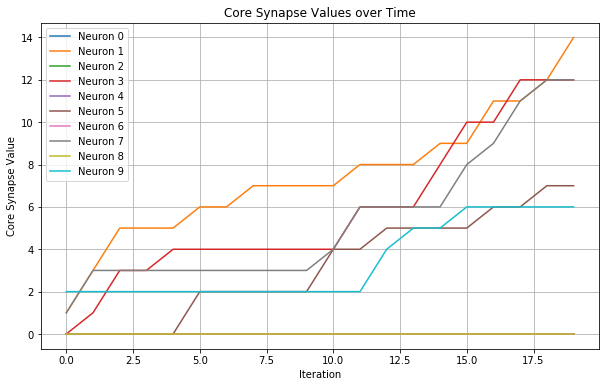

In [671]:
from time import sleep
num_neurons = 10
num_iterations = 20
relax = False;

readout = axi_direct_read.read(0)
# Initialize a matrix to store the core synapse values
core_synapse_values = np.zeros((num_neurons, num_iterations))
singleEvent = allocate(shape=(1,), dtype=np.uint32)
singleRelax = allocate(shape=(1,), dtype=np.uint32)
singleRelax[:] = TREFMASK
singleRelax.flush()

# Run the script multiple times and collect core synapse values
for iteration in range(num_iterations):
    if (relax):
        axi_dma.sendchannel.transfer(singleRelax)
        axi_dma.sendchannel.wait()
    else:
        singleEvent[0] = comboBuffer[::2][iteration]
        #singleEvent[1] = comboBuffer[(iteration*2) + 1]
        singleEvent.flush()
        axi_dma.sendchannel.transfer(singleEvent)
        axi_dma.sendchannel.wait()
        #axi_dma.sendchannel.transfer(singleRelax)
        #axi_dma.sendchannel.wait()
    sleep(.20)
    readout = axi_direct_read.read(0)
    print(readout, relax)
    if (readout & 0x80000000):
        relax = True;
     
    spi_loader(0, 1, ODIN_PROG_CONFIG)

    for i in range(num_neurons):
        x = spi_loader((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, iteration] = total

    spi_loader(0, 0, ODIN_PROG_CONFIG)

# Plot the core synapse values over time for each neuron
plt.figure(figsize=(10, 6))
for i in range(num_neurons):
    plt.plot(core_synapse_values[i], label=f"Neuron {i}")
plt.xlabel("Iteration")
plt.ylabel("Core Synapse Value")
plt.title("Core Synapse Values over Time")
plt.legend()
plt.grid(True)
plt.show()

[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7, 0, 1, 2, 3, 4, 5, 6, 8, 9]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 

2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7, 0, 1, 2, 3, 4, 5, 6, 8, 9]
2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483651
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198,

2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483651
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483651
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 2

2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483653
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229,

2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7, 0, 1, 2, 3, 4, 5, 6, 8, 9]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 19

2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7, 0, 1, 2, 3, 4, 5, 6, 8, 9]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198,

2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7, 0, 1, 2, 3, 4, 5, 6, 8, 9]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483648
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198,

2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 2

2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 2

2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483650
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247]
2147483655
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 229, 230, 231, 232, 245, 246, 247, 7]
2147483649
[67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 104, 105, 106, 107, 108, 121, 122, 123, 137, 138, 139, 152, 153, 154, 168, 169, 170, 183, 184, 185, 198, 199, 200, 214, 215, 216, 2

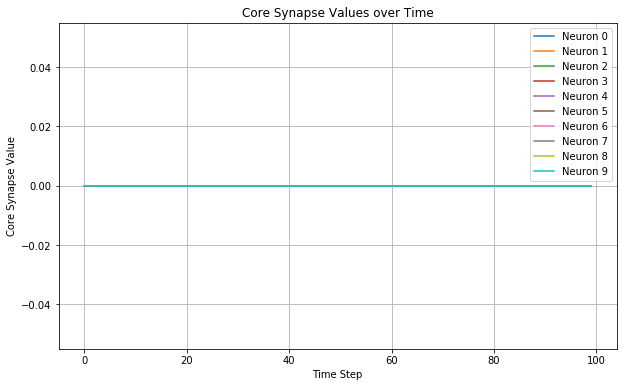

In [133]:
TREFMASK = 0x0000007F
SPKEMASK = 0x00000007
TX_BUFFER_LENGTH = 256
TX_BUFFER_LENGTH_2 = TX_BUFFER_LENGTH * 2

# Read rate-encoded data from the JSON file
with open("data/rate_encoded_data.json", "r") as json_file:
    rate_encoded_data = json.load(json_file)["rate_encoded_data"]

from pynq import allocate

nullBuffer = allocate(shape=(TX_BUFFER_LENGTH,), dtype=np.uint32)
nullBuffer[:] = TREFMASK
nullBuffer.flush()

singleRelax = allocate(shape=(1,), dtype=np.uint32)
singleRelax[:] = TREFMASK
singleRelax.flush()

from time import sleep

num_neurons = 10
num_iterations = len(rate_encoded_data[0]["rate_encoded_data"])  # Number of time steps in the rate-encoded data
#num_iterations = 20

readout = axi_direct_read.read(0)

# Initialize a matrix to store the core synapse values
core_synapse_values = np.zeros((num_neurons, num_iterations))
for x in range(5):
# Run the script for each time step
    for iteration in range(num_iterations):
        # Prepare the AER codes for the current time step
        aer_codes = [int(code, 16) for code in rate_encoded_data[0]["rate_encoded_data"][iteration]]
        if (iteration % 2 == 0):
            aer_codes.append(7)
        if (iteration % 8 == 0):
            aer_codes.extend([0,1,2,3,4,5,6,8,9])
        print(aer_codes)
        num_aer_codes = len(aer_codes)

        # Allocate memory for the AER codes
        aerBuffer = allocate(shape=(num_aer_codes,), dtype=np.uint32)

        # Fill the aerBuffer with the AER codes
        for i in range(num_aer_codes):
            aerBuffer[i] = ((aer_codes[i] & 0x000000FF) << 8) | SPKEMASK
        aerBuffer.flush()

        # Send the AER codes
        axi_dma.sendchannel.transfer(aerBuffer)
        axi_dma.sendchannel.wait()

        # Send the TREF code
        axi_dma.sendchannel.transfer(singleRelax)
        axi_dma.sendchannel.wait()

        sleep(.20)

        readout = axi_direct_read.read(0)
        print(readout)

#         spi_loader(0, 1, ODIN_PROG_CONFIG)
#         for i in range(num_neurons):
#             x = spi_loader((8 << 8) + i, 0, ODIN_READ_NEURON)
#             y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
#             total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
#             core_synapse_values[i, iteration] = total
#         spi_loader(0, 0, ODIN_PROG_CONFIG)

# Plot the core synapse values over time for each neuron
plt.figure(figsize=(10, 6))
for i in range(num_neurons):
    plt.plot(core_synapse_values[i], label=f"Neuron {i}")

plt.xlabel("Time Step")
plt.ylabel("Core Synapse Value")
plt.title("Core Synapse Values over Time")
plt.legend()
plt.grid(True)
plt.show()

In [74]:
rate_encoded_data[0]

{'image_index': 1,
 'inferred_label': 7,
 'original_image': [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.3327205777168274,
  0.8030637502670288,
  0.7157475352287292,
  0.4523897171020508,
  0.2911764681339264,
  0.2911764681339264,
  0.2911764681339264,
  0.2911764681339264,
  0.2654411792755127,
  0.04779411852359772,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.14368872344493866,
  0.33713236451148987,
  0.41219362616539,
  0.7587622404098511,
  0.8257965445518494,
  0.904411792755127,
  0.9022058844566345,
  0.8074142336845398,
  0.9927695989608765,
  0.33272057

0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
2147483648 False
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True


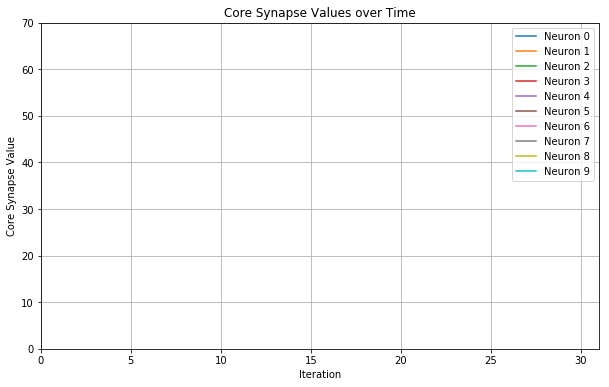

In [49]:
from time import sleep
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

num_neurons = 10
num_iterations = 64
relax = False
readout = axi_direct_read.read(0)
window_size = 32  # Size of the sliding window

# Initialize a matrix to store the core synapse values
core_synapse_values = np.zeros((num_neurons, num_iterations))

singleEvent = allocate(shape=(2,), dtype=np.uint32)

# Run the script multiple times and collect core synapse values
for iteration in range(num_iterations):
    if relax:
        axi_dma.sendchannel.transfer(singleRelax)
    else:
        singleEvent[0] = comboBuffer[iteration * 2]
        singleEvent[1] = comboBuffer[(iteration * 2) + 1]
        singleEvent.flush()
        axi_dma.sendchannel.transfer(singleEvent)
    axi_dma.sendchannel.wait()
    sleep(.20)
    readout = axi_direct_read.read(0)
    print(readout, relax)
    if readout & 0x80000000:
        relax = True
    spi_loader(0, 1, ODIN_PROG_CONFIG)
    for i in range(num_neurons):
        x = spi_loader((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, iteration] = total
    spi_loader(0, 0, ODIN_PROG_CONFIG)

# Set up the plot
fig, ax = plt.subplots(figsize=(10, 6))
lines = [ax.plot([], [], label=f"Neuron {i}")[0] for i in range(num_neurons)]
ax.set_xlim(0, window_size - 1)
ax.set_ylim(0, 70)
ax.set_xlabel("Iteration")
ax.set_ylabel("Core Synapse Value")
ax.set_title("Core Synapse Values over Time")
ax.legend()
ax.grid(True)

# Update function for the animation
def update(frame):
    start = max(0, frame - window_size + 1)
    end = frame + 1
    for i, line in enumerate(lines):
        y_data = core_synapse_values[i, start:end]
        line.set_data(np.arange(len(y_data)), y_data)
    return lines

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, blit=True, interval=100)

plt.show()

In [37]:

from IPython.display import HTML
HTML(ani.to_jshtml())

NameError: name 'num_neurons' is not defined

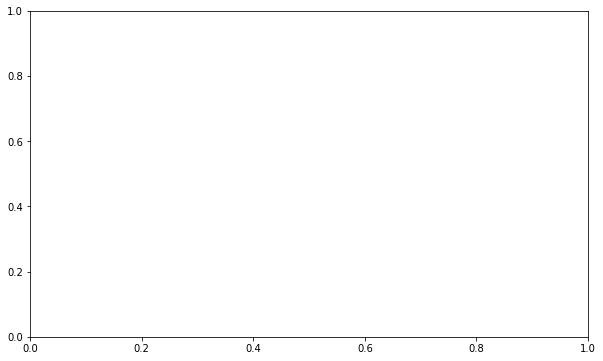

In [11]:

from IPython.display import HTML
from matplotlib.animation import FuncAnimation
fig, ax = plt.subplots(figsize=(10, 6))
core_synapse_values = np.zeros((num_neurons, num_iterations))
# Initialize the bar chart
bars = ax.bar(range(num_neurons), core_synapse_values[:, 0])
ax.set_xlabel("Neuron")
ax.set_ylabel("Core Synapse Value")
ax.set_title("Core Synapse Values over Time")
ax.set_xlim([-0.5, num_neurons - 0.5])
ax.set_ylim([0, 255])
plt.xticks(range(num_neurons), [f"Neuron {i+1}" for i in range(num_neurons)])

# Update function for the animation
def update(frame):
    singleEvent[0] = comboBuffer[frame*2]
    singleEvent[1] = nullBuffer[0]
    singleEvent.flush()
    axi_dma.sendchannel.transfer(singleEvent)
    axi_dma.sendchannel.wait()

    spi_loader(0, 1, ODIN_PROG_CONFIG)

    for i in range(num_neurons):
        x = spi_loader((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, frame] = total

    spi_loader(0, 0, ODIN_PROG_CONFIG)

    for bar, height in zip(bars, core_synapse_values[:, frame]):
        bar.set_height(height)

    ax.set_title(f"Core Synapse Values - Iteration {frame+1}")
    return bars

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, interval=100, blit=True)

HTML(ani.to_jshtml())
# Display the animation
plt.tight_layout()
plt.show()

In [390]:
HTML(ani.to_jshtml())

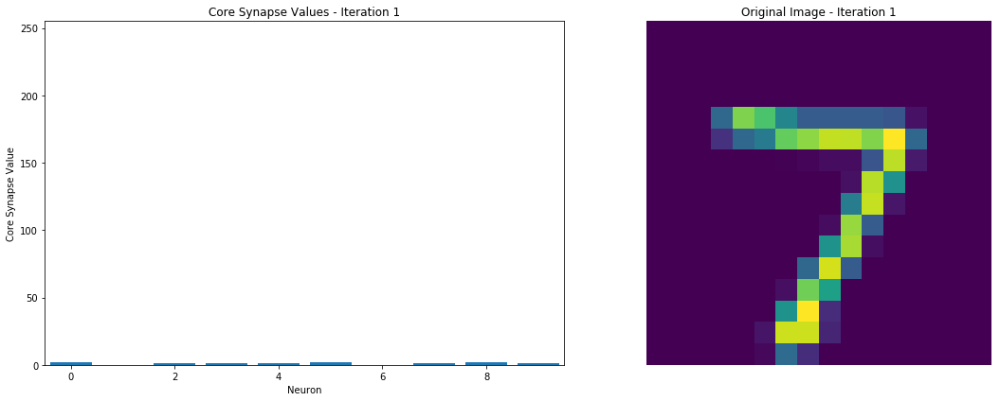

In [37]:
original_images = [np.array(data["original_image"]).reshape(16, 16) for data in aer_data]

from IPython.display import HTML
from matplotlib.animation import FuncAnimation


core_synapse_values = np.zeros((num_neurons, num_iterations))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Initialize the bar chart
bars = ax1.bar(range(num_neurons), core_synapse_values[:, 0])
ax1.set_xlabel("Neuron")
ax1.set_ylabel("Core Synapse Value")
ax1.set_title("Core Synapse Values over Time")
ax1.set_xlim([-0.5, num_neurons - 0.5])
ax1.set_ylim([0, 255])
plt.xticks(range(num_neurons), [f"Neuron {i+1}" for i in range(num_neurons)])

# Initialize the heatmap
heatmap = ax2.imshow(original_images[0], cmap='viridis', interpolation='nearest')
ax2.axis('off')
ax2.set_title("Original Image")

# Update function for the animation
def update(frame):
    singleEvent[0] = comboBuffer[frame*2]
    singleEvent[1] = nullBuffer[0]
    singleEvent.flush()
    axi_dma.sendchannel.transfer(singleEvent)
    axi_dma.sendchannel.wait()

    spi_loader(0, 1, ODIN_PROG_CONFIG)

    for i in range(num_neurons):
        x = spi_loader((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, frame] = total

    spi_loader(0, 0, ODIN_PROG_CONFIG)
   
    for bar, height in zip(bars, core_synapse_values[:, frame]):
        bar.set_height(height)
        
    ax1.set_title(f"Core Synapse Values - Iteration {frame+1}")
 
    
    heatmap.set_data(original_images[0 % len(original_images)])
    ax2.set_title(f"Original Image - Iteration {frame+1}")
    
    return bars, heatmap

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, interval=100, blit=False)

# Display the animation
plt.tight_layout()
plt.show()

In [396]:
HTML(ani.to_jshtml())

NameError: name 'core_synapse_values' is not defined

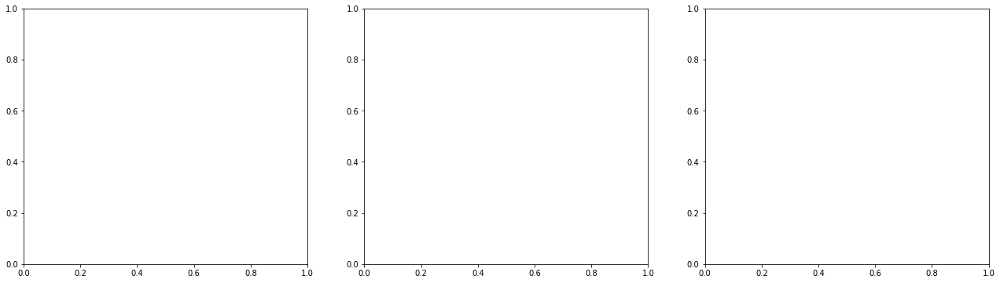

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from pynq import Overlay
from pynq import allocate
from time import sleep

# Load the AER data from the JSON file
with open("data/aer_data.json", "r") as json_file:
    aer_data = json.load(json_file)["aer_data"]

original_images = [np.array(data["original_image"]).reshape(16, 16) for data in aer_data]

num_neurons = 10
num_iterations = 198

fig, (ax1, ax3, ax2) = plt.subplots(1, 3, figsize=(22, 6))

# Initialize the bar chart
bars = ax1.bar(range(num_neurons), core_synapse_values[:, 0])
ax1.set_xlabel("Neuron")
ax1.set_ylabel("Core Synapse Value")
ax1.set_title("Core Synapse Values over Time")
ax1.set_xlim([-0.5, num_neurons - 0.5])
ax1.set_ylim([0, 80])
ax1.set_xticks(range(num_neurons))
#x1.set_xticklabels([f"{i}" for i in range(num_neurons)])

# Initialize the original image heatmap
heatmap_original = ax2.imshow(original_images[0], cmap='viridis', interpolation='nearest')
ax2.axis('off')
ax2.set_title("Original Image")

# Initialize the active synapse heatmap
active_synapse_image = np.zeros((16, 16))
highlight = np.zeros_like(active_synapse_image)
heatmap_active_synapse = ax3.imshow(active_synapse_image, cmap='binary', interpolation='nearest', vmin=0, vmax=1)
highlight_map = ax3.imshow(highlight, cmap='Blues', interpolation='nearest', vmin=0, vmax=1, alpha=0.8)
ax3.set_xticks(np.arange(-0.5, 16, 1), minor=True)
ax3.set_yticks(np.arange(-0.5, 16, 1), minor=True)
ax3.grid(which='minor', color='gray', linestyle='-', linewidth=0.2)
ax3.tick_params(which='minor', length=0)
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax3.set_title("Active Pre-synaptic Neuron")

relax = True
current_input = 0
countdown = 0
frame_true = -1
inferred = 0
# Initialize a matrix to store the core synapse values
core_synapse_values = np.zeros((num_neurons, num_iterations))

singleEvent = allocate(shape=(2,), dtype=np.uint32)
singleRelax = allocate(shape=(1,), dtype=np.uint32)
singleRelax[:] = TREFMASK

def init():
    global active_synapse_image
    active_synapse_image = np.zeros((16, 16))
    return [bars, heatmap_original, heatmap_active_synapse, highlight_map]

# Update function for the animation
def update(frame):
    global active_synapse_image
    global relax
    global current_input
    global countdown
    global frame_true
    global inferred
    
    frame_true += 1
    if (relax == True and countdown == 0):
        relax = False
        print(relax, current_input)
        for i in range(256):
            comboBuffer[i*2] = ((aer_codes[current_input][i] & 0x000000FF) << 8) | SPKEMASK
            comboBuffer[(i*2) + 1] = TREFMASK
        comboBuffer.flush()
        heatmap_original.set_data(original_images[current_input])
        current_input += 1
        frame_true = 0
    
    #if current_input == 2:
    #    current_input += 1
    
    if relax:
        axi_dma.sendchannel.transfer(singleRelax)
    else:
        singleEvent[0] = comboBuffer[frame_true * 2]
        singleEvent[1] = comboBuffer[(frame_true * 2) + 1]
        singleEvent.flush()
        axi_dma.sendchannel.transfer(singleEvent)
    axi_dma.sendchannel.wait()
    sleep(.20)

    readout = axi_direct_read.read(0)
    print(readout, relax)

    if readout & 0x80000000:
        relax = True
        countdown = 24
        inferred = readout & 0x000000FF
    
    countdown -= 1
    

    spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)

    for i in range(num_neurons):
        x = spi_loader_mmio((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader_mmio((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, frame] = total

    spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)

    for bar, height in zip(bars, core_synapse_values[:, frame]):
        bar.set_height(height)

    ax1.set_title(f"Core Synapse Values - Time Step {frame+1}")

    if relax:
        ax2.set_title(f"Original Image | Inferred: {inferred}")
    else:
        ax2.set_title(f"Original Image | Inferred: ...")
        
    aer_code = (singleEvent[0] >> 8) & 0xFF
    row = aer_code // 16
    col = aer_code % 16

    active_synapse_image = np.clip(active_synapse_image - 0.1, 0, None)
    if relax:
        active_synapse_image[row, col] = 0
        ax3.set_title(f"Active Synapse - TREF (no input)")
    else:
        active_synapse_image[row, col] = 1
        ax3.set_title(f"Active Synapse - {aer_code}")

    highlight = np.zeros_like(active_synapse_image)
    if not relax:
        highlight[row, col] = 1

    highlight_map.set_data(highlight)
    heatmap_active_synapse.set_data(active_synapse_image)



    return [bars, heatmap_original, heatmap_active_synapse, highlight_map]

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, interval=100, blit=False, init_func=init)

plt.tight_layout()

In [56]:
HTML(ani.to_jshtml())

False 0


TypeError: 'int' object is not subscriptable

In [367]:
spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)
for i in range(num_neurons):
    x = spi_loader_mmio((8 << 8) + i, 0, ODIN_READ_NEURON)
    y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
    total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
    print(i, total)
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)

0 48
1 36
2 53
3 49
4 19
5 42
6 45
7 7
8 44
9 20


0

In [232]:
comboBuffer.flush()
axi_dma.sendchannel.transfer(comboBuffer)
axi_dma.sendchannel.wait()

In [41]:
nullBuffer.flush()
axi_dma.sendchannel.transfer(nullBuffer)
axi_dma.sendchannel.wait()

In [174]:
singleEvent = allocate(shape=(2,), dtype=np.uint32)
singleEvent[0] = comboBuffer[0 * 2]
singleEvent[1] = comboBuffer[(0 * 2) + 1]

axi_dma.sendchannel.transfer(singleEvent)

In [347]:
comboBuffer[255*2 + 1]

127

In [235]:
spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)
for i in range(num_neurons):
    x = spi_loader_mmio((8 << 8) + i, 0, ODIN_READ_NEURON)
    y = spi_loader_mmio((9 << 8) + i, 0, ODIN_READ_NEURON)
    total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
    print(i,total)
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)

0 0
1 0
2 0
3 0
4 0
5 0
6 0
7 0
8 0
9 0


0

In [414]:
axi_direct_read.read(0)

0

In [336]:
2%256

2

In [404]:
!pip3 install ffmpeg

  Retrying (Retry(total=4, connect=None, read=None, redirect=None, status=None)) after connection broken by 'NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0xb59b25f0>: Failed to establish a new connection: [Errno -3] Temporary failure in name resolution',)': /simple/ffmpeg/
  Retrying (Retry(total=3, connect=None, read=None, redirect=None, status=None)) after connection broken by 'NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0xb59b2490>: Failed to establish a new connection: [Errno -3] Temporary failure in name resolution',)': /simple/ffmpeg/
  Retrying (Retry(total=2, connect=None, read=None, redirect=None, status=None)) after connection broken by 'NewConnectionError('<urllib3.connection.VerifiedHTTPSConnection object at 0xb59b2e50>: Failed to establish a new connection: [Errno -3] Temporary failure in name resolution',)': /simple/ffmpeg/
  Retrying (Retry(total=1, connect=None, read=None, redirect=None, status=None)) after conn

In [416]:
ani.save('animation_download_b.html', writer='html', fps=30)

0 True
0 True
0 True
0 True
False 7
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
2147483657 False
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
False 8
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
0 False
2147483654 False
0 True
0 True
0 True
0 True
0 True
0 True

In [428]:
html_content = ani.to_jshtml()

with open('animation.html', 'w') as f:
    f.write(html_content)

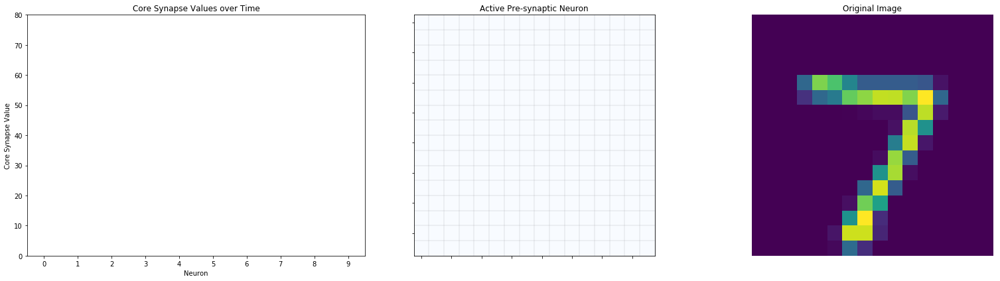

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation
from pynq import Overlay
from pynq import allocate
from time import sleep

# Load the rate-encoded data from the JSON file
with open("data/rate_encoded_data.json", "r") as json_file:
    rate_encoded_data = json.load(json_file)["rate_encoded_data"]

original_images = [np.array(data["original_image"]).reshape(16, 16) for data in rate_encoded_data]

num_neurons = 10
num_iterations = 10

fig, (ax1, ax3, ax2) = plt.subplots(1, 3, figsize=(22, 6))

# Initialize the bar chart
bars = ax1.bar(range(num_neurons), np.zeros(num_neurons))
ax1.set_xlabel("Neuron")
ax1.set_ylabel("Core Synapse Value")
ax1.set_title("Core Synapse Values over Time")
ax1.set_xlim([-0.5, num_neurons - 0.5])
ax1.set_ylim([0, 80])
ax1.set_xticks(range(num_neurons))

# Initialize the original image heatmap
heatmap_original = ax2.imshow(original_images[0], cmap='viridis', interpolation='nearest')
ax2.axis('off')
ax2.set_title("Original Image")

# Initialize the active synapse heatmap
active_synapse_image = np.zeros((16, 16))
highlight = np.zeros_like(active_synapse_image)
heatmap_active_synapse = ax3.imshow(active_synapse_image, cmap='binary', interpolation='nearest', vmin=0, vmax=1)
highlight_map = ax3.imshow(highlight, cmap='Blues', interpolation='nearest', vmin=0, vmax=1, alpha=0.8)
ax3.set_xticks(np.arange(-0.5, 16, 1), minor=True)
ax3.set_yticks(np.arange(-0.5, 16, 1), minor=True)
ax3.grid(which='minor', color='gray', linestyle='-', linewidth=0.2)
ax3.tick_params(which='minor', length=0)
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax3.set_title("Active Pre-synaptic Neuron")

relax = True
current_input = 0
countdown = 0
frame_true = -1
inferred = 0
# Initialize a matrix to store the core synapse values
core_synapse_values = np.zeros((num_neurons, num_iterations))

singleRelax = allocate(shape=(1,), dtype=np.uint32)
singleRelax[:] = TREFMASK

def init():
    global active_synapse_image
    active_synapse_image = np.zeros((16, 16))
    return [bars, heatmap_original, heatmap_active_synapse, highlight_map]

# Update function for the animation
def update(frame):
    global active_synapse_image
    global relax
    global current_input
    global countdown
    global frame_true
    global inferred
    
    frame_true += 1
    if relax:
        axi_dma.sendchannel.transfer(singleRelax)
    else:
        aer_codes = [int(code, 16) for code in rate_encoded_data[current_input]["rate_encoded_data"][frame_true]]
        num_aer_codes = len(aer_codes)
        aerBuffer = allocate(shape=(num_aer_codes,), dtype=np.uint32)
        for i in range(num_aer_codes):
            aerBuffer[i] = ((aer_codes[i] & 0x000000FF) << 8) | SPKEMASK
        aerBuffer.flush()
        axi_dma.sendchannel.transfer(aerBuffer)
    
    axi_dma.sendchannel.wait()
    sleep(.20)

    readout = axi_direct_read.read(0)
    print(readout, relax)

    if readout & 0x80000000:
        relax = True
        countdown = 24
        inferred = readout & 0x000000FF
        current_input += 1
        frame_true = -1
        if current_input == len(rate_encoded_data):
            current_input = 0
    
    countdown -= 1
    

    spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)

    for i in range(num_neurons):
        x = spi_loader_mmio((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader_mmio((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, frame] = total

    spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)

    for bar, height in zip(bars, core_synapse_values[:, frame]):
        bar.set_height(height)

    ax1.set_title(f"Core Synapse Values - Time Step {frame+1}")

    if relax:
        ax2.set_title(f"Original Image | Inferred: {inferred}")
    else:
        ax2.set_title(f"Original Image | Inferred: ...")
        
    if not relax:
        aer_code = (aerBuffer[0] >> 8) & 0xFF
        row = aer_code // 16
        col = aer_code % 16

        active_synapse_image = np.clip(active_synapse_image - 0.1, 0, None)
        active_synapse_image[row, col] = 1
        ax3.set_title(f"Active Synapse - {aer_code}")

        highlight = np.zeros_like(active_synapse_image)
        highlight[row, col] = 1
    else:
        active_synapse_image = np.clip(active_synapse_image - 0.1, 0, None)
        ax3.set_title(f"Active Synapse - TREF (no input)")
        highlight = np.zeros_like(active_synapse_image)

    highlight_map.set_data(highlight)
    heatmap_active_synapse.set_data(active_synapse_image)
    heatmap_original.set_data(original_images[current_input])

    return [bars, heatmap_original, heatmap_active_synapse, highlight_map]

# Create the animation
ani = FuncAnimation(fig, update, frames=num_iterations, interval=100, blit=False, init_func=init)

plt.tight_layout()

In [47]:
HTML(ani.to_jshtml())

0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True
0 True


In [26]:
spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)  


weightmap  = []

neuron_num = 7
for i in range(256):
    synapse = i % 32
    spi_base_address= i * 32
    byte_offset = (neuron_num//2) % 4
    nibble_offset = neuron_num % 2
    row_offset = (neuron_num % 32) // 8
    spi_address = (byte_offset << 13) + row_offset + spi_base_address
    
    readback = spi_loader_mmio(spi_address, 0, ODIN_READ_SYNAPSE)
    if (nibble_offset == 1):
        weight = readback >> 4
    else:
        weight = readback
    weight &= 0x00000007
    
    weightmap.append(weight)
    
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)  

0

In [27]:
np_weightmap = np.array(weightmap).reshape(16,16)

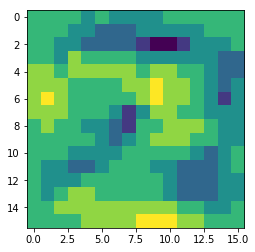

In [28]:
plt.imshow(np_weightmap, cmap='viridis', interpolation='nearest')
plt.show()

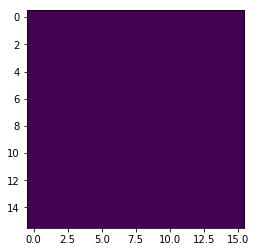

In [35]:

spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)  


weightmap  = []

neuron_num = 0
for i in range(256):
    synapse = i % 32
    spi_base_address= i * 32
    byte_offset = (neuron_num//2) % 4
    nibble_offset = neuron_num % 2
    row_offset = (neuron_num % 32) // 8
    spi_address = (byte_offset << 13) + row_offset + spi_base_address
    
    readback = spi_loader_mmio(spi_address, 0, ODIN_READ_SYNAPSE)
    if (nibble_offset == 1):
        weight = readback >> 4
    else:
        weight = readback
    weight &= 0x00000007
    
    weightmap.append(weight)
    
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)  

np_weightmap = np.array(weightmap).reshape(16,16)

plt.imshow(np_weightmap, cmap='viridis', interpolation='nearest', vmin = 0, vmax=7)
plt.show()

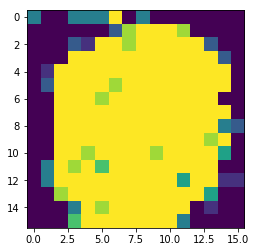

In [145]:

spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)  

def read_weights(neuron_num):
    spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)
    neuron_num = int(neuron_num)
    weightmap = []
    for i in range(256):
        synapse = i % 32
        spi_base_address = i * 32
        byte_offset = (neuron_num // 2) % 4
        nibble_offset = neuron_num % 2
        row_offset = (neuron_num % 32) // 8
        spi_address = (byte_offset << 13) + row_offset + spi_base_address
        
        readback = spi_loader_mmio(spi_address, 0, ODIN_READ_SYNAPSE)
        if (nibble_offset == 1):
            weight = readback >> 4
        else:
            weight = readback
        weight &= 0x00000007
        weightmap.append(weight)
    
    spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)
    
    np_weightmap = np.array(weightmap).reshape(16, 16)
    return np_weightmap

weightmap  = []

neuron_num = 2
for i in range(256):
    synapse = i % 32
    spi_base_address= i * 32
    byte_offset = (neuron_num//2) % 4
    nibble_offset = neuron_num % 2
    row_offset = (neuron_num % 32) // 8
    spi_address = (byte_offset << 13) + row_offset + spi_base_address
    
    readback = spi_loader_mmio(spi_address, 0, ODIN_READ_SYNAPSE)
    if (nibble_offset == 1):
        weight = readback >> 4
    else:
        weight = readback
    weight &= 0x00000007
    
    weightmap.append(weight)
    
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)  

np_weightmap = np.array(weightmap).reshape(16,16)

plt.imshow(np_weightmap, cmap='viridis', interpolation='nearest', vmin=0, vmax=7)
plt.show()

In [600]:
readback = spi_loader_mmio(spi_address+32, 0, ODIN_READ_SYNAPSE)
print(bin(readback))

0b10011001


In [70]:
np_weightmap

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 3, 1, 1, 2, 2, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 3, 3, 0, 0, 1, 2, 1, 0, 0, 0, 0],
       [0, 0, 0, 0, 2, 3, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 2, 2, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 5, 2, 2, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0]])

In [ ]:
positive_int_array

In [138]:
import os
import pickle
import numpy as np
from PIL import Image

# Path to the pickle file
pickle_file = './mnist_images/mnist_data.pkl'

# Load data from pickle file
with open(pickle_file, 'rb') as f:
    data = pickle.load(f)

# Parameters
new_size = (16, 16)
frequency = 2500  # 1kHz
duration = 1  # 250 ms
num_time_steps = int(frequency * duration)

truncated_time = 60
# Function to resize image
def resize_image(image, size):
    pil_image = Image.fromarray(image)
    resized_image = pil_image.resize(size, Image.ANTIALIAS)
    return np.array(resized_image)

# Function to apply soft thresholding
def soft_threshold(image_array, threshold=0.1):
    return np.sign(image_array) * np.maximum(np.abs(image_array) - threshold, 0)

# Function to generate Bernoulli spike train for a given pixel value
def generate_bernoulli_spike_train(pixel_value, num_time_steps):
    return np.random.binomial(1, pixel_value, size=num_time_steps).tolist()

# Function to generate Bernoulli spike train for teacher signals
def generate_teacher_spike_train(frequency, num_time_steps):
    return np.random.binomial(1, frequency, size=num_time_steps).tolist()

# Process data to generate spike trains and aer codes
aer_codes_data = []
inter = 1
for image, label in data[0:300]:  # Change the slice to process more images
    if (inter % 25 == 0):
        print("Progress 1: ", inter/300)
    resized_image = resize_image(image, new_size)
    normalized_image = resized_image / 255.0  # Normalize the image to [0, 1]
    thresholded_image = soft_threshold(normalized_image)  # Apply soft thresholding
    spike_trains = []
    for pixel_value in thresholded_image.flatten():
        spike_train = generate_bernoulli_spike_train(pixel_value*.5, num_time_steps)
        spike_trains.append(spike_train)
    spike_trains = np.array(spike_trains)
    
    # Generate aer codes
    aer_codes = [] * num_time_steps
    for t in range(num_time_steps):
        spiking_pixels = np.where(spike_trains[:, t] == 1)[0].tolist()
        spiking_pixels = [((pixel & 0x000000FF) << 8) | SPKEMASK for pixel in spiking_pixels]
        aer_codes.append(spiking_pixels)
        #aer_codes.append([])
        
    # Generate teacher signals
    target_teacher_spike_train = generate_teacher_spike_train(.6, num_time_steps)
    other_teacher_spike_train = generate_teacher_spike_train(.2, num_time_steps)
    
    for t in range(truncated_time):
        #if ((t % 10) == 0):
        #    aer_codes[t].append(((0))) #BIST
        if target_teacher_spike_train[t] == 1:
            aer_codes[t].append(((label & 0x000000FF) << 8) | 0xE1)
            aer_codes[t].append(((label & 0x000000FF) << 8) | 0xE1)
            aer_codes[t].append(((label & 0x000000FF) << 8) | 0xE1)
        for i in range(10):
            if i != label and other_teacher_spike_train[t] == 1:
                #for i in range(0, len(aer_codes[t]), 2):
                aer_codes[t].insert(i, ((i & 0x000000FF) << 8) | 0xE1)
                aer_codes[t].insert(i, ((i & 0x000000FF) << 8) | 0xE1)

    aer_codes_data.append((aer_codes, label))
    inter += 1
    
inter = 1
frame_count = 0
for aer_codes, label in aer_codes_data:


    nullBuffer.flush()
    axi_dma.sendchannel.transfer(nullBuffer)
    axi_dma.sendchannel.wait()
    #singleBIST = allocate(shape=(1,), dtype=np.uint32)
    #singleBIST[:] = 0
    #singleBIST.flush()
    #axi_dma.sendchannel.transfer(singleBIST)
    #axi_dma.sendchannel.wait()
    
    
    print(label)
    for t in range(truncated_time):
        spiking_pixels = aer_codes[t]
        if spiking_pixels:
            # Allocate buffer for the current timestep events
            events = allocate(shape=(len(spiking_pixels),), dtype=np.uint32)
            for i, pixel in enumerate(spiking_pixels):
                events[i] = pixel  # Assign pixel index
            # Send the event to the processor
            events.flush()
            print(events)
            axi_dma.sendchannel.transfer(events)

            
        # Progress the timestep
        singleRelax = allocate(shape=(1,), dtype=np.uint32)
        singleRelax[:] = TREFMASK
        singleRelax.flush()
        axi_dma.sendchannel.transfer(singleRelax)
        axi_dma.sendchannel.wait()
        

#         readout = axi_direct_read.read(0)
#         print(readout)
#         if((readout & 0x80000000) != 0):
#             print("BIST")
#             singleBist = allocate(shape=(1,), dtype=np.uint32)
#             singleBist[:] = ((label & 0x000000FF) << 8) | 0x00000080
#             singleBist.flush()
#             axi_dma.sendchannel.transfer(singleBist)
#             axi_dma.sendchannel.wait()

#         weightmap = read_weights(label)
        
#         fig, axs = plt.subplots(1, 4, figsize=(16, 4))

#         # Plot the heatmap in the first subplot
#         axs[0].imshow(weightmap, cmap='viridis', interpolation='nearest', vmin=0, vmax=7)
#         axs[0].set_title(f'Frame {frame_count}')
#         axs[0].axis('off')

#         # Create arrays to store the calcium, core, and caleak_cnt values for neurons 0-9
#         calcium_values = []
#         core_values = []
#         caleak_cnt_values = []

#         # Iterate over neurons 0-9
#         for neuron_idx in range(10):
#             calcium, core, caleak_cnt = return_neuron_ca_values(neuron_idx)
#             calcium_values.append(calcium)
#             core_values.append(core)
#             caleak_cnt_values.append(caleak_cnt)

#         # Create a figure for heatmaps
#         fig_heatmaps, axs_heatmaps = plt.subplots(2, 5, figsize=(15, 6))
#         axs_heatmaps = axs_heatmaps.flatten()

#         # Create subplots for each neuron index 0-9
#         for i in range(10):
#             weightmap = read_weights(i)
#             axs_heatmaps[i].imshow(weightmap, cmap='viridis', interpolation='nearest', vmin=0, vmax=7)
#             axs_heatmaps[i].set_title(f'Neuron {i}')
#             axs_heatmaps[i].axis('off')

#         # Adjust the spacing between subplots for heatmaps
#         plt.tight_layout()

#         # Save the heatmap figure
#         plt.savefig(f'frames11/heatmaps_frame_{frame_count:04d}.png')
#         plt.close(fig_heatmaps)

#         # Create a figure for bar graphs
#         fig_bargraphs, axs_bargraphs = plt.subplots(3, 1, figsize=(8, 12))

#         # Create the calcium bar chart
#         axs_bargraphs[0].bar(range(10), calcium_values)
#         axs_bargraphs[0].set_ylim(0, 7)
#         axs_bargraphs[0].set_xlabel('Neuron Index')
#         axs_bargraphs[0].set_ylabel('Calcium Value')
#         axs_bargraphs[0].set_title('Calcium Values')
#         axs_bargraphs[0].set_xticks(range(10))
#         axs_bargraphs[0].set_xticklabels([str(i) for i in range(10)])

#         # Create the core bar chart
#         axs_bargraphs[1].bar(range(10), core_values)
#         axs_bargraphs[1].set_ylim(0, 256)
#         axs_bargraphs[1].set_xlabel('Neuron Index')
#         axs_bargraphs[1].set_ylabel('Core Value')
#         axs_bargraphs[1].set_title('Core Values')
#         axs_bargraphs[1].set_xticks(range(10))
#         axs_bargraphs[1].set_xticklabels([str(i) for i in range(10)])

#         # Create the caleak_cnt bar chart
#         axs_bargraphs[2].bar(range(10), caleak_cnt_values)
#         axs_bargraphs[2].set_ylim(0, 26)
#         axs_bargraphs[2].set_xlabel('Neuron Index')
#         axs_bargraphs[2].set_ylabel('Caleak_cnt Value')
#         axs_bargraphs[2].set_title('Caleak_cnt Values')
#         axs_bargraphs[2].set_xticks(range(10))
#         axs_bargraphs[2].set_xticklabels([str(i) for i in range(10)])

#         # Adjust the spacing between subplots for bar graphs
#         plt.tight_layout()

#         # Save the bar graph figure
#         plt.savefig(f'frames11/bargraphs_128thrs_10leak_1ts{frame_count:04d}.png')
#         plt.close(fig_bargraphs)

        frame_count += 1
        
        
#         readout = axi_direct_read.read(0)
#         print(readout)
#         if((readout & 0x80000000) != 0):
#             print("something")
#             nullBuffer.flush()
#             axi_dma.sendchannel.transfer(nullBuffer)
#             axi_dma.sendchannel.wait()
    inter += 1
            


# Check the first few aer codes



Progress 1:  0.08333333333333333
Progress 1:  0.16666666666666666
Progress 1:  0.25
Progress 1:  0.3333333333333333
Progress 1:  0.4166666666666667
Progress 1:  0.5
Progress 1:  0.5833333333333334
Progress 1:  0.6666666666666666
Progress 1:  0.75
Progress 1:  0.8333333333333334
Progress 1:  0.9166666666666666
Progress 1:  1.0
5
[14087 15367 22279 22791 30727 43783 47367 50695 50951  1505  1505  1505]
[14599 14855 18439 26375 30727 34823 35079 43271 43783 47367 50439 50695
 51207 54023 54279]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 14087 15367 17927 18951 22023 26375
 30471 34823 39431 47111 50695 54535 58119  1505  1505  1505]
[14343 15367 17415 17671 18183 18439 18695 21767 30471 34823 46855 47367
 50695 50951 54023 54279 54535 54791 58375]
[14343 17415 18439 18695 21767 22023 30727 35079 46855 47111 54535 54791
  1505  1505  1505]
[13831 14087 14855 15111 15367 17415 17671 26375 30727 39431 43527 47367
 47623 50951

[10759 15111 18183 18439 22023 23559 33799 34055 35847 43527 46087 46343
 46855 50183 50439 50951 54279]
[14343 18695 22023 22279 26119 29959 30215 31495 33799 46087 46343 50695
 50951 51207 55047]
[18183 18439 22791 27655 29703 29959 31495 33799 34055 43271 50183 50695
 54791   225   225   225]
[10503   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 18183 18439 18951 19207 23559
 27655 31751 33799 35847 46087 47111   225   225   225]
[14343 14599 14855 18183 18439 18695 18951 22791 27655 30215 31751 37639
 37895 41991 47623 51207 54535   225   225   225]
[10759 14599 14855 18183 18439 18951 22791 25863 26375 27399 27655 29959
 35847 37895 39687 41991 43527 50439 50951 51207 55047]
[10759 14343 14599 14855 18695 22279 22535 23559 25863 29959 31751 33799
 41991 45831 47367 50951]
[14855 22791 23559 25863 29703 29959 39687 41991 43527 47111 50439 50951
 51207 54535   225   225   225]
[10759 14343 14599 23303 27655 29959 31751 37

[15111 18951 23047 26887 30727 38663 46343 46855 50695 54535 54791   481
   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 26887 34823 38919 42759 46343   481
   481   481]
[23047 27143 34823 38919 42503 46343 46855 50439 54791   481   481   481]
[14855 18695 23047 27143 30727 54535   481   481   481]
[18951 34823 38407 38663 46599 54791   481   481   481]
[15111 18951 22791 34567 38663 46599 54535 54791   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 23047 26631 26887 27143 34823 42247
 42759 50695 54535 54791]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14855 15111 19207 26887 30727 38663
 46599 54791 58887]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 15111 19207 26631 26887 34823 38407
 38663 42503 46

[22023 23047 23303 25607 25863 29703 33799 34311 34567 35079 38151 38919
 43015 51207 55303]
[18183 18951 22279 22791 23047 26887 27143 29703 30727 30983 34055 37895
 38151 42759 43015 51207 55303]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18183 22279 26887 29703 31239 34055
 34311 34823 38407 47111 55303 55559 63751]
[18439 22023 26887 27143 29703 30983 34055 34567 34823 39175 47367 59399
 59655 59911  2529  2529  2529]
[18183 18951 22279 23047 23303 27399 31239 34055 34567 39175 43271 51207
 55559  2529  2529  2529]
[18439 18695 19207 23047 23303 27143 34055 34823 37895 38663 43271 47111
 51207 55303]
[18439 22023 22279 22791 23303 26119 27143 29703 29959 30727 30983 34567
 35079 47111 51207 55303  2529  2529  2529]
[18439 18951 19207 23047 25863 26119 31239 33799 34055 34823 39175 47111
 51207 51463 59399]
[18695 19207 22279 23303 25863 30727 30983 33799 34567 34823 38663 47111
 59655]
[  225   481   737   993  1249

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18183 22535 26631 30727 30983 38919
 39175 47367 51207 51463   481   481   481]
[ 9991 14087 18439 22279 30471 34823 43015 51207]
[ 9991 14343 18183 22279 22535 26631 47367 55559   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 34823 38919 43015 47111 51463 55559
   481   481   481]
[14087 22279 22535 34567 38663 38919 43015 51463 51719 55559   481   481
   481]
[18439 26631 26887 30471 30727 34823 38919 43015 51463   481   481   481]
[14087 18183 18439 22279 26631 30471 30727 34823 43015 47367   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 26375 30471 38919 43015 43271 47111
 51207 55559   481   481   481]
[14087 18183 26375 26631 34823 43015 43271 47367 51207   481   481   481]
[14087 18183 18439 22279 22535 26631 3

[14599 14855 17671 17927 18183 18951 19207 23559 27399 30983 31239 34055
 34311 34567 39175 45831 47367 47623 50183 54791]
1
[18183 22279 26631 30727 34823 43015 47111   481   481   481]
[14343 18439 22279 22535 26631 34823 38919 42759 43015 51207 55559   481
   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14087 14343 22535 34823 43015 43271
 47111   481   481   481]
[14343 18183 22535 38919 43015   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 26375 43015   481   481   481]
[14087 18439 26375 30727 55303 59399]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18183 18439 22279 26375 26631 30471
 34823 43271 51207]
[18183 18439 26375 26631 34823 43015 47111 47367]
[14087 14343 18183 30727 38919 43015 51207 55303   481   481   481]
[18183 30727 34823 38919 51207   481   48

[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 15367 26375 35079 50695 50951 54791]
[15367 19207 22279 23303 30471 38663 39175 46599]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 23559 34311 34567 38919 43015 46855
 50695  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 11527 22279 31239 38151 38407 39175
 39431 41991 46855  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 15367 26375 27143 27399 30215 33799
 34055 34567 37895 38919 39175 43015 46599 46855 50695]
[15367 15623 19463 23559 30471 31239 37895 38663 42759 46599 50695]
[19207 23303 27399 30215 34567 38663 46855  1249  1249  1249]
[22279 26375 27399 29959 30215 34311 34823 35079 39175 39431 42759 43015
 46855 50439 50695 50951  1249  1249  1249

[22791 26887 30471 34311 43015 46343]
[19207 23303 23559 26887 34567 38151 41991 46343 46599  1505  1505  1505]
[19719 19975 22791 23047 23815 34311 37895 38919 42247 46599 46855  1505
  1505  1505]
[19975 23047 26887 34567 38663  1505  1505  1505]
[23303 26631 27143 34567 38663 38919 42759 46599 46855  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 19719 19975 22791 23047 26887 30471
 38663 38919 41991 42759 46599 46855]
[19975 23559 26631 30471 34311 38919 41735 46343 46599 46855  1505  1505
  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 23303 23559 26631 34311 34567 38663
 41991 42759 46343  1505  1505  1505]
[19207 23303 23815 34311 34567 38919  1505  1505  1505]
[19975 34311 38663 38919 41991 43015 46599  1505  1505  1505]
[23559 26887 34311 34567 38663 46087  1505  1505  1505]
[19719 26887 27143 34311 38663 43015 46087 46599 46855

[13831 14087 18439 30215 30471 30727 30983 35335 39431 44039 47623 50695
 50951 51463 51719 54791   993   993   993]
[12807 13575 14343 17671 17927 26375 30471 30983 34823 35079 44039 47879
 50183 50439 51207 51719 51975 54535 54791]
[13063 13319 14087 14343 18695 23047 26119 30727 31239 35079 35847 39943
 50951 51719 55047 55303 55559]
[12807 13063 14343 14599 18951 30215 30983 35079 46087 47879 50183 54791
 55559]
[13063 14087 17159 18183 18695 22535 26375 30215 30471 35335 39943 48135
 50183 54535 55303   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13063 13575 17159 18695 22791 26631
 30215 30471 30727 30983 35079 39687 39943 43783 44039 46343 47623 48135
 50183 50439 51463 55047]
[12807 13319 14087 16903 18439 18695 30215 30727 35335 35591 39687 43783
 46087 47879 50439 51975 54791   993   993   993]
[13063 13319 17415 18695 18951 26119 26375 26631 35079 35335 39431 46343
 47623 48135 51719 54791   9

[34823 38919 42759 50951 51207]
[14087 18183 22535 26375 30727 34567 38663 43015 51207 55303]
[14087 18183 22535 38663 38919 50951]
[14087 22279 26375 34823 38919 42759 47111 51207 55303   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 22535 26631 38663 38919 42759 55303
   481   481   481]
[22535 26631 30727 34567 38663 55047   481   481   481]
[22535 26631 30471 30727 34823 46855 47111 50951 59399]
[22279 34567 43015   481   481   481]
[18183 22279 22535 26631 30471 30727 34823 38919 51207   481   481   481]
[22279 22535 26631 47111]
[22535 30471 30727 34567 38919 43015 50951   481   481   481]
[14087 18183 22535 26631 30727 43015 47111 50951   481   481   481]
[22535 26631 34567 34823 43015 55303]
[22279 30471 38919 42759 43015 51207 55047 55303   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14087 18183 38919 42759 47111 51

[18439 18951 19207 22279 22535 25863 27143 29959 31239 31495 50695 50951
 54791]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 21767 22023 22279 22535 23303 23559
 27143 29959 33799 35079 35335 54791]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 18439 19207 19463 21767 22023 27143
 27399 29703 38919 42759 43015 47111  2017  2017  2017]
[19207 22535 22791 23303 25863 27143 29959 31239 31495 42759 43015 46599
 50695 50951 54535 58631  2017  2017  2017]
[18439 18695 18951 19207 23047 25863 29703 31239 31495 42759 47111 54535
  2017  2017  2017]
[18695 19207 21767 22023 22535 23303 25863 26119 27143 27399 29703 31239
 33799 35079 35335 38919 46855 54791 58631 62727  2017  2017  2017]
[18951 22023 22279 25607 25863 26119 29959 31239 35335 43015 47111 50695
 58631]
[19463 23047 25863 26119 26375 29959 31495 35335 38919 39175 43015 50695
  2017  2017  2017]
2
[14087

[18183 18951 23047 23303 30215 30727 30983 34823 38663 46087 46343 50183
 50695 50951 54791 58631  2273  2273  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 18183 18439 19207 19463 23047 23303
 26119 30983 38663 38919 50951 51207 54279 54791  2273  2273  2273]
[15111 15367 18183 18695 19207 22279 22535 23047 30983 34567 34823 38407
 42503 43015 46087 46343 46855 47111 50439 54535  2273  2273  2273]
[15111 18695 22279 23047 26887 27143 30471 34567 34823 38407 38919 42759
 43015 46855 50695  2273  2273  2273]
[19207 22279 23047 23303 26119 30215 30983 34311 34567 38151 38407 42247
 42503 46087 50183 50695 50951 54791]
[19207 22023 23303 26375 34567 38663 42503 42759 46343 46855 54535]
[18183 18439 19207 23303 26119 26375 30727 30983 34567 38151 38407 38663
 46087 46855  2273  2273  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 15111 17927 18695 22023

[10759 14343 42247 46343 47623]
[10759 30215 39431 42247 43783 50951]
[14343 30983 34055 35335 46343 47623 50951 55303]
[14343 18439 30215 30727 30983 38151 46343 46599 50695 51463  1761  1761
  1761]
[18183 22279 26375 34055 34823 35079 43527 50695 51463  1761  1761  1761]
[10503 14599 18183 30983 35335 39431 43783  1761  1761  1761]
[22279 30215 30983 34311 47623 50695 50951  1761  1761  1761]
[10759 14599 34055 42503 46343 47623 51463]
[10503 14599 30215 35079 42247 43527 46343]
[10759 22279 38407 42503 46343 51463  1761  1761  1761]
9
[18183 18439 26119 27143 30983 34567 34823 35079 38919 46855 50951 54791]
[18695 22023 22279 22791 30471 30983 34567 35079 43015 46855 50695 54791
 58631  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 22023 22279 23303 26375 27399
 34311 34567 35079 50951  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993 

[14855 17159 18951 21255 22791 25351 29447 31495 33799 34055 34823 35079
 39687 42247 43527 43783 47367 47623 47879 51719 51975 56071]
[14855 16903 18951 19207 25351 25607 27143 29447 29703 31239 34311 34823
 39431 39687 42247 43527 56071]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 14855 18951 23047 29703 31495 33543
 34055 34311 34567 34823 35079 38151 38407 39431 39687 42247 47623 47879
 51719 51975 52231  1249  1249  1249]
[17159 18951 21255 21511 23303 25095 25607 27143 27399 30727 30983 34055
 34311 34823 35079 35335 35591 38407 38663 42247 43527 47879  1249  1249
  1249]
[16903 19207 27143 29703 30727 30983 33799 34055 34311 34567 35335 38407
 38663 39175 43527 47367 47879 51975  1249  1249  1249]
[10759 17159 18951 20999 21255 25351 29703 29959 33799 34567 35079 35335
 35591 37895 38151 38407 39175 41991 43783 51975 52231 56071  1249  1249
  1249]
[21255 22791 23047 25351 27143 30727 31495 33799 34055 34567 35335

[10759 11015 14599 18439 22279 22535 27399 27655 33799 39687 39943 43783
 45831 47623 50183 50951 54535 54791 55047]
[14855 18183 18951 19463 22023 22279 26119 26887 29959 35847 37895 39943
 41735 43783 47367 50183 50439 50695 50951   225   225   225]
[10759 14599 15367 22023 22791 23047 26887 27399 29703 35591 35847 37639
 39687 43527 45831 50439 50695 50951 54791 55047   225   225   225]
[10759   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 18951 19207 23047 23559
 25863 33799 35591 41735 46087 50439 50695 50951   225   225   225]
[11015 14599 14855 18951 19207 19463 22279 22791 25863 26119 26887 27399
 29959 31751 33799 35847 44039 45831 46343 50183 50439 50695 50951 54791]
[14855 18439 18695 23047 23559 25863 27399 33543 33799 37639 41735 43783
 47623 50439 50695 50951 51207 54791   225   225   225]
[14855 18695 21767 22279 22791 23047 25863 26119 26375 26887 27655 29703
 31495 37639 39943 41735 45831 47623 50439 5

[15111 18951 23047 30727 38407 38919 42759 50439 50695 54535   481   481
   481]
[22791 34823 38919 42759 50439 50695]
[23047 30727 30983 34567 46855 54535   481   481   481]
[18951 26631 26887 30983 34567 34823 42503 42759 46343 46599 50439 50695
 54535 54791   481   481   481]
[15111 18951 19207 23047 26887 30983 38407 50439]
[18695 18951 22791 23047 42759 46599 50439 54791]
[18951 34567 34823 46599 50439 54535   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14855 15111 22791 26887 27143 30727
 30983 38663 38919 42503 42759 46599 46855 50439 50695   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 15367 19207 26887 46599 50695 54535]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14855 15111 26631 26887 34567 34823
 38663 46343 46599 50695 54535 54791   481   481   

[30983 34823 39175 46087 46599 46855 47879 50439]
[14343 14599 22279 22535 26887 35079 39175 43015 46343 50183   481   481
   481]
[10503 18183 39175 43271 46599 46855 47623 47879 50183 50695   481   481
   481]
[10503 18439 22279 25863 26887 30983 46343 46599 47111 50439   481   481
   481]
[22535 22791 26119 26375 26631 29703 29959 34823 35079 39175 42503 42759
 50439   481   481   481]
[10247 14343 14599 18439 22279 22535 22791 29703 30727 30983 35079 43271
 43527 46087 46599 46855 47623 50439]
[10503 18439 26887 34823 35079 47623 50183]
[14343 14599 18695 22279 22535 26119 26887 30983 43271 46087 46855 47111
 47623 47879 50183]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 22279 22535 25863 26887 30727 30983
 46343 46855 47879]
[22535 22791 26119 26631 29703 42759 43271 46343 46599 46855 47111 47367
 47879]
[14343 14599 22535 29959 35079 43271 46087 46599 46855 47111 50183]
[10247 10503 26119 26375 29959 30215 35079 43

[ 9991 10247 13575 14343 14599 17927 18951 27143 27399 30471 34567 34823
 35079 41991 46087 47367 47623 48135 51207 51719 51975   737   737   737]
[13831 14343 14855 15111 17671 19463 27143 27399 31239 34567 34823 38151
 42247 43783 44039 47111 47367 47879 50439 51207]
[13831 14087 14599 17415 19463 26887 27143 30727 34055 34311 34823 35079
 38151 46087 47111 47367 47879 48135 50951 51207 51719 55047   737   737
   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 10503 10759 13831 14087 14343 14599
 17415 17671 17927 18695 19207 19463 21767 30727 30983 34567 41991 45831
 46087 46599 47367 47623 47879 50439 50695 51719 54535 54791]
[10247 14599 14855 17671 19207 23303 26887 27143 30727 31239 34567 35079
 38151 38663 42247 43527 44039 44295 46599 48135 48391 50695 51207 51719
 52231 54791]
[13831 14087 17927 18695 18951 19207 23303 27143 30727 34567 41991 46343
 46855 47367 50439 51207 51975   737   737   737]
[10247 10503

[14087 17671 18439 18695 19207 19463 22791 23303 27399 30215 30983 31239
 34823 35335 35591 39175 39431 39687 43527 43783 47111 47367 47623 49927
 50183 50951 54023 55047 55303   993   993   993]
[14087 14599 17671 18183 18439 18695 18951 19207 21511 23047 23303 27655
 30215 30727 34823 35335 43527 43783 47111 47367 50439 51207 55047   993
   993   993]
[13831 14855 15111 17415 17927 18183 18951 19207 19463 23303 23559 30215
 30727 34311 34823 35079 39175 47367 47623 49671 50183 50695 51975 54791
 55303   993   993   993]
[14087 14599 17927 18183 18439 18951 19463 21511 23559 26887 27143 30471
 30983 34311 34567 35079 35591 39175 39687 43271 47367 47879 49927 50183
 51719 51975 54791 58375   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 14599 14855 15111 17415 17927 18183
 18951 19207 19463 23047 23303 26631 26887 27143 30215 30471 39431 47623
 47879 50439 50695 50951 51207 51463 54023 54535 54791 55047 58

[17415 17927 18439 18695 21511 23047 23303 23559 27143 27399 31495 35079
 39431 43271 56327 59655]
[13063 14087 16903 17415 17671 18183 18439 21255 22791 23047 23303 27143
 27655 42759 43271 46599 46855 47111 50439 50695 50951 51719 52231 54791
 55303 56071   737   737   737]
[13063 13575 13831 16903 17159 18439 22535 23047 31495 38919 39175 39431
 42503 43015 46599 46855 47111 50439 51463 56071 56327]
[13319 13575 14087 14855 17671 17927 19207 23047 31495 35335 35591 39175
 42759 43015 43271 46599 47111 51207 51463 51719 51975 55303 55559 56071
 56327]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225  9223 13319 13575 13831 17159 17415
 17671 18183 18439 18695 18951 21511 22791 23047 27655 31495 35335 39431
 43271 46855 50951 51207 51463 55047 56583   737   737   737]
[13319 13575 13831 14599 17415 18183 18439 18695 18951 21255 22279 22535
 22791 39175 42759 43015 43271 46855 50951 51207 51719 52231 55047 55815
 56327 56583 

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 26375 26631 27143 42503 42759 50695
  2017  2017  2017]
[26375 27143 29959 31239 34823 38663  2017  2017  2017]
[26375 26631 27143 30983 31239 35079 38663 38919 43015 46599  2017  2017
  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22791 23047 23303 25863 29959 38919
 42759 46599 50439 50695  2017  2017  2017]
[22791 26119 26375 27399 31239 38663 42759 50439 50695]
[26887 30983 38663 43015  2017  2017  2017]
[22535 22791 23047 26119 26375 26631 34823 38663 42503 42759 46343 46599
 46855 50439  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22279 22791 23303 26119 26631 27143
 27399 29959 38919 42759 46343 50695]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22535 23

[17927 20999 21255 26631 34823 35335 39943 42759 51207   993   993   993]
[17159 17671 18439 21255 22791 30727 30983 35079 35591 39943 47111 47879
 51463   993   993   993]
[22791 34311 34567 35335 35847 47111 47879 51463   993   993   993]
[20999 21511 22535 26631 30471 30727 35591 44039 46855 47111 47879 51719
 51975   993   993   993]
[17671 17927 20743 25095 31239 35079 39687 43015 44039 47111 48135 51207
 51463 51719 51975   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 17415 17671 18183 21255 22791 30983
 35079 43015 47367 47879 51975   993   993   993]
[17415 18183 18439 20999 21511 21767 22535 22791 31239 34567 39687 44039
 47111 47879 48135 51975   993   993   993]
[17671 18439 20999 21255 21511 26631 30215 30727 39943 43015 47367 51463
 51975   993   993   993]
[20999 30727 34567 34823 39943 46855 47111 47367 47879 51719   993   993
   993]
8
[14599 14855 15367 18439 19207 23303 26887 27143 30727

[14343 18439 22535 23303 26887 27143 34823 38407 46855 47111 50183 54535
  2273  2273  2273]
[22535 26887 27655 30471 30727 30983 34823 38151 38663 41991 45831 46087
 49927 50183 50951 54535 55047]
[14343 15111 18183 22279 22535 23303 23559 26375 27399 30983 35079 38663
 38919 41991 42247 43015 50951 54279 54535 54791]
[14087 14599 18183 18439 18695 26887 27655 30471 30727 38151 38407 38663
 47111 49927 50183 50439  2273  2273  2273]
[14343 14855 18183 19207 19463 22535 27399 30727 34823 35079 38407 41991
 45831 46087 50695 50951 51207 54535  2273  2273  2273]
[14343 14855 15111 18439 19207 22535 23559 27143 27655 30983 34567 35079
 38407 38663 46087 46855 54279 54791]
[18951 23303 23559 23815 26375 26631 27655 30727 30983 31239 34567 35079
 38407 46087 50951 54535  2273  2273  2273]
[14343 18951 23303 23815 27143 30727 30983 31239 34567 34823 38663 42503
 42759 45831 46087 46855 47111 50951 54279 54535  2273  2273  2273]
[14855 18439 18951 22279 23303 23559 27143 30727 30983 31239 345

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 27143 30471 30727 30983 43015
 54791]
[19207 22279 22535 22791 23047 23303 27143 27399 35079 38919 43015 46599
 46855 50951 58119  2529  2529  2529]
[18439 18951 22279 22535 23047 27143 30471 30727 30983 35079 38919 42759
 50951  2529  2529  2529]
[18951 23303 26375 30727 38919 50695 54535 54791 58375]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 18951 19207 22023 22279 23303
 30471 30727 43015 50695 58375  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 19207 23047 23303 30215 30471
 30983 35079 43015 46599 54791 58375  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 22023 22279 23303 23559 26119
 26375 26887 30215 30471 30983 38919

[14599 18183 18439 18695 19207 19463 22535 22791 26375 26631 27655 30215
 30471 31239 34311 35591 38151 39431 42247 42503 43015 43527 46343 47367
 50183 50951 51207 51463]
[14343 14855 18183 23303 26119 27399 30471 34311 35079 39175 39431 43271
 46343 46599 47111 50695 54791 55047   225   225   225]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 18695 18951 22535 22791
 26631 27399 27655 35335 35591 38407 39175 42247 43271 46343 51207 51463
 54791   225   225   225]
5
[15367 18695 19463 19719 22535 35079 39175 43015 45831 50695  1505  1505
  1505]
[15623 34311 35079  1505  1505  1505]
[19207 22535 26375 26631 34055 34311 43015 43271 46087 46343  1505  1505
  1505]
[15623 19719 22535 22791 30215 30727 35079 45831 46343 46599 46855  1505
  1505  1505]
[18951 19719 22535 34311 35079 38919 50183 50439  1505  1505  1505]
[15623 19719 22791 35079 46855  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  201

[10503 14343 14599 18183 26631 30471 30727 34311 34567 38151 38407 38919
 39431 43271 43527 43783 46599 47367 47623 51719  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10247 10503 14343 18439 18695 22279
 26119 30215 30983 34311 34823 35079 38151 38407 38919 39687 42759 43271
 46599 46855 47111 47367 50951 51463 51719  1761  1761  1761]
[10503 14599 18183 29959 30215 34055 34311 34823 35335 38663 39431 39687
 46599 46855 47111 47367 47879 51975  1761  1761  1761]
[10503 14343 14599 18183 18439 26119 34055 34311 34823 38151 38407 42759
 43527 44039 51207  1761  1761  1761]
[14343 22279 22535 30471 34567 34823 35335 38407 38663 39175 42503 43783
 47111 47879]
[10247 10503 14343 18183 18439 22279 30215 30471 34567 34823 38151 38663
 39431 43783 46855 51207 51719]
[22023 22535 26375 30471 34823 39431 39687 42503 47111 47367 47623 51207
 51463]
[10247 10503 10759 14343 18183 18439 22535 30215 30471 34311 3507

[14599 18951 19207 23303 23559 26119 26631 27143 29959 34055 37895 41991
 42503 46087 46599 47111 50695 51463 54535]
[14599   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 18439 22535 22791 23303
 26119 26375 27399 27655 29959 30215 31239 31495 34055 35335 35591 37895
 39431 43015 46343 46855 50439 54535   225   225   225]
[10503 10759 14343 14599 14855 18439 18695 22535 22791 23303 27655 30471
 39431 42247 43015 43527 51207 54791   225   225   225]
[10503 10759 14599 18951 19207 22023 22535 23303 26119 26375 26631 27143
 34055 35591 39687 42503 47111 50951   225   225   225]
[18439 18951 19207 22023 22279 23559 26375 29959 31751 38151 41991 43271
 43527 46343 46599 47367 47623 50439 50695 51207 54791]
[14599 18439 18951 22535 22791 23047 26119 26631 30471 31495 31751 37895
 39431 42247 42503 43271 46087 50439 50695 51463 54535   225   225   225]
[10503 14599 14855 18695 27399 30215 31751 37895 39431 43527 46087 46343
 

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17415 18695 21767 22279 22791 23047
 26887 27143 30983 31239 35079 35591 39175 39943 43015 51463  2017  2017
  2017]
[17927 18695 21255 21767 27143 30983 38151 38663 39431 39687 42247 43015
 47367 51463 55559  2017  2017  2017]
[17671 18183 18439 21767 22279 22535 23047 27143 35079 35591 38407 38663
 38919 39175 41991 42503  2017  2017  2017]
[17671 18439 21255 22279 22791 30983 35079 35847 38919 39431 41991 42247
 42503 43271 51463 55559  2017  2017  2017]
[17927 18695 22279 30983 35079 38151 51463  2017  2017  2017]
[17159 17671 17927 21255 22535 26887 35079 35591 35847 38151 38663 42503
 46087 55559  2017  2017  2017]
[17671 18183 21511 27143 30983 38407 38663 38919 39175 42503 47367 55559
  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 18183 21255 22023 30983 38151 38407
 41991 43015 43271 514

[18439 18695 22535 22791 26375 26631 30727 34567 34823 43015 47111 50951
   481   481   481]
[14599 22535 26631 42759 43015 50951 55047 55303 59143   481   481   481]
[18695 30727 34823 38663 42759 43015 47111 51207]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18439 22535 26375 34823 38919
 43015 46855 59143]
[14343 22535 22791 30727 42759 43015 55047 55303]
[18439 22535 26887 30727 34823 38663 38919 43015 47111 55047   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14599 22535 30727 43015 50951]
[14343 18695 26887 34823 50951]
[18439 26887 30471 34823 47111 51207   481   481   481]
[14343 14599 18439 30727 34823 38919 42759 43015 47111 50951 55047 55303]
[18439 22791 46855 50951 51207 55047]
[18439 18695 26887 34823 43015 46855 47111]
[18439 22535 30727 30983 34823 38663 38919 47111 55303   481   481   481]
[10247 14343 18439 30727 34

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 11015 19207 22791 23047 26631 27143
 30471 30727 34823 35079 39175 43271 46343 47367 50439 50695 51207  2273
  2273  2273]
[19207 23047 30471 30983 34823 38663 39431 46343 46599 47367 50183 50439
 54535  2273  2273  2273]
[14087 14855 19207 22023 23047 30215 30471 30727 30983 34823 38407 43271
 47111 50951 54791  2273  2273  2273]
[14087 14599 15367 18183 18695 18951 23303 26119 26887 30727 34823 43271
 47367 50439 51207  2273  2273  2273]
7
[18183 22023 22279 22791 34823 35079 47111 55047 55303 59399]
[18695 22535 25607 25863 35079 38919 47111 55303 59143  2017  2017  2017]
[18695 22023 22791 25863 26887 30983 43015 47111]
[18183 18951 63239  2017  2017  2017]
[21767 22023 22279 22791 30727 35079 47111  2017  2017  2017]
[18183 18695 25607 25863 26887 47111  2017  2017  2017]
[18695 22535 51207  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  25

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 18951 22791 26119 26887 27143
 30727 30983 34823 43015 47111 50951 58887  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18439 19207 26119 30215 30983 31239
 39175 54791  2529  2529  2529]
[26119 27143 30727 38919 39175 46855]
[18439 19207 22023 26887 30471 30983 34823 43015 47111 54791 58631  2529
  2529  2529]
[14343 14855 18695 26119 43015 55047  2529  2529  2529]
[14599 14855 18183 19207 22279 22791 23047 27143 30471 30727 39175 43015
 50951 54791  2529  2529  2529]
[14343 14599 18951 22791 26119 30471 38919 54791  2529  2529  2529]
[30471 46855  2529  2529  2529]
[18439 18951 26887 30215 30983 34823 35079 39175 58887]
[14599 18183 18439 18951 22023 30215 30471 35079 39175 43015 46855 58887]
[18183 18951 22023 27143 34823 35079 39175 46855 50695 54791]
[  225   481   737   993  1249  1505

[18439 18695 23303 29703 30727 30983 31239 33799 34311 38151 38407 39175
 43015 43271 55047 58887 59143  2529  2529  2529]
[18439 22023 22279 22791 26119 30727 30983 39175 58887 59143]
[21767 23047 23303 25607 26887 27143 31239 33799 34055 35079 38151 58887]
[18695 19207 22023 26119 29959 30983 33799 34567 38407 43271 51207 58887
 59143  2529  2529  2529]
[18695 27143 30727 39431 47111 51207 58887  2529  2529  2529]
[18695 18951 25863 29959 31239 33799 34055 38407 47111 50951 51207 55047
 59143]
[18439 23047 26119 27143 29703 29959 30983 34567 38663 51207 55047  2529
  2529  2529]
[18183 18439 22023 22279 23047 25863 29703 29959 30471 33799 34055 34567
 38407 38663 39175 43271 51207 55303 58887  2529  2529  2529]
[18439 18695 22023 22279 23047 23303 25863 26887 29703 29959 30727 30983
 34055 38151 38407 39175 43271 47111 50951 55047 58887 59143]
[22023 22279 23303 25863 29959 30727 30983 38151 39175 39431 43015 43271]
[18439 18951 27143 29959 34055 34311 34567 43271 47111 51207 59143]


[15367 18951 26119 30215 34055 38407 38663 38919 46087 47367 50183 50695
 50951 51207  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 15111 19975 29959 34311 43015 43271
 50183 50695 50951 54535  1505  1505  1505]
[19207 19463 19975 23047 23559 30215 34055 34311 38919 50183 50695 54279
  1505  1505  1505]
[19975 34311 38919 43271 46855 50183 50695  1505  1505  1505]
[15367 15623 18951 19207 29959 30215 34055 34311 34567 38663 38919 47111
 50183 50439 50951 55047  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 15623 19207 19719 19975 22535 26119
 26375 38919 43015 46087 47111]
[15623 19719 19975 29959 30215 34311 34567 38663 46343 47111 50695 50951
  1505  1505  1505]
[18951 19207 22535 26119 30215 34055 50183 50695 54279]
[15367 18695 22535 23303 34311 38919 43015 43271 47111 50183 50439 50695
 50951 54023 54279  1505  1505  1

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 14087 26119 26375 26631 35079 39175
 47367 50951  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 13831 14087 14343 22023 22535 25863
 34823 47623 55559  2529  2529  2529]
[13831 14087 21767 26375 30471 43527 55559  2529  2529  2529]
[13831 17671 21767 26631 35079 51463 55303  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 13575 14087 17671 22023 26119 30215
 39175 50951 55559]
[13831 14087 25863 47623 50695 50951 51719  2529  2529  2529]
[14087 18439 22023 30215 30983 35079 39175 55047 55303  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 13831 17671 18439 22535 39175 43271
 55303 55559]
[17927 22535 26119 26375 26631 30983 35079 39175 553

[14343 14855 17927 18183 18439 18951 22279 30215 30471 34311 49927 50183
 50951 54279 54535 54791 55047]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 14855 15111 17927 18183 23047 26375
 26631 43527 43783 50695 51463 51719 54791   993   993   993]
[13831 14599 15367 17927 18183 18439 19207 22535 22791 26631 30215 30471
 30727 39175 39431 43527 50183 50951 51207 54279 54535 54791   993   993
   993]
[14343 14855 15111 17927 18439 30215 34823 39175 47367 47623 50439   993
   993   993]
[14599 14855 18951 19463 22279 22791 23303 26887 30471 34567 43527 46087
 47623 51719 54279 54535 55047   993   993   993]
3
[ 9735 10503 14599 26375 26887 27143 39431 39687 43783 47623 50951 51463
 51719 54791]
[ 9735  9991 26631 26887 39431 43527 43783 47623 54791 55303]
[10247 14087 26887 30471 30983 35335 46087 50439 50951 51207   993   993
   993]
[13831 14343 26631 30215 46343 47623 51463 54791 55047   993   993   993]
[ 9735 14343 1459

[14087 14343 17927 18183 18951 21511 25607 26119 27399 27655 29703 33543
 34055 37895 39943 43527 45831 46087 47623 47879 50183 50951 51463 51719
 54535 55303   225   225   225]
[14343 15111 18695 18951 21767 23303 25863 27399 29959 31495 39943 45831
 47623 54535 54791 55047 55303 58631]
[10503 14343 15111 18695 22535 22791 23303 25607 26375 29703 31495 33543
 37639 39943 44039 47623 47879 49927 50439 51207 54023 54279 54791 58887]
[14599 15111 18951 21767 22791 25863 29703 29959 31239 31495 33799 41991
 43783 44039 46087 47623 49927 50951 51207 54791 55047 55303 58631]
[14855   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 15111 19207 19463 22279 22535
 22791 25863 26119 26887 29703 29959 33799 35591 35847 37639 37895 41991
 46087 47879 50439 51207 51463 55047 55559 58375   225   225   225]
[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14343 14855 15111 17

[18439 21511 22023 22535 23047 25351 25607 25863 29959 31495 31751 43527
 47367 51207 55047 55303 55559 59399  2017  2017  2017]
[17927 18183 21255 21511 22279 22535 25607 31751 35335 35591 39175 43271
 51207]
[17415 17671 18951 21511 22023 22279 25351 25607 27399 29959 31495 35591
 39175 39431 43527 47367 55303 59143 59399 63495]
[18183 18439 21767 23047 25351 25607 27399 29959 31495 31751 39175 47367
 51207 55047 55303 55559 59399 59655]
[18183 18439 21511 21767 22023 23047 25863 27655 29959 31239 35335 39431
 47111 51207 55303 59143 59399]
[21255 21511 22023 22279 25607 27143 27399 31495 35591 39431 43271 47367
 55303]
[17415 17671 18439 18695 21255 22023 22535 22791 23047 23303 23559 25607
 25863 29959 31495 43527 47367 50951 51463 55047 55303 59143 59399  2017
  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17927 18695 21255 22279 22791 25607
 27399 29703 31495 39431 47111 55303 59143 59655  2017  2017  20

[17671 17927 18183 18439 21767 23559 25351 31239 34055 34311 35079 39175
 43015 59143  2529  2529  2529]
[18439 19719 21511 23559 27143 35335 43015 47111 51207  2529  2529  2529]
[17671 17927 19463 21255 23303 25351 25607 27143 29959 30983 34055 34567
 39431 43015 47111 50951 59143 63239  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 17927 18183 59143]
[17927 23559 27399 31239 34311 34567 35079 43015 47111 55303 59399]
[19463 21767 29959 30471 30727 30983 39175 43015 55303]
[21511 23559 27399 29703 30471 33799 35079 35335 38919 47111 50951 59399]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 17927 18183 19463 21767 23303 29703
 29959 30471 35079 47111 50951 51207 55303]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18183 19463 21767 23559 27399 29703
 31239 34311 35079 39431 5120

[18695 19207 19463 22023 22791 25863 26119 26887 27399 30983 35079 39175
 42759 50439 54279 54535 58631 58887  2273  2273  2273]
[14599 18695 18951 19207 19719 22023 23559 30215 31239 42759 46343 47111
 54279 54535]
[14855 18183 18439 18695 19463 19719 21767 22279 23559 26119 26887 27399
 30215 30727 31239 34823 38663 38919 42759 47367 50183 54279 54535 55047
 58631  2273  2273  2273]
[18183 18439 18951 19207 19463 26119 30471 30983 31239 34823 35079 38919
 42503 42759 47111 51207 51463 54535 58887]
[15367 18439 19207 23047 23303 26119 27143 27399 34567 42503 46343 46599
 47367 54535 55047 58631]
[15623 18439 19463 19719 23303 25863 27143 27399 30727 34823 38663 38919
 39175 47367 50439 54279 54535 55303 58887 59143  2273  2273  2273]
[18439 19463 22023 23303 25863 26887 27399 30983 31239 34823 38663 38919
 42759 43271 46343 50439 51463 54279 54535 55303 58887]
[15367 18439 18951 19463 23303 30215 30983 31239 34567 38919 39175 42759
 51207 51463 58375 58631 58887  2273  2273  2273]
[14

[14343 17671 17927 18695 21767 22023 25863 26119 26375 29703 29959 33543
 34055 37639 41991 42247 44295 48135 50183 50695 50951 55303 55815   225
   225   225]
[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 17927 19207 21511 22023 22279
 23047 25863 29703 31751 32007 33543 35847 41991 47879 50695 51463 55303
 55559 56071   225   225   225]
[18951   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 21511 22023 22535 23303 23559
 25607 25863 26375 29959 30215 31495 37639 42247 45831 46087 46343 47879
 48135 50439 50695 52231 54791 59655   225   225   225]
[14087 18183 18439 18951 19207 22023 23559 26119 26375 27655 29703 30215
 31751 33799 35847 37895 39943 44039 46087 48135 50439 50695 50951 51463
 51719 51975 54791   225   225   225]
[14343 18183 18695 21767 22279 22535 22791 23303 23559 26119 27655 33543
 36103 41735 42247 44039 47879 48135 50695 50951 51463 51

[14599 19207 21767 22791 23047 25863 27143 29703 29959 30727 31239 34055
 34823 38407 39175 39431 43527 43783 51463 55815  1249  1249  1249]
[14599 14855 18951 21511 22791 25863 27399 29959 30215 30471 30727 34055
 34311 34823 38151 39175 47367 47623 51719]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 14855 17415 17671 18951 21511 23047
 25607 26887 27143 29447 29959 30983 31239 34311 35079 37895 39175 39431
 43527 51719]
[14855 17671 18695 18951 21511 23047 27143 29447 29703 29959 33799 34055
 37895 38919 43527 47367 51207 51463 55559 55815]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 14855 18951 23047 25863 26887 30471
 30727 33543 34055 34311 34567 38919 51719 55559  1249  1249  1249]
[14855 17671 29447 29703 30215 30983 31495 35079 38151 38919 51463 55559
  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017

[15111 18695 18951 22791 30727 34567 50695 54791   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10759 14855 18951 23047 26887 30471
 30727 38663 46343 50951 54535]
[14855 18695 38663 42759 46599 50439 50695 50951 54535   481   481   481]
[18695 18951 34567 38663 42503 50695 50951   481   481   481]
[14855 15111 19207 22791 30471 34567 34823 38663 42503 42759 50695 54791
   481   481   481]
[11015 14855 23047 26631 26887 34567 38407 38663 38919 50439   481   481
   481]
[15111 19207 22791 26887 30727 38663 42503 42759 50439 50695]
[10759 14855 23047 26887 30727 34823 54791   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14855 18695 18951 26887 30983 38407
 50439 50695   481   481   481]
[10759 15111 18695 30983 34823 42759 54535 54791   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
 

[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 17415 18951 21767 27655 31751 33287
 33543 36103 37639 37895 38151 38407 38919 39431 39687 39943 42247 48135
  1249  1249  1249]
[19207 19463 23303 23559 25607 29191 29447 37639 38151 38663 38919 39175
 39687 39943 41991 47879]
[21511 21767 23303 25351 27399 31751 33543 35591 35847 37383 37639 37895
 38151 38407 38919 39431 42247 44039 48135  1249  1249  1249]
[17671 18951 21511 23303 25351 25607 29191 29447 29703 35847 36103 38151
 38407 38663 39175 42247 51975  1249  1249  1249]
[13575 17415 18951 25351 27399 35591 37639 38407 38663 38919 39175 39687
 43783 44039  1249  1249  1249]
[15111 17927 19463 21767 25351 29447 31751 33543 35335 35591 36103 37639
 37895 38663 38919 39431 41991 44039 47879]
[17415 19207 35847 36103 37639 38151 38407 38919 39175 43271]
[13575 21511 21767 25351 25607 29191 29447 31751 33287 35847 36103 37895
 38407 39943 41991 43783 47879 52231  1249  124

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10503 22279 26375 30215 30983 34311
 34823 35079 35335 38151 39431 42247 42503 47111 47367 47623 50951 51207
  1761  1761  1761]
[10759 14855 18439 22535 26119 34055 34567 34823 39687 42503 51207 51463
 55559]
[14343 14599 18439 19207 22023 22535 30471 30983 34311 34823 38151 38407
 38663 42503 43527 50695 55303  1761  1761  1761]
[14599 15111 22279 22535 26119 30471 34055 34311 35079 35335 35591 50695
 51207  1761  1761  1761]
[10503 10759 18439 22279 26119 30215 34311 35079 35335 38151 38407 42503
 42759 46599 47367 50695 51463  1761  1761  1761]
[10759 14599 22023 22279 30215 34823 38151 38407 39431 39687 42503 43783
 46343 47367 50695 51207 51463  1761  1761  1761]
[10759 14599 14855 22535 26375 30215 34055 34311 34823 38407 38663 42247
 42759 46599 50695 51207 51463]
[10759 14599 14855 18439 26119 30983 34311 35335 35591 38407 38663 39431
 39687 42247 46599 47623  1761  17

[14087 18439 22535 22791 26119 26375 26887 30727 31495 31751 34311 35591
 37895 41991 42247 42503 43783 44039 47367 49927 50183 51463 54023 54535
 55047]
[14855 17927 18695 18951 22279 23047 23303 26119 26887 27655 29959 30471
 30727 30983 34055 38407 45831 47623 51463 54535 55047   225   225   225]
[14599 18183 22023 22279 23047 26119 27399 27655 30215 30983 31495 31751
 37895 38151 39687 39943 41991 42503 47623 47879 50183 54279 54791 58375]
[14855 18951 22279 23303 27143 30983 33799 37895 38151 39687 39943 40199
 43527 45831 47367 47623 51207 54279 54791 55047 58887]
[14855 18695 18951 19207 22791 23047 25863 26119 26375 27655 29959 31495
 34055 34311 35591 37639 37895 38151 38407 39687 41991 42759 44039 46087
 47367 50439 51207 51463 54791 55047   225   225   225]
[18183 18439 18695 18951 22023 23047 23303 25863 26119 26375 26631 33799
 38151 38407 39943 41735 44039 45831 47623 51207 51463 54535 54791 55303
 58375]
[14599 14855 18695 23303 26887 27655 29959 30215 31495 34055 35591 

[14087 22279 25863 27399 27655 29959 31495 34055 35591 39431 42247 42503
 51463 55559  1249  1249  1249]
[14087 18183 26119 27399 35335 35591 37895 39431 41991 42247 42503 42759
 43015 47367 51463]
[15367 18183 23559 25863 27399 31751 33799 37639 37895 38919 42759 43015
 51719 55559  1249  1249  1249]
[17927 18183 22023 23559 27655 31239 31751 33799 35591 37639 37895 39175
 39431 41991 42247 47367 51463 55559]
[13831 14087 17927 18183 19719 23303 29959 31495 33799 35591 37895 39431
 43015 43271 46599 47367 51207 55559 55815]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 14087 15367 29959 35335 39175 39431
 39687 42503 46599 51207 55303  1249  1249  1249]
[15367 18183 22279 25863 26119 31495 39175 41991 46087 51463 55559]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 17927 18183 22023 22279 23559 25863
 26119 29959 31495 35591 37895 38663 39431 41991 42503 4327

[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 19463 19719 23047 23303 23559 26375
 26631 26887 29959 30471 34311 38663 45831 46599 50183  1505  1505  1505]
[19975 23303 30471 38919 42759 46087 46343 46855 50439  1505  1505  1505]
6
[10759 14599 18439 22279 26119 29959 30215 30727 31751 35591 38151 39431
 47623]
[10759 14599 18183 26119 30471 30727 31495 34055 35591 39431 39687 46599
 47367 50695 50951  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 18439 22279 30215 30471 35591 42247
 43527 43783 46343 50951  1761  1761  1761]
[22535 26119 26375 30215 30471 30727 30983 34311 34567 39687 42247 47367
  1761  1761  1761]
[10759 18439 22279 29959 30215 30471 30983 34311 35591 37895 38407 39431
 43527 43783 46599 47111 47367 47623 50951  1761  1761  1761]
[22279 26375 30471 30727 30983 34823 35591 38151 39687 41991 46343 46599
 47111 50951  1761  1

[18695 26631 30983 42759 50695   481   481   481]
[26375 38663 54791]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18439 19207 22791 23303 30727 54535
 54791   481   481   481]
[19207 23047 26631 30727 34567 46855   481   481   481]
[18951 30727 30983 38407 38663 38919 42503 50951   481   481   481]
[18439 19207 22791 34823 38919 46855 54535 54791   481   481   481]
[18439 18695 22535 22791 26887 38919 46855 54535   481   481   481]
[30727 34823 42759   481   481   481]
[22535 22791 30727 38663 38919 42759 46599 46855 54791   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 19207 30727 34823 42503 43015 46599
 46855 54791]
[14087 18951 22535 26631 30727 38663 42759 46599 46855 50695 54791]
[18695 22535 26631 38407 43015 46855 58887   481   481   481]
[22791 26631 26887 30727 38663 50695 54791]
[26631 34823 38663 55047   481   481   481]
[18951 2

[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14343 17927 18183 22023 22535
 22791 23047 26375 30471 31495 34055 34311 35591 38151 38407 39431 39943
 42247 47879 50439 50695 50951 51207 51719 55303   225   225   225]
[14855 18183 18951 22023 23047 23303 25863 27399 30215 31495 34055 39431
 43527 43783 50439 54535 54791 55303 55815]
[10503 14087 17927 18183 18695 18951 22023 22535 23303 26119 26375 27399
 29959 31239 31751 35079 46343 47623 47879 50951 51463 51719 55303]
[14343 17927 22279 22535 23047 26375 27143 30471 34311 35591 35847 38151
 39431 39687 43527 46087 47879 50695 51463 54791 55559]
[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14599 14855 22023 26119 26375
 26631 27399 31239 34055 34311 37895 38151 38407 39687 47367 47623 47879
 50439 50695 51207 51463 51719 54791 59143]
[14343 17927 18183 18695 19207 22279 22535 22791 26119 26375 26

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14087 14343 17927 18183 18439 22023
 22535 26631 30727 34823 42759 43015 43527 43783 46599 47879 51207 51463
   481   481   481]
[10247 14087 18183 18439 21767 26631 38919 43015 43527 43783]
[10503 14087 14343 17671 18183 22279 22535 26631 34567 42759 43015 46855
 47111 47623 47879 50695   481   481   481]
[14343 18183 18439 22279 22535 26375 34567 38663 43015 46599 47111 47367
 47623 50695 50951 51207]
[10247 14599 17927 18439 22279 22535 34567 38919 43527 47111 47367 47623
 47879 50951   481   481   481]
[ 9991 13831 14087 18183 22535 26631 30727 34823 43783 46855 47367 47623
   481   481   481]
[ 9991 14087 17927 18439 26631 30727 34567 47111 47879 51463   481   481
   481]
[14087 18439 26631 46599 47367 50695 51207   481   481   481]
[14343 18439 22279 30727 34567 43527 43783 46855 50695 51207   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529 

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 23047 29703 31239 35079 38919 39175
 42759 50695 54535 58631 62471  2017  2017  2017]
[22535 22791 23047 23303 27399 29703 35079 38919 39175 58631  2017  2017
  2017]
[22791 23047 25863 26119 27399 29703 35079 38919 39175 46855 50695]
[22535 22791 26119 26375 27399]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22535 25863 26375 27399 29703 31239
 35079 35335 38919 58375  2017  2017  2017]
[18951 22535 22791 26375 26631 27399 29703 31495 38919 42759 43015 46855]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 23047 23559 25607 26119 26375 27399
 30215 35079 38919 39175 46855 50695 54791 58375]
[22791 23303 26631 29959 31239 31495 43015 46855 50695 54791 62471]
[22279 22535 22791 26119 29959 31495 43015 50695 58631  2017  2017  2017]
[  225   481   737   

[ 6407 22279 26375 27143 30983 34567 34823 38407 42247 42759 43527 43783
 46599 47111 47367  1761  1761  1761]
[18439 26375 27143 27399 30215 30727 31495 34823 35591 39687 42247 43015
 43527 47111]
[10503 14343 14599 18439 26119 30983 31495 31751 34823 42247 47367  1761
  1761  1761]
[26375 27143 30471 30983 31239 31751 38663 39431 39687 47623  1761  1761
  1761]
[10503 14343 30215 31495 34311 35079 35591 35847 38151 39687 42247 42759
 43271 43527 46599 46855 47111 47367 50951]
[ 6407 14343 14599 22279 22535 26375 27399 30727 30983 34823 39687 43271
 43783 46343]
[14343 18439 22535 26375 27399 31495 31751 34823 39687 42247 42503 43271
 46599 46855 47367]
[14343 18439 22279 22535 31239 34823 35079 38407 38919 42247 43527 46599
 47111 47367  1761  1761  1761]
[ 6407 10503 14343 14599 18439 22279 26119 27143 30727 31751 34823 38919
 42759 43527 46343 46855]
[ 6407 10503 26119 27143 30215 30983 31751 35847 42503 47111 51207  1761
  1761  1761]
[10503 22279 26375 27143 30983 34311 35591 381

[18183 18695 19207 26375 26631 30215 30471 43783 45831 50183 50439 50695
 51207 51463]
[14855 18183 18951 22279 23303 27143 34055 34311 41991 42247 47623 50183
 51207 54535 54791   225   225   225]
[14599   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 18439 18695 19207 22535
 23047 23303 30215 34055 35591 37895 39687 43783 47623 50439 54791]
[14343 14599 15111 18695 18951 22791 26375 29959 30471 34311 35591 39687
 46087 54279 54791 55047   225   225   225]
[14855 18183 18695 26375 26631 26887 27143 31239 34055 35591 37895 39687
 41991 47623 50183 50439 54279 55047 55303]
[14599 14855 18183 26631 30471 31495 34055 35591 41991 50183 51207 55047]
[14599 14855 18695 18951 19207 22535 26631 27143 29959 34055 35591 37895
 38151 39687 41991 43783 47111 47623 50439 54279 54791]
[14855 18439 19207 22535 22791 23303 26375 26887 27143 29959 30215 31495
 35591 35847 37895 39687 43783 47623 50183 50439 54535 54791 55303   225
   22

[13575 14087 14343 23047 26631 46343 46599 50951 52231 55559   737   737
   737]
[14087 14343 14599 17415 18951 22791 23047 26887 30727 42503 46343]
[13575 14087 14343 18951 22791 26887 38407 42247 46343 46599 48135 51207
 51463 52231   737   737   737]
[17415 17671 18695 18951 22791 23047 26631 30727 42503 46343 46599 48135
 51207   737   737   737]
[13575 14087 14343 17927 21511 26887 30983 34567 42247 42503 46343 46599
 48135 51975   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 13831 14087 17159 18951 21255 21511
 23047 26631 30727 34823 50951 52487]
[ 9991 10247 13575 14087 14343 17159 18951 22791 46343 48135 51719 55047
 55815   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 13575 14343 21255 26887 30471 38407
 46343 50695 50951 51207 51463   737   737   737]
[13831 14087 14599 17159 17415 18951 22791 23047 30471 30727 34

[27143 34823 38919 46343 46599 50695   481   481   481]
[10503 14855 18951 26887 30983 35079 38919 39175 42759 43015 46599 46855
 50695   481   481   481]
[10503 18951 27143 30727 38919 42503 42759 43015   481   481   481]
[14599 14855 18951 26887 30983 31239 34567 42759 46599 46855]
[14599 14855 18951 26887 30727 38663 39175 50695 54535 54791]
[10503 14855 22791 23047 26887 30727 35079 35335 38663 39175 42503 43015
   481   481   481]
[14599 23047 30983 34823 46855 50951 54791]
[18695 18951 23047 26887 30727 43015 50439 50695 54791   481   481   481]
[14599 18951 22535 26631 27143 30983 34823 35079 42503 42759 46855   481
   481   481]
[14855 26887 27143 30727 30983 31239 35079 43015 46855   481   481   481]
[10503 14599 18695 22791 23047 26631 26887 27143 30727 30983 34823 38663
 39175 42759 46599 46855   481   481   481]
[10503 10759 14599 18695 35079 38663 38919 42759 43015 46599 46855   481
   481   481]
[18695 18951 22535 22791 26631 30727 30983 34567 38919 46599 46855   481
   4

[10247 10503 13831 14855 18951 23303 26887 27143 27399 31495 46343 46599
 46855 50695 50951  2529  2529  2529]
[ 9991 23303 26375 27143 30471 34055 38151 43783 46343 46599 51463  2529
  2529  2529]
[10247 10503 13831 26887 27143 30983 31495 34055 39687 43783 46343 46599
 50695 50951 51207 51463 51719  2529  2529  2529]
[ 9991 10503 13831 14599 14855 17927 22023 26119 26887 30727 46343 47623]
[10247 10503 13831 14343 14599 14855 17927 26119 26375 30471 30727 35591
 38151 39687 43527 43783 55559  2529  2529  2529]
[14855 30727 31495 35591 42247 43783 46343 50951 51207 51463 51719 55047]
[18183 22023 23303 26887 27143 34055 38151 39687 47879 50695 55047]
[21767 22023 23303 26375 30983 31239 34055 38151 46599 47623 50695 50951
 51207 51719 55303  2529  2529  2529]
[ 9991 13831 17671 23303 26375 26631 26887 27143 27399 30471 30727 31239
 39687 42247 43783 47623 50951 55303 55559  2529  2529  2529]
[13831 14343 19207 23047 23303 26119 27399 30471 31239 35591 42247 46599
 47879 50695 55303]
[

[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14343 15111 17927 18695 18951
 23303 23559 26631 27143 27399 31239 34055 35591 37895 39431 39687 41991
 43271 46087 47367 47623 50951 51207 54791 55047   225   225   225]
[14087 14599 14855 15111 15367 18183 19207 26375 27399 31239 34055 34311
 38151 46343 47111 47623 51207 51463 54791]
[14855   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 15367 18695 19463 22279 22791
 23303 27399 31239 31495 38151 39431 42247 46087 50951   225   225   225]
[14855 15111 18439 18951 22023 22279 22535 26375 27143 31495 38151 39431
 43783 47367 51207 51463 54791]
[18695 22023 22279 22535 22791 38151 39431 42247 43527 46087 47367 47623
 55047 55303 59143   225   225   225]
[14855 22791 23047 26375 31495 35335 35591 39431 41991 43527 46087 47623
 50439 50695 50951 55303 58887   225   225   225]
[14087 14343 14599 14855 18695 19207 

[ 9479 10503 13831 14087 14599 17671 18695 18951 23047 27399 35335 38919
 39431 42503 43271 44039 50183 50695 51207 51463 51719 55047]
[ 9735 13831 14087 14343 17671 18951 27399 35591 37895 38407 38919 39175
 43015 43783 44039 46343 46599 47367 47879 50183 50439 50695 50951]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 13575 14087 14599 18695 31495 34311
 35591 38151 38919 42247 43783 44039 47879 50439 51463]
[ 9991 10503 13575 13831 14599 17927 18951 31495 35591 38151 38407 38919
 39431 42247 43527 44039 46343 47111 47623 50951   737   737   737]
[ 9991 10247 14343 14599 17671 18183 18695 18951 23047 27143 27399 38151
 39175 39431 43015 43783 46343 47623 50695]
[ 9735  9991 10247 13575 14087 14855 18183 27143 35591 38151 38663 38919
 42247 42503 44039 46087 46599 46855 47367 50951 54791   737   737   737]
[ 5895  9991 10247 14343 14599 14855 17927 22023 23303 34055 34311 34567
 38151 39687 43783 47111 47367 50439 51207 5

[17159 17415 18439 18695 21255 31239 35079 59143  2017  2017  2017]
[17159 17415 17927 18695 18951 39175 47111 51207]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17415 18439 27143 31239 39175 47111
 59399 63495]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 21511 23303 43271 47111 50951 51207
 59399]
[16903 17159 17927 18695 18951 19207 21255 21767 23047 23303 27399 31239
 51207 55303  2017  2017  2017]
[17415 17671 21255 21511 23303 39175 51207 59143 63495  2017  2017  2017]
[16903 17671 18183 18695 18951 22535 27143 31495 39175 39431 47111 51207
 59399 59655  2017  2017  2017]
[16903 18183 18439 21511 27143 27399 39175 43271 55303 63495]
[16903 17415 17671 17927 19207 22023 23303 35079 39175 39431 47111 50951
 55047 55303 59399]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 16903 17159 17671 1

[10503 18951 19207 23303 30471 38407 43271 47367 50183 58887  2273  2273
  2273]
[14087 14599 18183 18439 23047 30471 30727 34567 38407 39175 42247 43271
 50183]
[27143 34823 47111 54791 55303 58887  2273  2273  2273]
3
[13575 16903 17159 26375 30471 35335 35591 44039 51975 55303 55559 55815
 59399]
[13319 13831 14087 16647 17159 18439 22535 30471 39687 39943 47879 48135]
[13831 17927 30727 35079 35335 39431 39687 55815]
[13063 13831 17671 22535 26119 47879 48135 55047 59911]
[13063 14087 17927 26375 30215 30471 30983 35335 52231 55047 55559 55815
 56071 59911   993   993   993]
[13575 13831 16903 17927 18183 22279 26375 30215 35335 39687 44039 48135
 52231 55303 56071 56327 59655]
[13319 17415 18183 22535 26631 30727 30983 35335 39687 56071 59399   993
   993   993]
[17159 17415 17671 18183 18439 22279 26119 30471 30727 30983 35335 39943
 43783 52231 55303 55815   993   993   993]
[13063 13575 13831 16903 17671 17927 22279 26375 30727 30983 35335 39687
 43783 47879   993   993   993]


[18695 18951 21767 22279 23303 23559 26119 29959 34055 35335 38407 38663
 38919 39175 46855 50951  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18439 18695 22279 22535 25863 26119
 29959 34055 35335 38151 38919 39175 42759 47111 50695 54791 55047  2529
  2529  2529]
[17927 22279 22791 23303 23559 26119 26887 27143 27655 29959 35079 38151
 38407 38919 39175 42503 42759 43015 50695 50951  2529  2529  2529]
[18439 23303 26887 27143 29959 30983 33799 35079 35335 38407 43015 43271
 50695 54791  2529  2529  2529]
[17927 18183 18695 22023 23303 27399 34311 35079 38407 42759 46855 50951
 54791 55047 62471  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18439 18951 22279 22535 22791 27399
 31239 34311 35335 47111 50951 58887  2529  2529  2529]
[18695 19207 21767 23303 25863 26119 27399 31239 35079 42503 43015 43271
 50695 54791  2529

[10247 13575 13831 14087 14599 14855 18695 18951 22279 22535 23303 27399
 27655 29703 31495 35847 39943 46343 47879 51463]
[ 9991 17671 18183 18951 25863 27399 37895 51719 54791   225   225   225]
[13575 17671 18951 22279 23303 27399 27655 31495 31751 37639 37895 39943
 42247 46087 47879 50695 51975 55303]
[14599 18951 22279 25607 35847 37639 42247 43783 46087 46343 47879 50183
 51207 51975 55047   225   225   225]
[10247 13831 14343 17671 17927 18951 21767 22535 23303 25607 31495 31751
 33799 35847 37895 41991 42247 50439   225   225   225]
[13831 17671 17927 18439 19207 21511 23047 25863 29703 33543 33799 35847
 43783 44039 47879 50183 50439 55303 55559 55815   225   225   225]
[13831 18439 18951 23047 23303 25607 25863 29703 35847 37895 38151 39943
 44039]
[10247 13575 14343 18439 22279 25607 25863 27655 31751 33799 37895 42247
 44039 50439 50695 51207 55303 55559   225   225   225]
[14599 17671 21511 23303 25863 31751 35847 39943 42247 43783 44039 46087
 46343 47879 50695 55047 553

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  6663  6919 14343 18183 22023 29703
 29959 31239 33799 35079 38663 41991 42759 43527 43783 46599 46855  1761
  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10503 10759 14343 14599 26119 29703
 31239 31495 31751 34055 35079 35591 39687 42503 42759 43271  1761  1761
  1761]
[10759 14343 14599 22023 25863 26119 29959 31239 31495 31751 34055 34311
 35591 38151 39687 46599 46855 47623  1761  1761  1761]
[10759 11015 14343 17927 18183 22023 25863 29959 31495 34055 35335 35591
 38151 42503 42759 43271 47111 50951 51463]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 11015 14343 14599 18183 22023 25863
 30215 34823 35591 37895 38407 38663 39687 46599 46855 47111 47367 50951]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
 

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22535 23047 23303 23559 25863 26375
 27655 29447 29703 30215 31495 35079 39431 43015 43271 50951 54535 58375
  2017  2017  2017]
[22791 26119 26375 26631 26887 27143 29447 30215 31495 35079 46855]
[18439 18695 22535 23303 25607 26375 35335 39175 39431 43015 43271]
[22023 22535 25351 26375 26887 27143 27399 29447 29703 30471 31239 43271
 46855 47111 54791 62215]
[18695 18951 25351 25607 26631 29447 31239 35335 43271 46855  2017  2017
  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22279 22791 23047 23303 25607 26375
 27399 29447 29703 39175 43015 50951 54791  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22023 22535 23303 25607 26119 26887
 27399 27655 29703 29959 31239 31495 35335 50951 62471  2017  2017  2017]
[  225   481   73

[10503 14343 18439 22279 26119 26375 26887 30215 30983 31495 34055 34311
 35335 41991 42247 43783 47367 50439  1761  1761  1761]
[14599 30983 31495 34823 35591 42247 43015 43527 46087 46343 47367 50951]
[14599 18439 31495 34311 34823 39687 42247 47367 47623 50695  1761  1761
  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 14087 14343 14599 18183 26119 26375
 26887 30727 31239 31495 34055 35591 35847 38919 42247 43015 46343]
[10503 14343 14599 18183 22279 26119 30215 30983 31239 31495 34823 39687
 41991 43015 46343 47367 50695 50951  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10503 18439 27143 30727 30983 31239
 34055 35591 38663 38919 39687 43015 46855 47111 50439 50951  1761  1761
  1761]
[10247 10503 14087 22023 22279 26119 26375 27143 30727 30983 31495 34567
 38407 39687 43015 43527 50695 50951 51207]
[14599 27143 30727 30983 3482

[10247 10503 14087 14343 14855 18439 18695 18951 23047 23303 26119 26375
 31239 31495 34055 39687 41991 42247 46087 46343 47367 50439 50695 54791
 55047   225   225   225]
[10759 14343 14599 14855 18183 18951 19207 23047 23303 26119 31495 38151
 39431 43527 46087]
[10759   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 18183 18439 18695 22535 26375
 31239 34311 37895 43527 46343 47367 50183 51207]
[10503 14087 14599 18439 18695 18951 21767 22023 23303 27399 31495 34055
 34311 37895 38151 39431 42247 43527 46343 47623 50439 50695 51463   225
   225   225]
[10247 14087 14343 14599 14855 18183 18695 22023 22279 27143 29959 33799
 34311 41991 43527 47111 47623 50951 51463 55303   225   225   225]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 18183 18951 22279 25863
 26119 27399 29959 39687 43783 51463 54535   225   225   225]
[10247 14343 14599 18695 19207

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 21767 22535 22791 23047 27143 34823
 35079 43015 55047  2017  2017  2017]
[18695 21767 22791 26887 35079 39175 47111 55047 59143  2017  2017  2017]
[18695 18951 21767 27143 30983 31239 43015 47111]
[18951 19207 26887 31239 38919 43015 50951 55047]
[18439 22023 23047 25863 26119 30983 35079 47111 50951 55047 59143]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 18183 27143 30983 34823 55047]
[18439 19207 22279 23047 23303 30983 47111]
[21767 22023 25863 31239 35079 47111]
[19207 21767 22023 22279 22791 26887 30983 31239 34823 35079 47111 59399]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 18439 18951 21767 22279 23047 27143
 30983 31239 35079 43015 47111 59143]
[18695 21511 21767 22279 23047 30983 55047  2017  2017  2017]
[18695 18951 21511 22279 23047 

[15111 15367 18183 23303 26375 27399 34567 34823 38919 42247 43271 46343
 54279]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14343 14599 19207 22023 23303 23559
 26119 27143 27399 30727 38407 38663 39175 43271 47111 50183 50439 51207
 55303  2273  2273  2273]
[15111 17927 18183 18439 18695 21767 22023 27143 30215 30471 30983 31239
 34567 34823 38407 38919 42503 43015 43271 46087 46343 47111 50183]
[18183 18439 19463 21767 23303 26119 27143 34823 38663 38919 42503 51207
  2273  2273  2273]
[15367 17927 18951 19207 19463 22023 23303 27399 30471 34567 38407 38663
 38919 43271 46599 50183 50439 51207 55047  2273  2273  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 15367 17927 19463 22279 23303 27143
 30215 30471 34567 34823 38663 46087 50439 51207  2273  2273  2273]
[15111 15367 17927 18183 18439 22279 23303 23559 27143 30471 30983 34567
 38663 46343 50951

[18695 22535 26887 30727 30983 34823 38919 42759 50695 54535   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14599 18695 23047 30727 34823 38919
 43015 50695 54535   481   481   481]
[22791 26631 34823 35079 38663 38919 42759]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18695 26631 42759 43015 46855]
[14855 22791 26887 27143 30727 30983 34823 38919 46599   481   481   481]
[22791 34823 35079 38663 46855 50695]
[14855 18951 22791 38663 38919 42759 46599 46855 50695 54791   481   481
   481]
[18695 23047 30983 38919 54535]
[18695 22791 27143 30727 30983 43015 50695]
[14855 30727 30983 34823 46855 50695   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 22791 30727 38919 42759 43015 46599
   481   481   481]
[14599 14855 18951 26887 34823 46599 50951   481   481   48

[23047 23559 26119 27143 27399 29447 29703 30215 31495 33287 35335 39431
 43271 47111 47367 59143]
[23047 23559 25607 27399 29191 29703 30215 31239 35591 39431 43015 43271
 47111 47367 55303]
[23559 26631 27143 27399 29191 29447 29703 29959 31239 35335 43271 47111]
[22791 23303 26631 26887 29191 29959 31495 39175 43015 59143]
[22279 22535 23047 23559 26375 29191 29447 30215 43015 43271 50951 55047
 59143  2017  2017  2017]
[22279 23047 26887 27399 31239 31495 33543 35335 47111 55047 59143  2017
  2017  2017]
[19207 22791 23047 23559 26119 27399 29191 29703 29959 35335 47367 55047
  2017  2017  2017]
[22791 25863 26631 27399 29191 31239 31751 33287 39431 43015  2017  2017
  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22791 25607 26631 27143 27655 29191
 29703 29959 39431 46855 50951 54791  2017  2017  2017]
[19207 22535 23559 26119 26375 26631 27399 29191 31495 43271 47111  2017
  2017  2017]
[22535 23559 25863 2663

[14087 14343 18183 26375 26631 34823 38919 43015 51207   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18183 26631 30727 34823 38663
 50951 51207 55303   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18439 34823 38919 42759 51207
   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18183 18439 34567 38919 42759
 46855 47111   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14087 22279 42759 50951   481   481
   481]
[14087 22535 26375 30727 38663 38919 42759 47111 51207   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10247 18183 22535 34823 38663 42759
 43015 46855 51207 55047

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18183 22279 30471 34567 34823 47111
 51207 55559   481   481   481]
[18183 22279 30471 38919 51463   481   481   481]
[18183 22279 26375 38919 47111]
[22279 26375 51207]
[ 9991 18183 22535 30471 34567 38919   481   481   481]
[13831 18183 26375 30471 30727 34567 34823 38919 43015 47111 51463 55559
   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14087 22279 26375 34823 38919 43015
 47111 47367 55559   481   481   481]
[14087 34567 34823 38919 47111 47367 55559]
[14087 22279 30471 34823 43015 51207 51463   481   481   481]
[ 9991 18183 22023 26375 26631 38919 42759 47111]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737  9991 17927 18183 26631 30471 34823
 43015 51463 55559]
[22279 47111 55559   481   481   481]
[13831 26375 30471 34567 34

[10247 14087 14343 17927 18183 22023 25863 26119 30471 34055 34311 34567
 35079 38151 42247 43783 46343 46855 47623 50695  1761  1761  1761]
[17927 18183 18439 22023 30471 35079 35335 35591 39687 43783 46855 50951
 51207 51463  1761  1761  1761]
[14343 22023 30727 35079 38151 38407 39431 39687 43783 46343 46855 47367
 47623 47879 51207]
[10247 18183 21767 25863 35079 35335 37895 39687 43527 44039 47623 47879
 50951 51463  1761  1761  1761]
[10503 10759 14343 18183 18951 22023 34311 34567 34823 35079 38151 38407
 43783 47623 47879 50951 51207]
[ 6407 10503 18183 25863 26119 34055 35079 35335 38151 38407 39687 47623
 47879 51463]
[14087 14343 22023 30983 34567 35079 38151 38407 39175 42503 43527 43783
 47367 47623 51207]
[14343 14599 25863 29959 30215 30727 34567 38151 39687 43527 47879  1761
  1761  1761]
[10503 14599 17927 22023 34055 34567 34823 35079 39431 39687 47367 50951
 51207 51463  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017

[10503 14855 17927 18439 18951 23047 27143 27399 30727 30983 31239 34311
 34567 38663 43527 50695 50951 51207 54279   993   993   993]
[14343 18951 26887 27143 27399 31239 34311 34567 35079 39431 49927 50183
 50439 51463 54535   993   993   993]
[10759 13831 14599 14855 15111 18183 23047 26887 30727 31239 34311 39431
 39687 43527 45831 47367 50183 51207 51463   993   993   993]
[10503 14343 14599 15111 17927 18951 23047 26887 27143 34567 43527 47367
 50695 51463 54791   993   993   993]
[14087 14855 26631 27143 30983 35335 47111 50183 50695 50951]
[10247 13831 14087 18951 19207 26887 27399 30471 30983 34567 35335 43527
 49671 49927 50183 54279   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 10247 13831 14087 14599 14855 17671
 19207 23303 26887 27143 31239 34567 34823 39431 43527 50183 50439 50695
 50951 51207 51463 54279   993   993   993]
0
[13575 17415 18183 18439 18951 19207 21255 29447 29703 37895 465

[17671 17927 18183 26375 34055 36359 38151 39687 40199 43015 43527 47111
   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 22279 22535 26375 30215 34311 37895
 39175 39431 40199 42503 42759 43015   737   737   737]
[17415 26375 26631 30471 36359 38407 38919 39175 39687 42503 42759 43015
 43783   737   737   737]
[18183 22535 26631 29959 30215 34311 36615 38151 38407 39175 39943 40199
 43015 43783]
[30215 34055 38151 39431 39943 42247 42503 47111   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 17415 18183 26375 30215 34055 37895
 38151 39687 40199 40455 42759 43271   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 13831 17415 22279 22535 30215 39431
 39687 39943 42247 42503 42759   737   737   737]
[13831 17671 17927 26631 30471 34055 34311 36359 3815

[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 15111 17159 17415 18439 18695 19207
 21255 21511 21767 23559 27399 30471 30983 31239 31495 31751 34311 34567
 35079 35335 38407 38663 38919 39431 43527 43783 51719 51975 53767 54023
 54279 54535 54791 55047 55303 55559 58887   993   993   993]
[14087 14343 18183 18951 21255 21511 22279 23559 27399 27655 30215 34311
 35079 38151 38919 39175 39431 47879 49671 50183 54279 54535 54791 55047
 55559]
[14855 17415 17671 18951 23303 23559 30215 30471 30983 31495 34055 34823
 35079 35335 49927 50183 50439 50695 54279 54535 55047 55559]
[14855 17415 17927 18183 18439 18695 19463 21511 21767 23303 23559 30471
 34055 38407 38919 43783 49927 51207 51463 51719 51975 54279   993   993
   993]
[14087 14343 14599 17415 17671 17927 18183 18439 18951 22023 23559 27399
 33799 34311 34567 35079 35335 38151 39175 51463 51719 54535 54791 55303
 55559]
[  225   481   737   737  1249  1505  1761  2017 

[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13831 15111 17671 17927 18439 18695
 18951 19207 21255 21767 22535 30727 31239 31495 33799 34567 35079 47879
 49927 55559 59655]
[13831 14087 14855 17415 17927 18183 18439 18951 19463 21767 22279 27655
 31495 34055 34311 35079 39175 43527 43783 47879 49671 49927 50439 51207
 51463 54279 54535 54791 55047 55303 55815 58887 59143   993   993   993]
1
[14343 18439 18695 22791 30727 34567 38663 38919 43015 47111]
[18439 22535 26631 34823 51207   481   481   481]
[26375 26631 30727 38663 38919 51207 55303]
[14599 18439 18695 22535 26631 51207   481   481   481]
[26887 38919 39175 43015   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 22791 34823 46855 51207]
[10503 18439 18695 22791 26631 43271]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10503 14599 34567 38407 38663 42759
 46087 50439 50695   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10759 18695 22791 23047 30471 30727
 34567 35079 38663 38919 42503 50183 50439   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18695 18951 22791 26887 30727
 35079 38919 42247 42503 46599   481   481   481]
[10503 10759 14599 14855 18695 30727 30983 38663 42503 46343 50183 54279
   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18695 18951 22791 26887 30471 30983
 34567 38663 42503 46855 50183   481   481   481]
[14599 14855 18695 23047 26631 38663 38919 42503 46087 46599 50695]
[14599 14855 18695 26375 30727 38407 42503 46343 54535 

[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14599 18183 18439 18695 18951
 19207 21511 21767 22023 22791 27655 29447 29703 29959 36103 43527 43783
 46087 47111 47623 50439 51207 51463 54791 55047]
[17927 18183 18695 18951 22279 23303 25607 26119 29703 29959 31751 32007
 32263 33543 33799 35847 37639 37895 41735 41991 43783 46087 50695 50951
   225   225   225]
[21511   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 22023 23047 27655 27911 29703
 29959 37895 43783 45831 46087 46343 47367 47623 50183 50695 51719   225
   225   225]
[17927 18695 22023 23303 23559 25351 25863 26119 26631 27911 29703 32007
 33799 35847 41991 45831 46087 47879 50439 50695 50951 51719   225   225
   225]
[14599 17927 18439 18951 22791 23559 25863 26375 27655 29703 32007 33543
 41991 46087 46599 54535   225   225   225]
[18183 18439 18695 18951 21511 21767 22279 23559 25607 27911 

[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 23303 27143 29703 34823 35079 35335
 38407 39175 47111 50951 54791  1249  1249  1249]
[22279 26119 27143 29959 34823 35079 39175 47111 50951]
[22023 26119 29703 29959 30215 33799 34823 43015 54791  1249  1249  1249]
[23303 25863 27399 29959 33799 34055 34311 34567 34823 38663 47111 54791
  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 15111 15367 19463 22279 23303 25863
 29703 34055 34567 35079 38407 43015 50951  1249  1249  1249]
[15367 19207 22279 27399 29703 31495 33799 34311 39175 50951  1249  1249
  1249]
[19207 19463 22023 22279 23303 29703 31239 33799 35079 35335  1249  1249
  1249]
[15367 19207 27399 29959 34311 34567 34823 35079 35335 35591 38407 39431
 47111 51207  1249  1249  1249]
[15367 23303 26375 29703 29959 34055 35079 43271 46855 47111  1249  1249
  1249]
[19207 22279 23303 34567 

[18439 18951 21511 23047 27143 30471 31239 34311 37895 38151 38407 41735
 41991 43271 43783 46087 46599 46855 47367 50439]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 14343 14855 17671 17927 18439 18695
 22791 23047 23303 39943 41735 41991 43527 43783 44039 44295 45831 46087
 46343 46599 47367 47623 47879 50951]
[14087 14599 17159 17671 18183 18695 21511 22791 26375 26887 27143 30983
 34567 37895 41735 42503 46343 46855 47111 47879 50439 50695 50951   737
   737   737]
[14087 14599 17159 17415 18183 18439 18695 19207 26631 27143 30471 30983
 37895 38151 39943 46343 46599 47111 47623 50183 50695 50951 51463   737
   737   737]
[13831 15111 17671 17927 18183 18439 18951 19207 21511 22791 23047 23303
 30727 34311 34567 37639 37895 38151 41991 42247 43015 43271 43783 44039
 46087 46855 47367 50695 51463   737   737   737]
[14343 15111 17671 18951 22791 23047 26887 30727 31239 37639 39943 42247
 43527 44039 44295 44551 46599 

[10503 15111 22279 25863 29959 35847 43783 50439 50695   225   225   225]
[10503 17927 18183 21767 22023 22279 23559 26375 31751 41991 43783 50439
 51207]
[14599 14855 15111 22023 23303 23559 25863 27655 33799 35591 37895 38151
 47879 51719 54791 55047]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 15111 22023 22279 27399 31751
 37895 39943 43783 46343 47623 50951 51207 55047   225   225   225]
[10503 15111 22023 22279 22535 35591 38151 47623 50439 51207 51463 51719
   225   225   225]
[15111 18183 22023 31751 35591 39687 42247 46343 47623 50439 50695 50951
 54791]
[10503   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 18183 19207 21767 23559
 25863 29959 31751 37895 43783 47879 51463 51719   225   225   225]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 17927 18439 22023 22279 2330

[11015 11271 14343 15111 15367 18951 22535 23303 23559 23815 29703 29959
 30215 31495 33799 37895 39687 39943 41735 41991 43527 43783 45831 47367
 50183 50439 50695 54279 54791   225   225   225]
[15111 15367 18183 18439 18951 19463 22023 22279 22535 23303 23559 26631
 30215 34055 35847 37639 39687 41479 43527 46087 47367 50183 50695 50951]
[10503   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14599 14855 15111 18439 18695
 19207 19463 22023 22279 22535 23303 25863 27911 29959 34055 37639 39687
 43527 43783 45831 46087 47367 49927 50695 50951 54535 54791]
[14599 15367 18183 18439 19207 19463 22791 27655 27911 29703 29959 30215
 31751 34055 39943 41735 46087 46855 47367 47623 50183 50439 50951 51207
 55047]
[10503 10759 14855 15367 18951 22023 22279 22535 23047 23559 25863 26375
 30215 31495 31751 32007 33799 34055 35591 37639 39687 41735 43527 45831
 50183 54535]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  

[13831 17415 17671 18183 18439 18695 18951 21255 21767 22023 22279 22535
 22791 23047 31495 35335 39431 39943 42503 43015 43783 44039 46855 47367
 47623 50695 50951 54791]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 13063 13319 16903 21767 22535 23303
 25351 31495 35591 39175 39431 46599 46855 48135 50439 50951 55047   737
   737   737]
[13831 17159 17671 17927 18439 18951 21767 31239 39431 39687 43015 43271
 47111 47367 54535 55047 55303   737   737   737]
[13063 13319 13575 13831 17159 17415 17927 18439 18695 18951 22535 31495
 35591 39431 39943 42759 44295 47111 47623 48135 50439 50951 51463 54791
   737   737   737]
[13831 16903 17159 17671 17927 18439 18951 22279 23047 25351 27143 31239
 35335 38663 39175 39431 39687 42759 43271 43527 44039 47111 47623 47879
 55047]
[14599 17415 17927 18183 18695 18951 21255 22535 23047 27143 31239 35591
 39687 42759 43271 43527 44295 46599 46855 47623 51207 51463 54535 55047
 55559

[10247 10503 14343 14855 15623 17415 17671 17927 18695 18951 19719 22023
 25607 25863 29447 33543 35847 37383 37639 39943 40199 41991 42247 43783
 46087 46343 47623 50695 50951 51207 51975 55047   225   225   225]
[10247   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14343 15111 15623 18183 19719
 21767 23815 27911 33799 36103 37639 37895 41991 44039 45831 46343 46599
 47879 50695 51463 51719 55047   225   225   225]
[10503 10759 14599 14855 15623 17415 17671 17927 18439 18695 19719 21767
 27911 29703 36103 39943 41735 42247 43783 45831 46087 46343 46599 46855
 47367 47623 47879 50183 50439 50695 51719 54791 55047   225   225   225]
[10503 13575 13831 14087 14599 17927 18183 21767 25351 25607 37639 37895
 41991 43783 44039 45831 46343 46855 47623 50183 50439 50695 50951 51207
 51975 54535 55303   225   225   225]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   4

[ 5895  9991 10503 18951 30727 31239 34567 38663 46343 51719]
[ 5895  9735 10247 14599 18695 18951 23047 26887 30983 31239 34823 45831
 46087 47367 47879 50183 51463   737   737   737]
[ 5895  6151  9991 10503 14855 18695 23047 30727 34823 38919 42503 46855
 47367 47623]
[ 5639 23047 30983 34567 34823 41991 42759 45831 46343 46855 47111 47623
 47879 51975]
[ 6151 10247 22791 38663 42759 46087 47111 47623 51207 51463   737   737
   737]
[ 5895  9735 10247 14599 30727 30983 31239 35079 38663 38919 42247 42503
 43015 46343 47111 47367 47623   737   737   737]
[ 9991 14599 22791 26887 30983 35079 42247 46599 47367 47623   737   737
   737]
[ 5895 14855 30983 38407 38663 42247 47111 47879 51975   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 10503 14599 18951 38919 42247 46087
 46599 47111 47623   737   737   737]
[ 5895 10247 26887 30727 30983 31239 34823 35079 38919 42503 46087 47367
 47879 51463]
[ 5639  615

[14343 42759   481   481   481]
[30471 34823 42759   481   481   481]
[34823 54791]
[22535 26631 46855 55047]
[18695 30727 34567 42759 46855 50951   481   481   481]
[18439 30727 38663 42759 46855 54791   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 26631 34567 46855]
[481 481 481]
[22535 26631 30727 38663 46855 54791 55047   481   481   481]
[22535 26631 43015 50951   481   481   481]
[14343 22535 30727 34567 38663 46855 50951]
[18439 34823 42759 50695 54791   481   481   481]
[14343 18439 26631 26887   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18439 42759 54791 58887   481
   481   481]
[14343 26631 30727 38919 42759 54791]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18439 18695 34823 38663 38919
 50951 54791 55047 58887]
[14343 22535 30727 38

[14343 14599 15111 18183 18951 19207 22023 22791 23047 30727 34311 34823
 39431 42247 46599 50951 51207 54535  2273  2273  2273]
[11015 17927 19463 22023 23047 26119 30471 34567 38663 39175 42503 46343
 50183 50439  2273  2273  2273]
[14855 18695 26119 26375 34567 34823 38919 39175 42503 46343 47367 50951
 51207 54279 54535 54791  2273  2273  2273]
6
[11015 17927 18183 25863 29959 34055 34311 34567 38407 38663 38919 39687
 42503 42759 50951 51463  1761  1761  1761]
[10759 14087 22023 22279 26119 29959 30215 34055 38151 38663 38919 42247
 42503 43783 46599 46855  1761  1761  1761]
[11015 14343 14599 17927 22023 29959 30215 34055 35079 38663 39431 39687
 42503 43527 46855 47879 51463 51719  1761  1761  1761]
[10503 10759 14343 17927 18183 22023 22279 29959 30215 34055 38407 38663
 42503 46599 51719  1761  1761  1761]
[10503 10759 26119 34311 34567 38407 38663 39175 42503 43783 46599 47879
 51207 51463 51719]
[10503 14087 14343 14599 18183 22023 22279 25863 26119 29959 34311 35335
 38407 

[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 15623 19719 22535 23303 23559 26631
 27399 30471 31239 37895 38919 39175 42503 42759 43527 46855]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 19719 23303 26375 27143 27399 29959
 30471 33799 34055 35079 37895 38407 42759 43015 50695  1249  1249  1249]
[19719 22535 26375 27399 34311 34823 38919 43271 43527]
[19463 23559 27399 35079 35335 38919 43015 46599 50695]
[15623 19463 19719 30471 30983 34055 37639 38407 39431 43015 46855 54535
  1249  1249  1249]
[15623 30471 31239 34055 35079 37639 38151 39175  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 19463 19719 22535 23303 23559 27399
 29959 30471 34055 34311 35079 35335 37895 38151 38919 43015 46855]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10759 11015 18695 22279 22535 26119
 26887 30471 30727 30983 34311 34567 38407 38663 39431 42247 42503 42759
 43527 46343 46599 47111 47367 50439 50951  1761  1761  1761]
[ 6919 10759 14599 14855 30727 30983 31239 31495 34567 34823 39687 43271
 46343 50439 50951 51207]
[10759 14599 18439 27143 29959 30215 30727 30983 34823 38407 39431 43527
 46343 50439 51207  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10759 18183 18439 18695 22279 30983
 31239 34567 34823 38663 39687 41991 46087 46599 47367 50695  1761  1761
  1761]
[10759 11015 14343 14599 22535 26119 26375 26887 30215 31239 34567 35591
 38919 42503 43271 46599 47111 47367 50951 51463  1761  1761  1761]
[14343 14855 22279 27143 29959 34311 34567 38151 38407 39431 42503 47111
 47367 50951]
[10759 11015 18183 18439 22535 26375 26887 30471 30983

[13575 14087 18439 26631 30727 34823 39175 43527 51463 51719   993   993
   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 14087 17927 18183 18439 22535 22791
 23047 26631 26887 30471 34567 39175 39431 43271 43527 47623 54279]
[13575 14087 17415 17671 22791 23047 26375 30983 50695 51207 54791 55047]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 22791 26631 30471 34567 34823 35079
 39175 43783 47367 50695 50951   993   993   993]
[18439 18951 26887 30471 39175 43527 51463 54535   993   993   993]
[17671 18183 18439 18695 22791 23047 39431 43527 47623 50951]
[13575 13831 14087 17671 18183 23047 26631 30471 39431 43527 43783 50951
 51207]
[14087 17415 17927 18183 18439 18951 23047 26375 30471 43527 47623 54791]
[17671 18439 18695 18951 26375 26887 27143 35079 39175 43527 51207 51463
 54791   993   993   993]
[17671 18439 22791 23047 26631 26887 47623 50439 51

[15367 18439 19207 19463 25863 27143 29959 30983 35847 38407 38919 39687
 46855 50695 50951 54535  1249  1249  1249]
[18183 19207 19463 23303 26119 27399 29703 33799 34055 34311 34823 35079
 38151 38919 46855 54791]
[15111 15367 18439 22279 22535 23303 33799 34567 35079 38151 54535]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 18183 19463 22535 23047 23303 25863
 27143 29703 29959 30215 30983 33799 35079 38407 38663 39175 39431 50695]
[19207 22535 23303 26119 26375 27143 29959 30215 30983 33799 34055 35079
 35335 38151 38919 39175 46855 54535 58631  1249  1249  1249]
[19463 22535 25863 27143 27399 29703 29959 30983 33799 35591 37895 38919
 39175 43015 46855 50695  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 19463 22279 26119 26375 26887 27143
 27399 29703 30215 30983 33799 34055 34823 35079 37895 38407 38919 39175
 39687  1249  1249  1249]

[18695 22279 30215 30471 35335 38919 43015 47111 50951 51207  2529  2529
  2529]
[18695 22023 22279 22535 22791 30727 35335 38919 51207]
[18439 23047 26119 26887 30983 35079 38919 55303]
[18439 18951 22279 22535 23047 30983 34823 39175 43015 55047]
[18439 18695 26887 27143 30215 30983 35335 55047 58887]
[18695 26375 30215 35079 35335 51207 55047 58887  2529  2529  2529]
[18695 22535 23047 26119 30215 30983 34567 38919 50951 55047 55303 59143
  2529  2529  2529]
[22535 23047 26119 26887 27143 31239 39175 47111 51207 59143  2529  2529
  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 23047 26375 26887 34311 34823
  2529  2529  2529]
[18439 18695 22535 22791 27143 30471 35079 39175 43015 50951 55047 55303]
[18439 22279 22791 23047 27143 30215 43271 47111  2529  2529  2529]
[18439 22279 22535 26119 26375 26887 27143 30983 34823 38919 47111 50951
 58887 59143  2529  2529  2529]
[18695 22279 30215 30471 46855 55303 591

[14855 15111 17927 18951 19207 26631 26887 27143 30215 30727 30983 34311
 35079 39175 39431 43271 46855 47111 49671 49927 50183 50695 50951 54791
   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225  9991 14599 14855 15111 17671 17927
 18439 18951 23047 30471 34311 43015 49671 49927 54023 54279 54535]
[10503 14087 14343 14599 17671 18951 27143 30471 34823 35079 43271 47111
 50695 50951]
[14087 14599 15111 17927 18695 18951 19463 23303 26887 27143 30215 34567
 34823 35079 39431 47111 47367 50695 54535 55047   993   993   993]
[10247 10503 14087 14343 14599 14855 17671 17927 18183 19207 34567 34823
 39431 43271 47111 47623 49671 50951 54535   993   993   993]
[10759 11015 13831 14599 14855 17671 18183 18951 19207 27143 30471 30727
 39175 43015 47367 49927 50183 51463 54535 54791]
[10503 13831 14343 14599 15111 17927 26631 27143 30727 34311 34823 35079
 38919 39175 39431 43271 46855 47367 49671 50183 50951 51207 

[14087 14599 30727 34311 34567 34823 43783 47879 50951 51207 51719 55047
 55559]
[13575 18695 26631 30215 35079 39687 47879 55047 55303   993   993   993]
[17415 17671 26631 30471 34311 34567 34823 35335 43783 47879 50695 50951
 55303   993   993   993]
[13575 14599 26887 30727 34311 34567 39687 51719 51975 55047 55303   993
   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 18439 35079 35335 47623 55559 55815
   993   993   993]
[13831 14087 14343 17671 22535 22791 30471 34311 35079 51719 55047   993
   993   993]
8
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14087 14855 17927 18183 18951 19207
 22279 23047 30983 34567 34823 38663 46599 46855 50439 50695 50951 54791
  2273  2273  2273]
[14343 14599 15111 18183 18951 22279 23047 30983 34823 38663 42503 43015
 46343 47111 50439 54791  2273  2273  2273]
[14855 18439 18695 22279 23303 26375 30727 34567

[14087 15111 18183 22023 26375 43783 47623 50439 50951 51463 51719]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 11015 14599 14855 18183 22023 38151
 39687 42247 43527 43783 46087 46599 50695 51463 55047  1505  1505  1505]
[11015 15111 18183 18695 26119 26631 30983 35335 38407 39431 39687 46087
 46343 47623 47879 51463 55303]
[10759 14599 17927 22023 22279 30727 30983 39687 42247 47623 50951 51207
 55303  1505  1505  1505]
[18183 22023 22279 26375 26631 39943 41991 50951 51719]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 14087 14343 14599 14855 18695 22023
 26631 30471 30983 31239 35079 35335 38151 39431 41991 43527 46343 47623
 50695 50951 51719]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 10759 14599 14855 18439 26375 26631
 30983 31239 37895 39687 44039 46087 51207 51463]
[18183 18439 2637

[13831 14343 18439 22791 31239 39175 47111 54535 54791]
[13831 14087 14343 18439 22791 39175 46855 50695 50951 58375  2017  2017
  2017]
[13575 22791 30983 46855 50695 54535 54791  2017  2017  2017]
[14343 22791 30983 43015 46855 50695 54535 58631  2017  2017  2017]
[13575 18695 38919 39175 54279 54791  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 18439 18695 23047 26887 35079 43015
 46855 50951 54791 58631  2017  2017  2017]
[13575 13831 18439 22535 31239 35079 39175 43271 46855 47111  2017  2017
  2017]
[13831 14087 31239 39175 43015 43271 46855 50695 54535  2017  2017  2017]
[13575 13831 26887 30983 31239 38919 54279 54535  2017  2017  2017]
[18183 22791 46855 50695 54791 58631]
[ 9479 13831 18439 22535 22791 26887 35079 50951  2017  2017  2017]
[13575 13831 14343 30983 35079 38919 39175 54535 54791]
[13831 18439 39175 43015 46855 54535 54791  2017  2017  2017]
[14087 18695 22535 26887 27143 46855 471

[19463 23047 23303 26375 27143 30215 30471 31239 38919 42759 46599 50695
  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22279 22535 22791 23303 23559 26119
 46599 50695 54535  2017  2017  2017]
[19463 22279 22535 22791 23047 27143 30215 30983 31239 35079 38919 42759
 46343 46599 54279 54535 58375 62215  2017  2017  2017]
[19207 22279 23047 23303 29959 30983 34823 35079 38663 46599 46855 50439
  2017  2017  2017]
[18951 22279 23303 23559 26631 26887 27143 30983 38919 46599 58119  2017
  2017  2017]
4
[22023 23303 25863 29959 35079 38407 39431 39687]
[17927 19207 22023 27143 34311 38919 39175 39687 39943 44039 47111  1249
  1249  1249]
[17927 23047 30983 34567 35079 39175 43015]
[13831 27143 29959 30983 34311 34567 38407 38919 39687 39943 40199 43015
 55047]
[13831 17927 21767 30215 34311 34567 35079 38663  1249  1249  1249]
[13831 19207 21767 29959 34311 38663 39175 39687 39943 43015 47111 55047
  1249  1

 42503 43015 43527 43783 46855]
[17927 22791 26887 30983 39943 42247 43015 43783   737   737   737]
[18951 21255 22023 26887 30471 30727 34567 38663 39943 43271 43783 46343
 46855]
[17671 18439 21255 21511 22023 23047 23303 25351 30727 34567 34823 40199
 41991 42503 43527 44039 44295 46599 47111   737   737   737]
[18439 18695 21511 22279 23047 26631 30727 30983 38407 38663 42503 46087
   737   737   737]
[18951 21511 22023 26887 30727 30983 34567 38407 42503 43783 46343 47623
   737   737   737]
[21255 21511 22279 23047 23303 25351 31239 34567 34823 38663 40199 42503
 43015 44039   737   737   737]
[18439 18695 18951 21511 21767 22023 23047 25607 26887 27143 43271 43527
   737   737   737]
[17927 21511 22791 25607 38407 39943 42247 43015 46599 47623]
[17671 21767 23047 25351 30727 38407 39943 43527 43783 46343 46599   737
   737   737]
[17671 18439 18695 22279 23047 25351 25607 34823 38663 39687 47111   737
   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  25

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14343 14855 25863 26119 30983 47623
 51975  2273  2273  2273]
[13831 21767 26119 27143 34823 35079 38663 39431 42503 43527 55047 55815
  2273  2273  2273]
[10247 13831 17671 23303 34823 38663 47623 51975 55815 56071]
5
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 23559 26375 29703 30215 34055 38663
 43271 46087 46343 46855  1505  1505  1505]
[22535 22791 23559 29959 34055 34311 34567 34823 38663 41991 45831 46855
  1505  1505  1505]
[19207 19975 22535 22791 23303 26631 34055 34311 34567 41735 46599 46855
 47111  1505  1505  1505]
[19207 23303 25607 29703 34567 41991 43015 46087]
[19207 22535 23559 34311 34567 38663 46087 46599 47111 50439 50695]
[19975 22791 23047 23303 25607 25863 29703 29959 34311 46599 46855 47111
 50183 50695  1505  1505  1505]
[19719 23047 23559 25607 41735 46855 47111 50183 50439  1505  1505

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 10503 13831 15111 17927 26887 30471
 34567 35079 38919 43015 50439 50951  2273  2273  2273]
[13831 14599 17927 23815 27143 31239 34823 42503 47111 50183 50439 50951
 51207 54791  2273  2273  2273]
[14087 17927 23559 26119 27143 27399 31239 34567 38663 42247 47111 50183
 50439 54535  2273  2273  2273]
[14087 14599 15111 22023 23815 27399 30983 31495 38919 42503 46087 50695
 50951  2273  2273  2273]
[10247 14087 18183 27399 27911 31495 34567 38663 38919 42503 42759 46343
 50183 50695  2273  2273  2273]
[10503 19207 19463 27399 34823 38663 42759 46087 50183 50951 51207  2273
  2273  2273]
[14855 22023 23559 23815 27143 27399 34567 38407 42247 42503 43015 50183
 50439 50695 50951]
[10759 14343 22023 23559 27655 31239 34823 42503 42759 46599 47111 50183
 50951 54535 54791  2273  2273  2273]
[13831 14087 15111 19207 23815 27399 30471 30983 38663 38919 42247 46087
 47367 50183 50695 5

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10503 18183 22023 27143 30983 31495
 34311 34823 35079 39431 42503 42759 46855 47111 47367 51207  1761  1761
  1761]
7
[14343 14599 18183 22023 23047 30983 35079 35335 38919 43015 43271 50951
  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 18695 27143 35079 38919 39175 42247
 43015 46855 47111 50951 54791 55047]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 14343 18183 30983 35079 35335 37895
 38151 38663 39431 42247 55047  2017  2017  2017]
[14343 14599 18183 18695 22023 26119 35335 38663 38919 39175 39431 55047]
[14087 18183 23047 35079 38151 38407 38663 47111 50951]
[14599 26119 34823 35335 38407 43015 50695 54791  2017  2017  2017]
[14087 14343 23047 26119 38407 38919 39175 43015  2017  2017  2017]
[14343 14599 23047 26119 38919 3

[ 9991 14087 14599 14855 15111 17159 17415 21255 23047 23303 26887 27143
 34055 34311 34567 35335 43527 51463 51719 55047   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13831 14087 14343 14599 14855 17415
 21511 23047 26887 30983 34055 34311 34567 35335 43783 50439 51719 54791
 55047 55303   993   993   993]
[13319 13575 14087 14343 14599 15111 17415 17671 18183 18951 22791 23047
 23303 27143 30471 34311 34567 34823 35079 39431 43783 51207 51719 51975
 55303 58887   993   993   993]
[13575 14087 14599 15111 17415 27143 34311 34823 38151 43783 51463 54279]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13575 13831 14855 17671 17927 19207
 21511 23047 23303 26887 27143 30471 30727 34055 34311 34823 35335 43783
 47879 51463 54791 58887   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10247 14343 22279 31239 34055 35079
 39687 42247 43015 46343 46599 47367  1761  1761  1761]
[ 6407  6663  6919 14087 18183 22023 22279 26119 29959 30215 34055 39687
 46599 46855 47367 51207]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  6663 18183 29959 31495 34055 35079
 35335 39175 43015 43271 43527 46599 50695]
[10247 17927 22023 22279 30215 31239 34055 34311 35591 38151 39687 43015
 46599 47111 51207]
[ 6407 14343 25863 26119 31495 35079 35335 35591 38151 42247 43271 46855
 51207]
[10759 26119 30215 34311 35335 35591 38919 39431 39687 43015 50695  1761
  1761  1761]
[10247 10503 18183 18439 22023 22279 29959 30215 31239 35079 35335 38919
 39175 46599 47111]
[10247 14087 14343 18183 30983 31495 35591 38919 43015 43271 43527 46599
 47111 47367  1761  1761  1761]
[18439 26119 30215 34055 34311 39943 46599 46855 4

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18439 22535 30983 34567]
[14343 18695 22535 22791 30727 34567 38919]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 34823 42759 50951 51207   481   481
   481]
[14343 18439 22791 26631 30471 38663 46855 47111 50951 55047   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18439 18695 30727 34823 42759
 46855 50951   481   481   481]
[18439 18695 22535 26887 30727 46599 46855 50695 50951 51207   481   481
   481]
[14343 18439 34823 50951 51207]
[14343 22535 22791 26631 30727 34567 34823 42759 46599 51207   481   481
   481]
[26887 30727 34823 42759 47111 51207 55047]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10247 18439 18695 22535   481   481
   481]
[14343 18439 307

[17927 21767 23303 27399 29703 31239 47111 47367 51207 55047 55303 59399
  2529  2529  2529]
[21511 23559 26631 26887 27143 29447 29703 30471 39175 39431 43527 51207]
[21511 25607 27399 29703 30727 34055 43271 59399]
[17671 21767 23303 25607 27143 30215 30471 35079 39431 51207 59399  2529
  2529  2529]
[17671 23303 25607 26631 27143 30215 43271 47367 51207  2529  2529  2529]
[17671 23303 25351 26631 26887 30727 31495 35335]
[17927 21767 22023 25607 29959 33799 34055 35335 39175 47367 51207]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 17927 18183 18439 27143 27399 30471
 35335 39431 47367 51207 59399  2529  2529  2529]
[25351 26631 27143 29447 29703 29959 30727 31239 43271 55303 59399 63495]
[17671 17927 18439 21767 26887 27143 29703 30215 30471 31239 34055 43271
 47367 59399  2529  2529  2529]
[17927 18439 19463 21511 23047 23303 26887 29703 29959 30215 30727 31239
 34055 34311 39431 51207 51463]
[17671 26887 27143 29447

[18951 19207 21767 22023 27911 33543 35847 36103 37895 41479 45831 47623
 50183 50439 50951 51207   225   225   225]
[15111 18439 19207 19463 21767 22023 23559 25607 25863 27911 32007 41479
 41735 50695]
[17927 18695 19463 19719 23815 27911 29703 35847 37639 39687 39943 43783
 46087 47367 50183 50439 50695 50951 51463   225   225   225]
[18951 19207 19463 21767 23559 23815 27911 29703 33543 41735 43527 43783
 45831 46087 50183 50439 51207   225   225   225]
[18439 18695 22023 27911 29703 33799 35847 37639 39687 39943 43783 45831
 50951 51207   225   225   225]
[18183 18695 19207 22279 23559 23815 35847 41735 43527 50183 50695 50951
   225   225   225]
[18439 18695 19207 19463 23559 23815 27911 29447 32007 37639 39943 41735
 43783 47367 47623   225   225   225]
[19463 22279 27911 29447 29703 33543 33799 35847 37639 39687 50183 50439
 51207]
[18183 18695 18951 19207 19463 22023 23559 25607 25863 27911 31751 33799
 35847 37639 43527 45831 50695 50951   225   225   225]
[17927 18695 18951 

[18183 18439 23047 23303 27399 30471 34055 34567 39175 39431 43271 43527
 45575 47623 49927 51207 54535   993   993   993]
[10503 11015 14087 14343 15111 18439 19207 23047 30471 30727 30983 31239
 34823 35079 35335 43527 47111 47367 47623 50695 51207 54023 54279 55047]
[10759 14087 14343 18183 18439 19207 26887 30727 30983 34311 35335 43271
 43527 46855 47367 49671 49927 51207 54279]
[10759 11015 14599 15111 18183 18951 23303 30471 30727 34567 34823 35079
 39175 39431 46599 46855 47367 49927 50183   993   993   993]
[10503 11015 19207 27143 30983 34055 34823 39431 43271 49671 49927 54279
 54535   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 10503 14087 14855 17927 19463 23047
 23303 27143 30215 30471 30727 30983 34567 43271 43527 47367 50183 50439
 50695 50951   993   993   993]
[10503 14599 15111 18439 18951 19207 26887 27143 35335 39175 45575 46855
 47111 47367 49927 50183 50439 50695 54279 54535   993 

[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 14599 15111 17927 18183 27143 27399
 30983 34823 42503 43527 43783 46343 46855]
[17415 18951 19207 30983 31239 34311 34823 38663 38919 43271 46087 47623
   737   737   737]
[13831 18695 21511 23303 27143 27399 30983 38407 38663 43527 46087   737
   737   737]
[17927 18183 18439 21255 21511 30983 34567 34823 35079 38663 38919 40199
 42503 42759 43271 43527 43783 47111 47367 47623 50439]
[14855 18951 22023 27143 31239 42247 42503 43527 44295 46087 46343 46855
 47111   737   737   737]
[14343 17671 17927 18183 18439 18695 19207 19463 27399 30983 35079 38407
 42759 43271 46855 47111 47623]
[17671 17927 18951 21767 23303 27143 34567 38407 43271 44039 44295 45831
 46343 46599 47111 47623   737   737   737]
[14087 19207 21511 27655 30727 30983 34567 38663 42503 43015 43783 46343
 46855 47367]
[13831 17927 18183 18439 18951 19207 21255 21767 30983 31239 35079 38407
 40199 41991 42247 4

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 19207 22023 23047 23303 25863 30983
 31239 35079 35335 43527 46855 47623 55303  2273  2273  2273]
[17927 18183 19207 23047 23303 25863 26119 26887 30983 43271 47367  2273
  2273  2273]
[10247 17927 18951 22023 25863 30727 30983 38663 39175 42759 43527 46855
 51463  2273  2273  2273]
[ 9991 14343 17927 19207 21767 22023 23047 25863 26631 30471 38663 51207
 55047 55303  2273  2273  2273]
[18951 19207 21767 23047 25863 26119 26631 26887 30727 30983 35079 35335
 38919 39175 39431 46855 50951 51207 55047 55303  2273  2273  2273]
[25863 30215 30983 34823 35079 39431 46855 50951]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 17927 19207 22023 23047 25863 30215
 30471 30727 30983 35079 42759 47367 47623 50951  2273  2273  2273]
[17927 18183 21767 23047 25863 26375 34823 35079 38663 39431 43527 50951
 51207 51463]
[17927 18

[14087 15367 18183 18439 19207 19463 26887 27143 30471 30983 34311 34567
 38151 41991 42247 46855 47623 48135 50183 50695 50951 51463 51719 54279
   737   737   737]
[14599 15111 19207 19463 21767 23303 30727 30983 34311 34567 37895 45831
 46087 49927 50951 51975   737   737   737]
[10503 14855 15111 15367 17671 17927 18439 19207 19463 23047 23303 34567
 38407 45831 46087 47367 48135 49927 50439 50695 51463 54535]
[14855 15111 18183 18439 18695 18951 23303 27143 38151 42247 44295 46343
 46855 48135 48391 49927 50439 50695 51207   737   737   737]
[14087 14599 14855 15111 18439 18951 19463 27143 30983 34567 38151 41991
 46599 47879 48135 49927 51463   737   737   737]
[14343 15367 23303 41991 47367 47879 48135 48391 50951]
[14343 15111 17671 17927 19719 21767 23303 34823 38407 41735 46599 47623
 48391 49927 50183 50439 51207 51719 54023 54535]
[14087 15111 15367 15623 18439 18951 19719 22023 26887 27143 38151 38407
 48391 49927 50695 50951 51207 51463   737   737   737]
[17927 18183 194

[15367 26119 26375 29959 34311 34823 35079 35591 35847  1249  1249  1249]
[15111 15367 19207 22279 26375 26887 29703 30215 30727 34055 35079 35335
 35591 35847 42759  1249  1249  1249]
[15367 18951 19207 23047 29959 33799 34311 34823 39175 39431 42759]
[15111 19207 22279 23047 30215 30727 34055 35847 38407 38919 42503 42759
 50695]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 19207 23047 29959 30215 30983 33799
 34055 34823 35079 35335 35591 35847 38663 58631]
[19207 26375 26887 30727 30983 34823 35079 42759 46599]
[26375 34055 35079 38919 58631  1249  1249  1249]
[15111 22279 23047 26887 27143 34311 34567 38151 42503  1249  1249  1249]
[22279 26119 34567 34823 35079 35591 38407 38663 43015 46599 50695  1249
  1249  1249]
[18951 26119 27143 29959 33799 34055 34311 38151 38663]
[22279 26375 34055 34823 35335 35591 38663 38919 39431 42759 46599 46855
  1249  1249  1249]
[22279 23047 25863 26119 26887 30215 30983 33799 34567

[13575 21255 23047 23303 25607 26887 27399 30727 30983 31239 31751 33799
 34055 34311 34567 34823 35335 39431 39687 41991 42247 43527 51719 56071
  1249  1249  1249]
[13319 17415 17671 23047 25607 27143 27399 29703 31239 34567 35335 35847
 38151 38407 38663 38919 39431 42503 43527 47367 55815]
[13319 17415 21511 23303 25607 27143 30983 33543 33799 34055 35079 37639
 38151 38407 39175 41991 42247 43527 47367 47623 51719 51975 55815 56071
  1249  1249  1249]
[17671 19207 21511 23047 25351 27143 27399 30983 31239 33799 34055 34311
 35847 37639 38407 38663 39431 39687 41991 42503 47623 47879  1249  1249
  1249]
6
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  6407 10759 18439 22023 22279 29959
 30215 31239 34311 34567 34823 35079 35335 39687 46599 50695]
[10759 14599 30471 30727 34055 34311 35591 39687 42247 42503 46599 46855
 47111 50695 50951]
[ 6407  6919 10503 10759 18183 26119 29959 34311 34823 35591 38663 39687
 42247 46

[26375 29959 30215 30727 30983 34823 35079 35335 35591 39687 42247 43271
 43527 43783 47111 47367  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 18183 22279 30215 30471 34311 34567
 34823 35335 38407 39687 42247 42503 42759 43271 43527 47111 47367 51463
  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 18183 29959 30215 30727 30983 34823
 35335 35591 38151 38407 39431 39687 42247 42759 43271 43527 46343 46599
 46855 50695 51207  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  6663 10503 10759 14343 18439 26119
 29959 30471 34055 34823 35335 38151 38407 39687 41991 42759 43783 47623
 51207  1761  1761  1761]
4
[18951 22023 23047 26887 30983 34055 51207  1249  1249  1249]
[11015 15111 17927 19207 23047 38151 38919 50951]
[11015 15111 23047 26375 271

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 18951 26119 27399 29959 34055
 34311 34567 43271 46855 50951 54791 58887]
[18951 22535 26119 26375 27399 29959 34055 34567 34823 39175 43015 51207
 55047 58631  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18695 18951 19207 23303 27399 31239
 31495 34567 35335 39175 43271 46855 54535 54791 58631 62727]
[18695 22023 22535 22791 27399 30983 31239 35335 38407 39431 43015 43271
 47367 50951 55047 62727  2529  2529  2529]
[18183 22791 25863 31239 34055 34311 34567 39175 43271 46855 54791 55047
 58631 58887  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18183 18695 22023 25863 27399 29703
 31239 38663 39175 50951 54791]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 13831 17671 18439 18695 23047 27143
 30727 31239 35079 38663 55047]
0
[17927   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 18951 27143 31239 31495 34311
 35335 35591 38151 39687 42247 43527 46343 47623 50439 50695 50951 51463
 54791 55303   225   225   225]
[10247 14343 14599 17927 19207 22279 23047 27143 29959 30215 30983 33799
 35335 38151 43271 43527 46599 47623 50183 50695 51463]
[14343 18439 18951 22279 22535 22791 23047 26375 30215 31239 31495 34567
 35591 38151 38407 39687 43527 43783 46087 46599 46855 47367 50951 55303
   225   225   225]
[14343 14599 14855 17927 18183 18951 25863 27143 34055 35335 35591 38151
 46599 47367 50439 51207 51463 54535 54791   225   225   225]
[10247 14343 14599 14855 17927 18183 18439 18695 18951 22279 23047 26375
 30471 31495 34311 43527 47367 47623 50439 50695 51207 55303   225

[14343 14599 14855 22791 23047 26119 26375 30471 34055 34311 35591 38151
 39431 43527 46087 46343 46599 47367 50695 50951 51207   225   225   225]
[10247 14599 18183 18695 18951 22023 22279 23047 26119 27399 30471 31239
 31495 33799 38151 47367 51463 54791 55047 55303]
[10503 14087 18439 18695 22023 22279 26119 26375 29959 30471 34311 35335
 38151 39431 39687 46343 50183 50439 51207 51463 54535]
[14087 14343 14599 17927 22023 22535 22791 26119 26631 30471 30983 38151
 38407 46343 46855 50695 51463 55303]
[10247   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14087 14599 18951 22279 22535
 22791 23047 25863 26119 27399 31239 31495 34311 35591 38151 39687 42247
 46599 50439 50695 50951 51207]
[10503 14599 17927 23047 26119 30215 34055 38407 39687 43527 46343 47111
 50695 50951 51207   225   225   225]
[14343 14599 14855 18183 19207 22535 27399 29959 30215 30471 31239 34055
 37895 39431 41991 42247 43783 46343 50439 51719 54791 

[18183 18439 18695 22023 26887 30983 35079 38151 38663 40199 40455 41991
 42247 43527 43783 44039 44295 46087 46855 47623 50183 50951   737   737
   737]
[17671 17927 18183 18439 18695 18951 23047 23303 26887 27143 30983 31239
 34567 37895 41991 43271 47111 47879 48135 50695   737   737   737]
[18183 18439 21767 23047 23303 27143 27399 30983 31239 34823 38151 38407
 41991 43527 43783 46087 47111]
[14599 17671 18183 21767 23303 27143 34311 34823 37895 38151 41991 43271
 44039 46087 50183 50439 50951   737   737   737]
[17671 17927 18183 19207 23303 27399 31239 37895 38407 38663 40455 43271
 43527 43783 44039 44295 46087 46343 47111 47879 50439]
[13831 18695 22279 23047 27399 34823 35079 38151 40455 41735 42759 43527
 44295 45831 46087 46343 46599 47623 47879   737   737   737]
[17671 17927 18183 18951 21767 23047 23303 27143 34567 34823 38151 38407
 40455 44039 44295 45831 46343 46855 47111 48391 50439   737   737   737]
[18439 19207 23047 27143 42247 43527 46599 47111 48135 50695   737

[22279 25351 26375 26631 27399 29703 29959 30983 31239 34311 43015 51207
 51463]
[19207 25607 26631 27399 29703 29959 30215 30471 30727 31239 34055 35335
 39175 47111 51207]
[22023 23047 23303 23559 25607 29959 30215 31239 33799 35335 51207 59143
 63495  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 19207 23047 23303 25607 25863 26375
 30471 35335 39175 43271 47367 51463 59143 63495  2529  2529  2529]
[21511 21767 22023 25607 26375 26631 31239 34311 35335 39175 43271 47367
 51463 59399  2529  2529  2529]
[23047 25607 25863 26375 26631 29703 30471 31239 34311 35335 39175 43015
 47367 51207]
[19463 22023 22279 23303 25351 25607 27143 27399 30215 31239 34055 39175
 51207 55303  2529  2529  2529]
[19207 25863 27143 29959 30215 31239 39175 39431 43271 51207 51463 55303
 59399  2529  2529  2529]
5
[19719 23303 30727 42759 45831 46087]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  20

[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 19719 22279 22535 23047 26375 34567
 39175 41735 46855 50951  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 23047 23303 23559 26631 34311 41991
 43271 46343 47111 50951  1505  1505  1505]
[22535 23047 23815 26375 26631 26887 30471 34311 34567 34823 39431 43271
 46343 46855 50695]
[23047 26631 26887 34311 34567 38919 39175 41991 46343 47111 50183 51207
  1505  1505  1505]
[23047 23559 30215 34567 37895 38919 39175 41991 43271 46087 50951 51463
  1505  1505  1505]
[19719 22279 22535 26631 30215 34823 37895 39175 41991 45831 46855 47367
 50951 51463  1505  1505  1505]
[19463 19975 22535 30471 34567 34823 35079 37895 41991 43271 46087 47111
 50695 51207]
[19463 23815 26375 26631 26887 30215 34311 34567 39175 41991 43271 43527
 46087 46343 47111 47623 51207]
[  225   481   737   993  1249  1249  1761  

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 21767 22023 25863 30471 30727 30983
 34567 35079 38919 39175 47111 51207 55303]
[17927 18183 18695 22023 22791 26119 26887 30471 30727 30983 35079 43271
 47367 55303]
[17927 18183 18439 22023 23047 27143 30471 35079  2529  2529  2529]
[18439 18695 22791 23047 26631 30983 34311 34823 35079 47367 59399]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18183 18439 18695 22023 22535 26119
 29959 30215 34567 39175 43015 43271 51207]
[18183 21767 22023 25863 29959 34567 34823 39175 43271 59911  2529  2529
  2529]
[22791 35079 39175 47367 51463 55559 59911]
[18183 22791 29959 30727 30983 34311 43271 47367 59655  2529  2529  2529]
[18695 18951 25863 29959 30983 35079 38919 43015 43271 51463 55559 59911]
[18183 21767 22023 23047 26887 30727 34311 35079 39175 43271 59655]
[22791 26887 34055 39175 43271  2529  2529  2529]
[18439

[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 22279 23303 27399 27655 31495 33799
 34055 37639 38407 43271 45831 50183 50439 50951]
[18183 18439 23303 23559 27399 33543 35591 37639 37895 38151 43527 47367
 50183 51207   737   737   737]
[11015 11271 15367 18183 19207 19463 31495 33799 34311 35335 35591 37639
 38407 43527 47367 50695 51207   737   737   737]
[11015 11271 23559 29703 31495 33799 35591 38151 38407 38663 38919 39431
 46087 46855 47367 50183 50439   737   737   737]
[10759 11015 14599 15111 15367 18183 19463 27399 31495 31751 33799 34055
 34311 37383 37639 41735 43271 50439]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 11015 14343 15367 18183 31751 33543
 35591 38151 38407 39687 43527   737   737   737]
[11015 14855 15111 18439 19463 23559 27399 31495 31751 37639 38407 39431
 41735 43271 43527 45831 46087 46855 47367 49927 50439]
[11271 14343 2765

[14343 14855 18183 18439 19719 21511 27143 30471 30983 34311 34567 35079
 35335 38663 43783 49671 49927 50183 50951   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 14343 14855 18183 18439 18951 19463
 21511 21767 22023 27399 27655 30471 30983 31751 34311 34823 35335 38663
 39431 43783 50183 50439 51207 54023 54279 54535 55047   993   993   993]
[14599 17927 19463 21767 23559 27399 30983 34311 34567 35335 38663 39431
 49927 51207 54535 55047 55303   993   993   993]
[14343 14599 17415 19207 19463 21767 22279 23559 23815 30727 30983 31239
 31495 34055 34311 35335 39687 43527 43783 47367 49927 54279   993   993
   993]
[14855 17927 18183 18439 18695 18951 19207 23815 27399 27655 30983 34311
 34567 35079 35591 39431 39687 43527 45575 47623 49927 50951 51207 54535
 55047   993   993   993]
[15111 17415 17671 17927 18183 21767 23559 30215 31751 35079 39431 47623
 51207 51463   993   993   993]
[14855 18439 19463

[ 6151  9991 10247 14343 18695 26887 30983 34823 46599 51207]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 10247 38919 42759 47111 51207 51463]
[ 9991 10247 14343 18695 22791 26887 35079 38919 46855 51719   737   737
   737]
3
[17671 18439 18695 19207 19463 21511 23303 35079 38663 47367 49671 50695
 50951 53767 54535 54791 55303   993   993   993]
[17927 18695 18951 22535 23303 27655 31239 34567 34823 35079 38663 39175
 50183 51463 54535 54791 55047 55303]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 14855 18695 18951 19207 19463 22023
 22535 23303 27655 30983 31495 34567 35079 38919 39175 43271 49927 54023
 54279 54535   993   993   993]
[14599 14855 17927 19463 22535 27655 31495 34567 35335 35591 47111 47623
 50695 54023 54279 54535 55047]
[17415 18439 19463 22023 22279 23815 27911 35079 35591 38663 47367 51463
 54023 54279 55303]
[18439 18695 19463 21767 

[18695 18951 19207 19463 21511 21767 31239 31495 31751 34311 35335 38919
 39431 43271 49671 51463 54279 55047 58631 58887   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 18183 18439 18695 21767 22279 23047
 31751 34311 38919 39175 45575 47111 51463 54535 55047 58631   993   993
   993]
[14343 17927 18951 19207 21511 23047 27655 31239 31495 31751 34567 35079
 38663 38919 45575 47111 51207 54023 54535 58887]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 18183 18695 18951 19207 21511 21767
 23303 23559 34567 39175 43271 47367 50951 51207 54023 54791]
[14599 19207 19463 22279 22791 23559 23815 31239 34823 38663 39175 49671
 49927 51207 54023 54535]
5
[14343 18439 25863 26119 26375 30983 35591 39687 43527 43783 47623 50695
 51207 51463 51719 55047 55559  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  20

[17927 18439 22023 29703 29959 31239 34055 34567 35079 55047  2529  2529
  2529]
[18951 22791 25607 25863 31239 34055 34823 35079 43271 47111 51207 55047
 58887 62983  2529  2529  2529]
[18183 18439 18695 23047 23303 30983 33799 34055 35079 39175 47111 58887
  2529  2529  2529]
[18183 18695 18951 21767 23047 25863 30983 31239 34567 35079 38407 51207
 54791 58887 62727  2529  2529  2529]
[21767 22279 22535 23047 23303 27143 30983 34055 34567 34823 43271]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18439 18695 18951 22279 22791 25863
 27143 29703 30983 34055 35079 38407 50951 51207 55047 59143 62727  2529
  2529  2529]
[18439 21767 22023 23303 27143 34055 34567 34823 35079 38919 39175 50951
 58631 58887  2529  2529  2529]
[18183 18439 21767 22023 23303 29959 30983 31239 33799 34567 34823 35079
 38407 39175 46855 58887 62727]
[22023 25607 31239 34311 34823 39175 43271 46855 47111 51207 55047  2529
  2529  2529]
[18183 18439

[22535 22791 23303 26119 26375 27143 29191 29447 31495 35335 43015 43271
 47111 54791  2017  2017  2017]
[22791 25351 25863 27399 31495 31751 39175 43271 46855 47111 50951 58631
  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22279 23047 23559 26119 26375 31495
 43015 43271 54535 54791 58375  2017  2017  2017]
[22279 22535 26119 27655 29703 31239 35079 35335 39431 43015 43271 47111
 50951 51207  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 23047 23303 25607 26375 26631 29447
 29703 39175 43015 47111 50695 50951 51207 54791 58887  2017  2017  2017]
[18439 22023 22279 23303 25863 26631 27143 27399 27655 29447 39431 43271
 46855 50695 51207 54535 58887  2017  2017  2017]
[18695 22279 22791 23047 25095 25863 26119 27655 31495 35335 38919 39175
 46855 47111 50695 54535 54791 58631  2017  2017  2017]
[19207 22535 23303 25351 2637

[ 9735  9991 13831 17927 21767 22023 30727 30983 31239 34055 34311 35079
 38663 39943 43015 47879 51207 51719  1761  1761  1761]
[21767 30215 30983 35591 35847 38151 39943 42503 44039  1761  1761  1761]
[ 9735 13831 17927 29959 30215 30983 31495 34567 34823 35335 38407 38663
 47111 47879 51463]
[ 9991 22023 29959 30727 34311 34567 34823 35591 42503 43783 47111 47879]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10247 22023 30727 31239 31495 35079
 35591 38663 42503 42759 46599 46855 47111 47879 51719]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  9991 13831 22023 30215 31239 39943
 42503 44039 46855 47879 48135 51207 51463 51719  1761  1761  1761]
[ 9735  9991 13831 17671 26119 31239 34311 34567 34823 35847 42503 47879
 51207 51463 51719 55815  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737

[ 9991 10503 14599 14855 15111 37895 38151 41991 43015 43271 43527 46343
 46599 46855 47367 47623 50439 50951]
[ 9991 10759 13831 14087 14343 15111 19207 22791 26119 26631 30471 34311
 37639 41735 42759 43271 44039 45831 46087 46343 46599 47111 47879 49927
 50183 50439 50951   737   737   737]
[ 9479 14087 14855 18951 19207 22535 26375 26887 30215 30727 34055 38151
 38407 41991 42247 43271 43527 44295 46087 46343 47111 47623 47879 50439
 50695]
[10247 11015 13831 14343 15111 18695 18951 22535 22791 23047 30727 34055
 34311 38151 41735 43783 46343 47879]
[ 9735 13575 13831 14087 14599 14855 15111 18695 18951 22535 22791 23047
 26375 33799 43783 44295 46343 47111 47367 50183 50439 50695 51719   737
   737   737]
[10247 13831 14343 14599 15111 18951 22535 26375 30215 33799 38407 41735
 41991 42247 43015 43527 46087 46343 50951]
[ 9991 10247 14087 14599 14855 15111 26887 30471 30727 33799 34055 41735
 42247 43527 43783 46087 47367 47879 50951]
[10759 11015 13575 14855 15111 18183 18951 225

[18183 22535 22791 23303 26631 26887 30471 30983 34311 42247 42503 42759
 43271 44039 46087 46855 47367]
[18183 18439 21511 22279 22791 23047 25351 26887 30471 30727 34055 34823
 39943 41991 42503 42759 45831 46087 46855 50439]
[18695 18951 21511 21767 26631 27143 30215 30471 30983 34055 34567 40199
 41735 43015 43527 43783 44295 46343 47367 47623 47879   737   737   737]
[17927 18695 21511 21767 22279 22535 22791 26631 26887 30471 34311 37895
 41991 42759 43015 43783 45831 46087 47623]
[17927 18439 18695 21767 23047 30471 30727 34311 34567 39431 40199 42503
 43015 43271 43527 43783 46599 46855 47623   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 18439 21767 22023 22279 22791 23047
 25351 25607 26887 30727 34055 37895 43271 43527 44039 46087   737   737
   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 21767 22279 26375 26631 30471 30727


[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225  6407  9991 10247 10503 14087 14599
 18439 18695 22535 30727 34567 38407 39943 43783 46087 47879 51463 51719]
[10247 10503 14599 18439 18695 22279 22535 22791 30727 34823 35847 38407
 42759 46087 46599 47111   737   737   737]
[14343 18183 26887 34823 37895 38663 41735 42247 42503 47111 47879 51463]
[ 6151  6407  9991 10247 10503 14599 18439 22791 35847 38151 38663 42247
 42503 44039 46855 47111 47367 47623 47879 51207]
[14087 18439 18695 26887 34823 35847 41991 42247 42503 47367 47623 47879
   737   737   737]
[ 9991 14343 22279 22791 30983 34567 35847 37639 38407 42247 44039 46087
 46855 47367   737   737   737]
[ 6407 10247 18183 18439 18695 26887 30727 37639 41735 42247 46855 47367
 47623 51463   737   737   737]
[10503 14599 18439 22791 34567 34823 37639 38407 38663 39943 41735 42247
 46087 46855   737   737   737]
[ 9991 10247 10503 14087 18695 30727 34823 39943 42503 427

[19975 23047 23815 38407 43271 47111  1505  1505  1505]
[23047 23559 24071 29959 30215 34055 38919 43271 50183 50695]
[19719 22791 23815 26375 26887 29959 34311 38151 39175 50183 50695]
[19463 19719 23303 30215 34055 38407 46599 46855]
[19463 26375 26631 30215 43271 45831 46087 46855 50951]
[19463 19975 26375 30215 34055 34311 43015 46599 46855 50439]
[23303 30215 34311 38663 38919 39175 46087 46343 46855 50439  1505  1505
  1505]
[19463 19719 23047 26375 30471 34055 34311 38151 46087 46599 46855 50695
  1505  1505  1505]
[19463 19975 23303 29959 34311 46343 46855 47111  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 23303 23559 26375 27143 34311 38407
 38663 38919 46599 50439  1505  1505  1505]
[23047 23303 23815 26631 26887 38663 46855]
[24071 34055 34311 38919 43015 45831 46855 50951  1505  1505  1505]
[23815 26375 30215 46343 46599 50183 50695]
[22791 23303 24071 38663 39175 41991 43015 46599 47111]
[ 

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22279 22791 23303 25607 26119 26375
 27399 27655 33543 35335 35591 43015 43271 50951 54791 58631]
[19207 22535 22791 23815 27399 29703 29959 31239 31751 35335 35591 47111
 50695 50951 58631  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 19463 22279 23047 23303 23815 26631
 27655 29703 31495 33543 35335 46855 54535 58887  2017  2017  2017]
[22279 22535 23303 23559 26119 27655 29447 29703 31239 38919 39431 43015
 47111 50695]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22535 22791 23303 25351 25607 26631
 29703 31495 35079 46855 47367 50695]
[19463 22791 23303 23559 26119 27399 31495 31751 39175 43271 47111 54535
 54791]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 26119

[13575 17671 21767 25863 27143 27399 34823 35335 38151 39431 43527 47367
 47623]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 14855 21767 23303 27143 29959 31239
 31495 33799 34823 35079 35335 38151 38663 38919 39431 39687 43527 47367
 51463 55815 59655  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 13831 17927 19207 21767 23303 25863
 27143 30983 34055 35079 37895 38151 39431 42503 43271 43527 51463 51719]
[15111 17927 18951 23047 25607 25863 31239 31495 34823 38151 39175 43271
 51463 51719 55559 55815]
[13831 15111 27399 31495 33799 34055 34823 35335 38407 38663 38919 39175]
[21767 27143 29703 29959 31239 34567 38151 38919 39431 43271 47367 47623
 51463 55559]
[13831 15111 17671 17927 18951 19207 27143 31239 31495 34311 34567 35335
 35591 38151 38407 38663 38919 39175 43271 47367 47623 55559  1249  1249
  1249]
[13575 13831 14855 21767 230

[18439 18695 21511 22791 23047 23303 25607 25863 26887 29447 29703 31495
 35591 39431 47367 51463 51719 55303 55559 55815 59655 63751]
[18439 18695 20999 21255 21767 22023 23303 27143 29447 31239 33799 47879
 55303 55559 59655  2017  2017  2017]
[17671 18695 21255 22023 22535 22791 23047 26887 31495 35335 39431 39687
 43527 47879 51719 55815 59399]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22535 23047 23303 25351 25863 27143
 29959 35335 47623 51463 59655  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17927 21255 22279 23047 26375 26631
 29703 31239 31495 39431 51719 55559 55815 59911 64007]
[17159 17927 21511 21767 22535 26631 26887 27399 29703 34055 47623 51719
 63751  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17927 21255 22023 22535 25351 25863
 26887

[18183 19719 23047 23303 23559 26631 27143 31239 38919 42759 54535 54791]
[14343 14599 26375 27143 27399 30727 30983 34311 34567 38407 46855 50439
 50951 54535  2273  2273  2273]
[14343 22279 31239 38407 42247 43015 46087 46343 50951 54279]
[19463 23303 27143 30727 34823 38919 46343 46855 50439 54535  2273  2273
  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14087 19463 26887 27143 30471 30727
 34823 46855 50439 50951 54535]
3
[ 9991 13319 13575 14087 14343 17415 18439 34567 35335 39687 42247 46343
 47879 51463 51719   993   993   993]
[ 9735 13575 13831 17415 18439 26887 30727 35079 39431 42247 42503 43527
 46343 46599 47623 51463 51975]
[13319 13575 13831 14087 18695 22791 26887 27143 30983 43783 46599 47879
 50695 51719 55047]
[ 9479  9735 13319 13575 13831 14087 16903 17415 22791 26887 30727 30983
 35335 43527 43783 46343 47879 51719 55559 55815   993   993   993]
[  225   481   737   737  1249  1505  1761  2017

[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 18439 21767 22535 22791 23303 34823
 38663 39431 41991 42503 42759 43015 46087 46343   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 18439 21767 22535 23047 30983 38407
 38663 39175 39943 42247 42503 43271 46343 46599]
[17671 18183 22535 27143 31239 34823 38407 38663 41735 42247 43271 43527
   737   737   737]
[18439 21767 23047 27399 31239 35079 38407 39943 43271 44039]
[18439 18695 21511 22023 22279 23047 27143 27399 31239 34823 38407 40199
 41991 43271 46343 46599]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 18183 18695 21767 22279 27399 30983
 31239 38151 41991 42247 42503 43271 43527   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 17927 18183 18695 

[19207 23047 26887 34823 38663 42503 46855 50439 54535 54791   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 15367 18951 19207 27143 30983 34823
 38919 46343 50439 50695]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 15367 18951 23047 26887 27143 30727
 30983 34823 38663 38919 42503 42759 46599 50695]
[22791 26887 27143 30471 30983 38407 42759 46599 54535]
[19207 23303 30983 31239 38663 42503 42759 46599 46855 50439 50695 54535
 54791]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 15111 30983 34823 42759 46599 50695
   481   481   481]
[15367 19207 22791 30727 30983 34567 34823 38407 38919 42759 50439 50695
   481   481   481]
[19207 26887 30727 30983 42247 42503 42759 46343 54535   481   481   481]
[18951 27143 34823 38919 46343 46855]
[19207 27143 50439 50695 54535]
[15111 1869

[18183 18439 19207 22279 34567 38663 42247 43271 47367 50695 51207 54535
  2273  2273  2273]
[11527 26119 26887 27143 34823 38407 42247 43015 46343 50183 50439 50695
 54535  2273  2273  2273]
[11527 15367 18439 18695 18951 30983 34567 38407 39431 42503 43271 47111
 50695 50951 54535  2273  2273  2273]
[14599 18695 22279 26887 27143 30215 30727 30983 35079 39175 43271 43527
 47111 50695]
[15367 22279 26119 26887 30215 34311 34823 38919 42503 50439 50695 54279
 54535]
[15367 22279 23047 26887 30215 34823 38663 39175 42247 42503 47111 50951
 51207 54791]
[14855 15367 18439 18951 22279 23047 23303 26119 30215 34823 38407 39175
 42503 46343 50183 50439  2273  2273  2273]
[15111 18439 18695 18951 19463 22023 22535 26887 30215 34567 34823 38919
 39175 42247 43015 43271 50439 50695 50951 54279 54535 54791]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 15111 15367 18695 19207 26887 30215
 30983 38407 43271 46343 47111 50183 50439 5

[14343 22279 27143 30471 30983 31239 31495 35335 35591 38407 38663 42503
 46855 47367 50695 50951  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  6151 18183 22023 30215 30471 35335
 35591 38407 38919 39175 42503 43271 46855 50951  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  6151 14087 18183 22279 26375 35079
 35335 39431 39687 42503 43015 43271 46599 46855 47111  1761  1761  1761]
[22279 31239 31495 38919 39687 42503 43015 47111]
[18183 26119 30471 31495 35079 38663 38919 42503 42759 43527 46855 47111]
[ 5895 14343 18183 30215 30983 34311 35591 39175 39431 42759 47367 51207
  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225  9991 14343 18183 22279 31239 31495
 35079 39175 42759 43015 51207  1761  1761  1761]
[18183 22279 26119 27143 35079 42503

[11015 14855 18951 22535 22791 26631 30983 34311 34567 42503 46343 50183
 50695 54279 54535   481   481   481]
[18951 22535 30471 30727 34567 42247 46599 50439 54535]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 18695 27143 30727 34311 34823 38407
 38663 46599 50439 54535   481   481   481]
[10759 15111 19207 22535 22791 23047 30727 34567 34823 42247 42503 46599
 50439   481   481   481]
[22791 26631 30727 30983 34567 34823 38407 38663 42503 46599 50183 54279]
[10759 11015 18695 18951 22535 22791 26887 30727 34567 38407 38663 46343
 50439 54535   481   481   481]
[30983 34567 34823 38407 46343 46599 50695]
[11015 15111 22535 22791 30727 34567 38663 42503 50439   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10759 18951 46599 50439   481   481
   481]
[14855 15111 26887 30727 42503 42759 46599 54279   481   481   481]
[11015 14599 14855 18951 

[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 18695 18951 23303 34567 34823 35079
 38663 39175 43271 47367 49927 50183 50695   993   993   993]
[17927 18183 18439 23047 23303 27655 31495 34567 39175 45831 47111 49927
 50439 50951]
[17671 18183 22791 23047 23559 31751 35079 35591 35847 43271 50439 50951
 54791   993   993   993]
[17415 17927 18183 18695 21511 22279 23815 27911 31239 34567 35079 35335
 38663 38919 43271 45831 50183 50951]
[17927 18695 18951 22791 23559 31495 34567 35591 41735 43271 45575 46855
 50951 54279 54791   993   993   993]
[14599 18183 22023 22279 23815 27399 31751 34567 35335 38919 41735 46855
 50439 50951 51207]
[18183 18439 18695 18951 21511 22791 23815 27911 31239 31495 31751 34567
 35847 38663 38919 39175 45575 47111 50439 50695]
[18439 21767 31495 31751 34823 35079 41479 43015 43271 45575 47367 50695
 51207 54279]
[14087 17671 17927 18183 18695 22279 27911 31495 35079 35335 38919 41735
 43015 4

[18695 26631 34823 35079 38663 42759 43015 43271 46855 47111 50951 55047
   481   481   481]
[14599 18951 26631 26887 30983 34823 38663 42759 43015 50951]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18695 18951 22791 34567 38663
 38919 42759 46855 51207 55047]
[10503 22791 26631 30471 30983 35079 51207 55047   481   481   481]
[14343 14599 30983 47111 50951]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10503 18439 26887 38919 39175 42759
 43015 55047   481   481   481]
[14855 22535 22791 26887 54791 55047   481   481   481]
[10503 14599 22535 30727 50695 55047]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10503 10759 14599 22791 30727 34567
 34823 38663 38919 43015 46599 47111 50951   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  

[ 9735  9991 14087 14343 17415 18439 18695 21767 25351 25607 27911 29703
 31751 32007 35847 36103 37895 43783 47367 47623 47879 50439 50951 51207
 51463 51719 51975 55047   225   225   225]
[ 9479 14343 17671 17927 18439 18951 19207 21511 23047 23303 25607 27655
 37639 40199 41735 44039 47879 48135 50695 51463 51719   225   225   225]
[ 9735 13831 14343 14599 17415 17671 17927 18183 18951 21511 23303 23559
 25607 29447 29703 31751 32007 33799 41735 43783 45831 47879 48135 51207
 51975 54791   225   225   225]
[13575 14087 14855 17415 18439 18695 21511 25351 27399 32007 33799 37639
 39943 41735 43783 44039 45831 46343 47367 50183 50439 50951 51463]
[ 9735 10247 13575 17415 17927 18695 18951 21511 21767 25351 31751 32007
 33543 33799 35847 36103 45831 46087 47879 50439]
[ 9735 13831 14087 14343 14599 14855 17415 17671 17927 21511 23303 23559
 25607 27655 33543 33799 35847 36103 41735 44039 46087 46343 47879 55047
 55559]
[ 9991 13575 17671 18695 18951 21511 23303 27399 27655 41991 43783 

[14855 18439 18695 26887 30727 30983 34567 34823 50695 50951]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 10503 14855 18439 26631 30727 34823
 38663   481   481   481]
[14599 18439 18695 22279 34567 34823 38663 38919 42759 46855 47111 55047]
[14343 14599 18695 22535 26887 34823 38663 50695 50951   481   481   481]
[10503 14343 14599 22535 26375 30727 34823 38663 38919 46855 47111 50695
   481   481   481]
[18439 18695 22535 26631 34823 38663 38919 46599 46855 50695 50951 51207
 55047   481   481   481]
[14855 18695 22535 26375 26631 30983 38919 43015 46855 50951   481   481
   481]
[18439 18695 22791 30983 34823 38919 50951 51207 55303]
[14599 18439 26375 26631 30471 30727 34567 34823 35079 38663 50695 51207]
[14599 18439 18695 26375 30727 30983 34567 34823 38663 39175 43015 46855
 50695]
[10247 14599 18695 22535 22791 30471 30727 30983 38919 43015 46599 46855
   481   481   481]
[14343 14855 18695 22535 26887 34567 3482

[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 14087 18951 23047 30983 37639 38407
 38919 39175 41735 41991 43015 43271 47367 47879 48135 50695 51975   737
   737   737]
[10247 10759 14855 15111 18951 22791 26887 27399 30983 31239 34311 35079
 39175 41735 41991 43015 43527 46087 46343 47879 48135 50183 52231 52487
   737   737   737]
[13831 14087 14599 14855 15111 23303 27143 27399 30727 34055 34823 38407
 38919 39431 41735 42247 42759 43015 43783 44039 46087 46343 46599 47879
 48135   737   737   737]
[10759 14343 14855 17927 19207 27143 30983 34055 34311 34567 38407 39175
 39431 41735 42759 43271 43527 45831 46087 46599 46855 47879 52231   737
   737   737]
[ 9991 10247 10503 10759 13831 14087 17927 18951 19207 22791 27143 30983
 33799 34311 34567 37639 38407 38663 38919 39175 39431 41735 42503 43015
 43527 46087   737   737   737]
[17927 18183 26887 34311 38151 38663 39175 39431 41991 42503 42759 43527
 45831 46087 46343

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17927 18439 18695 21511 22535 22791
 27143 35335 39431 39687 43527 43783 47623 55303 55559 59655  2017  2017
  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17159 20999 21511 21767 22279 22535
 25095 31495 39431 39687 43527 47367 47623 51463 55303  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17927 18183 20743 20999 22023 22279
 23303 27399 31495 43527 47367 51207 51463 59655  2017  2017  2017]
[20743 22279 22791 23303 27143 31495 35335 35591 39175 39431 43527 47367
 51463 55303 59399 59655]
[17671 21511 21767 22279 22791 25351 31495 35591 39175 39431 51463 51719
 55303 59399  2017  2017  2017]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 21767 22791 23047 25095 2

[10503 13575 14343 15111 19207 22791 26887 27143 30471 39431 43527 46855
 47367 49927 50183 50695 50951 51207 54535 55303]
[14343 14599 14855 15111 18183 27143 30983 34823 35335 50951 51207   993
   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13831 14599 17671 17927 18951 23047
 30471 30727 34567 35079 39175 47111 47367 47623 49671 50183 50695 51463
 54791]
[10759 13575 14087 15111 18439 19207 23047 26887 30471 30727 34567 35079
 35335 39175 39431 43527 45831 47367 50439 50695 51207 55047   993   993
   993]
[14087 14343 14599 15111 17927 23047 26631 43527 45575 45831 47623 49671
 49927 50183 50439 51719 54535   993   993   993]
[ 9735 10503 14087 14855 17927 18951 26887 27143 30471 30727 30983 39431
 43271 43527 45575 47111 49927 50183 54791 55047]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225  9991 13831 14087 14599 14855 18183
 23303 26887 3047

[23047 26375 27143 29959 35335 35591 38407 41991 42247 47879 48135 51975
 54791 55303]
[ 9991 13831 17927 18183 18695 23047 25863 31239 34055 35591 38151 39687
 42247 50439 51719 54791 55815   225   225   225]
[18183 18439 18951 26119 31239 35335 35591 38151 43783 47879 48135 55047
 55559   225   225   225]
[22023 27143 31239 34311 39687 44039   225   225   225]
[13831 14343 14599 17927 18183 18439 22279 23047 26119 26375 31495 35591
 38151 47879 48135 54791 55559   225   225   225]
[14087 14343 17927 18183 18951 26119 27399 30215 31495 35591 38151 39687
 44039 50439 51975 54791 55559 55815   225   225   225]
[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14599 17927 18183 18695 22023
 22279 23047 27143 30215 31239 31495 34311 35591 38151 39687 42247 43783
 59143]
[14087 14343 18183 18695 22023 23047 27143 30215 31239 31495 39687 47879
 50439 50695 51975 55047 55303 55559 55815 59143]
[17927 18183 18951 22023 22279 23

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 13831 14087 17927 21767 27143 30983
 34311 35847 38151 38407 38663 39687 42247 42503 43783 44039 46855 51207]
[ 9991 14087 22023 25863 26887 27143 30983 31495 34055 34567 39687 43783
 46599 50951  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 14343 27399 30727 31495 31751 34567
 38407 38663 46599 47111]
[14087 25863 27143 30727 31495 34311 38151 39687 42759 46599 46855 47623
 50951 51463  1761  1761  1761]
[ 6407 14087 17927 22023 26119 26887 27143 29959 34823 38151 42759 46855
 47367 51207 51463]
[22023 25863 27143 27399 30215 34055 34823 38407 39687 46599 46855 47111
 51207]
[ 6407 10247 10503 17927 22023 26119 26887 38151 38407 38663 43783 46855
 47111 47367 47623 47879 51463  1761  1761  1761]
[13831 14087 17927 27143 27399 30215 30727 31495 38407 43527 46855 47623
 50951 51207 51463]
[17927 2

[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 12807 13319 13575 17159 19207 19463
 23559 27399 35335 38919 46343 46599 50183 51207 52231 55815   737   737
   737]
[ 9479 13831 14599 14855 23559 31239 34823 38407 38919 42503 42759 46087
 50951 51207 51463 51719 51975 52231 52487   737   737   737]
[ 9479  9735  9991 13063 13575 13831 23559 35335 38663 38919 42247 46343
 46599 49927 50695 52231 56071 56327   737   737   737]
[13319 13575 14087 14599 15111 23559 27399 31495 38663 38919 42247 42503
 46599 50695 52487]
[13319 13575 14343 15111 27399 35335 38663 38919 42503 46087 46343 46599
 47623 50183 50439 50951 51719 55047 56071]
[ 9479 14599 19463 23303 23559 31239 38919 42759 45831 46343 46599 49927
 50695 50951 52487 56071 56327 56583   737   737   737]
[13063 13319 14599 14855 15111 19463 27143 31495 35079 38919 45831 46087
 46343 46599 50439 51207 52231 52487 55047 55303 55559   737   737   737]
[13319 14087 14343 1459

[ 9479 13063 13319 13575 13831 14343 14855 15111 27655 30983 31239 35335
 38663 51463 51719 52231 52487 55303 55559   737   737   737]
[ 8967  9479  9991 14343 14599 14855 15111 19463 23559 38407 42247 46343
 46599 51207 52487 56583   737   737   737]
6
[ 6407 10503 14343 18183 29959 30215 31239 31495 34055 34823 38919 39687
 41991 42247 42503 43015 43271 43527 46343 51463  1761  1761  1761]
[10247 10503 22023 25607 25863 26119 30215 31239 31495 31751 34823 35079
 35335 35847 42247 43015 43271 43783 46087 47367 47623  1761  1761  1761]
[ 6151 10247 10503 14343 17927 25607 25863 29959 34055 34311 35591 38151
 39687 39943 41991 43015 43271 46087 46343 46599 46855]
[ 6407 14343 18183 22023 26119 27399 29703 29959 30215 30983 31239 33799
 43015 43783 46599 47367 51207 51463]
[10503 14087 14343 18183 27399 29959 30983 31495 31751 33799 34055 35079
 35847 38151 38663 39175 39687 41991 42247 42759 43015 43783 46343 51463
  1761  1761  1761]
[ 6151 10247 10503 17927 18183 22023 25863 26119 297

[ 6151  6407 10247 10503 13831 18183 22023 22279 25863 29959 31239 31751
 33799 35079 35847 38919 39687 39943 46343 46855 47367  1761  1761  1761]
[ 6407 10247 17927 21767 22023 25607 26119 29959 30215 34823 38919 39943
 41991 43527 43783 46087 46855 47111 47623]
4
[17415 21511 23559 25351 25607 27143 27399 29703 30727 30983 31751 33543
 33799 35591 35847 37639 38407 41735 41991 52231 55815]
[17671 19207 23303 23559 25607 29447 29703 30727 31239 33799 34055 34823
 35591 37639 37895 38151 38663 39687 43783 47623 47879 51975 55815]
[17415 19207 21255 21511 23303 25607 27143 27399 29447 31495 31751 33799
 34055 39687 42247 43783 48135 51975 55815 56071]
[17415 23047 23559 25351 27399 29447 29703 30727 31495 34055 35335 37639
 39687 39943 41991 43527 47623 47879 56071  1249  1249  1249]
[17671 21511 23559 25351 27143 27399 29447 29703 30727 30983 31495 31751
 33799 34055 34823 37895 38407 38919 41991 43783 47879 56071]
[13575 17415 23047 23303 29703 30727 30983 31239 31495 33543 34823 3559

[13319 17415 17671 21255 21767 23047 25607 26887 30727 31239 33543 34567
 34823 35591 35847 37639 38151 38407 38663 39943 47879 48135]
[13319 17415 17671 21511 25607 29447 31239 31495 33799 34311 34567 34823
 35335 35591 37639 37895 38663 39943 41735 42503 43783 47623 51975  1249
  1249  1249]
[13319 18951 21767 23303 27143 27655 29703 30983 31495 33543 34055 34311
 34567 37639 38151 38407 38663 38919 39431 39687 41991 43783 47623 47879
 56071]
[13575 17415 17671 21511 31239 31495 31751 33543 33799 34567 34823 35079
 35847 37895 39687 41991 42247 43527 51719 51975 52231 55815  1249  1249
  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 13575 17671 25607 30727 30983 31495
 31751 33543 34055 34567 34823 39431 39687 42247 43783 47879 51975 56071
  1249  1249  1249]
7
[17927 19207 22023 23303 25863 26119 26631 27143 29959 34055 46855 47111
 47367 50951 54791 55047]
[17927 22023 22279 22535 22791 23047 23559 26375 26887 27

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14599 14855 19463 23047 26119 27143
 29703 30983 34823 35079 39175 43015 50439 50695 50951 51463 51719 54791]
[14343 18183 18951 22023 22279 23047 26887 27143 29703 34823 35079 43015
 46855 49927 50183 50951 51207 51463 54279 55047]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14599 18439 21767 23303 25863 29447
 29703 34823 38919 46855 47367 50183 55047   481   481   481]
[14855 15111 18439 19207 22279 23303 29447 29703 47111 50951   481   481
   481]
[10759 14599 14855 18183 19463 22023 27143 34823 35079 46855 49927 50439
 50951 55047]
[10759 14343 18439 18951 22535 23303 25607 27143 29703 35079 50951 54535]
[11015 18439 22279 25863 30983 35079 38919 39175 43015 47111 50439 55047]
[14599 15111 19463 21767 22023 23303 29703 30983 31239 42759 47111 47367
 51207 51463 54279 54535]
[  225   225   737   993  1249  15

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14343 14599 18183 18439 19463 22279
 27143 30471 30727 30983 39175 41735 41991 43015 46087 51207 55303]
9
[17671 22791 25607 26887 27143 34567 34823 38919 47367 55303 55559]
[18695 23047 29703 34567 47367  2529  2529  2529]
[17671 17927 18695 21767 22791 26887 29959 30983 34055 39175 43271 47367
 55559 59399  2529  2529  2529]
[18695 21511 21767 23047 25607 29703 29959 31239 34823 35079 38919 39175
 43271 47367 55559 59655]
[21511 21767 22791 25607 34055 35079 39175 43271 51207 55815 59655  2529
  2529  2529]
[23047 30727 30983 34311 34567 34823 39175 47111 51463 55303  2529  2529
  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 21511 22791 25607 31239 34567 35079
 39175 43271  2529  2529  2529]
[18183 34055 34567 34823 35079 39175 43015 47367  2529  2529  2529]
[18695 25863 26887 35079 39431 51207 55559  2529

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18439 18695 18951 22023 23303 27143
 30983 31239 34567 34823 39175 43015 50951 51207 55047  2529  2529  2529]
[14087 18695 22023 26887 27143 29959 30983 34823 55047 59143  2529  2529
  2529]
[17927 18183 18951 23047 23303 26119 29959 31239 34567 34823 35079 38919
 47111 50951 51207 55047 59143]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 14087 14343 22023 26119 27143 31239
 34311 34823 42759 43015 47111 51207 55047 59143]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 14343 18183 18439 22023 25863 27143
 30215 31239 34311 34823 35079 43271 46855 59143  2529  2529  2529]
[18183 22023 23303 26119 27143 27399 30983 34311 42759 43271 47111]
[14599 23303 34823 38663 38919 39175 50951 51207 55047]
[14599 18951 23303 26119 30215 30983 34311 35079 46855 47111

[14087   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14343 17671 17927 18439 21511
 21767 23047 23303 25607 27399 27655 29703 29959 31751 33799 35847 40199
 41735 41991 44295 45831 46087 50951 51207 51463 54535 54791 55047   225
   225   225]
[14087 21511 21767 22023 25607 27399 27655 29703 31751 33799 41735 41991
 44295 48135 50439 50695 51207 51463 54535 55559   225   225   225]
[17927 18439 22791 25607 27399 29703 33543 35847 37895 39943 44295 48135
 51207 51463 51719]
[ 9991   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 13831 14087 14343 17927 18183
 18695 22023 22791 25863 27399 27655 31495 32007 35847 37639 41735 47879
 48135 50183 50439 51463 55303]
[13831 14087 17927 18439 18695 23047 25607 31751 32007 33799 37639 41991
 44295 46087 47879 51463 51975 54791 55047 55559]
[13831   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761 

[18183 22535 27143 31239 35079 38919 39175 43015 46855 58631]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 22023 35335 58887]
[18183 18439 18695 21767 23303 31495 35079 38919 58887  2017  2017  2017]
[18183 21767 22023 22791 23303 27399 30983 31239 31495 35335 42759 46855
 58631  2017  2017  2017]
[18439 18951 22023 22279 27399 31239 35079 42759 46855 58631 62727  2017
  2017  2017]
[17927 18183 18439 21767 22023 23047 31239 39175 46855 50951 54535 58631]
[18695 21767 22023 23047 23303 30983 35079 43015 46855]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 21767 23303 25863 30983 31239 34823
 35079 38919 50695 54535 58631]
[23303 31239 38919 39175 43015 46855 58631 58887  2017  2017  2017]
[17927 18183 18951 19207 21767 22023 23303 31239 38919 50695 54791]
[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481  

[22023   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 23303 27399 42503   225   225
   225]
[10759   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 13831 18183 18951 22023 23303
 26119 35591 39431 42503 46599]
[10247 14087 23303 27143 30215 31239 34055 34311 39431 42247 43527 46599
 51207]
[23303   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 29959 38151 46599 47367 47623
 50951 51207 51463]
[17927 22023 26119 30215 31239 42503 47367 51207]
[13831 17927 23047 35591 38151 39687 42503 43527 51207 51463   225   225
   225]
[17927 18951 27143 29959 30215 31239 38151 39431 42503 46855 50951 51207
   225   225   225]
[10503 10759 13831 14087 14855 23303 27399 35335 35591 42503 43527 46855
 47367 50951]
[14855 26119 27143 31239 31495 34311 35335 47367 51207   225   225   225]
[13831 14087 17927 18951 23047 31239

[10503 14087 15111 19207 23047 27399 34055 34567 34823 38151 38663 38919
 41991 43527 45831 46087 46855 50183 50439]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 18183 19463 23303 34055 34311 35079
 35335 37895 38151 38407 38663 38919 42759 45831 46343 46599 47367 49927
 50183]
[10503 14343 14599 15111 19207 31239 34055 38151 41735 42759 43271 43527
 46343 46599 46855 54279]
[10503 10759 14855 19207 23047 23559 27399 34311 34823 35079 39175 42503
 43015 43271 46855 50183   737   737   737]
[10503 10759 14087 14343 18183 23047 31239 34823 35335 38407 38919 42503
 45575 46599 50183]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 10503 14087 14855 15111 23303 27143
 34823 35079 37895 41735 41991 42503 42759 46343 47367 49927 50439]
[10503 11015 14599 27143 27399 34055 37639 42759 43015 43271 43527 45831
 50183]
[  225   481   481   993  1249  1505  1761  2017  22

[14855   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 17927 18183 19207 23303 25863
 34055 35591 37895 41991 46087 47879 51207]
[10503   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14343 21767 22791 23303 26887
 30983 34055 35335 39431 39687 46087 50183 50695   225   225   225]
[10503 10759 17927 21767 22023 25863 27143 29959 39687 46343 50439]
[14855 27399 33799 37895 39431 39687 43527 43783 51207 51463   225   225
   225]
[14087 25863 26887 27143 33799 35335 39431 41991 46087 46343 55303   225
   225   225]
[10759 14343 14599 14855 18183 19207 26119 26887 27655 29959 33799 35335
 35591 39687 41991 43783 46087 47623 50695 50951 54791]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 15111 17927 22791 23303 23559
 25863 26887 31239 33799 35591 39687 41991 42247 43783 50183 55047   225
   225   225

[11015 13831 14087 14855 17927 22791 23303 27143 27399 30471 35079 35335
 39431 47111 47367 47623 50951 51207 54535   993   993   993]
[10759 11015 14087 14343 14599 15111 23047 23559 26375 27143 30471 35079
 39175 39431 43271 43527 45575 45831 47367 49927 50439 51207 54535   993
   993   993]
[10503 10759 14087 14343 19207 19463 23303 26631 35335 39431 45575 46087
 50183 50439 50951 51207 55047   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 10247 10503 13831 14343 15111 15367
 17927 19207 19463 27143 30727 30983 47111 47623 49927 54279 54791   993
   993   993]
[11015 13831 14087 15367 17927 19207 23047 23303 35079 43271 43527 45575
 47111 47367 50951   993   993   993]
[10247 10503 10759 14599 15111 22791 26887 30727 30983 35079 35335 39175
 39431 50183 50439   993   993   993]
5
[17927 18695 19207 19463 22023 23047 26119 26631 34311 34567 38919 43015
 43271 47111 50183 50439 50695 51207 51463 54535 547

[18183 18695 18951 19207 21767 22535 23047 25863 26375 30471 34567 38919
 43015 50439 50951 51207 54535 55047 55303 59143]
[18183 18695 18951 19207 25863 34567 43015 45831 50695 51207 54279 58631]
[14855 15623 19463 22279 23047 26119 26375 34567 45831 50183 50439 50951
 51463 55047 55303  1505  1505  1505]
[15623 18183 19207 19463 22023 22279 22535 26375 30471 34567 43271 47367
 50183 51207 54279  1505  1505  1505]
[14855 18439 18951 19207 19719 22279 26119 30215 38919 43271 50439 51463
 54535 55047 55303]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 17927 18695 18951 22023 23047 46087
 50183 51463  1505  1505  1505]
[15623 18695 18951 22023 22279 22535 22791 47367 50183 50695 51463 54535
 54791  1505  1505  1505]
4
[15111 18951 23047 23303 25607 29703 34055 35335 37895 38663 39431 43271
 43527 47111  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481 

[10247 14343 22023 25863 29959 31495 35079 35335 35591 38407 38919 42503
 47111 50951 51207  1761  1761  1761]
[10503 22023 34055 35335 38151 38663 47111 47623  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 18183 31239 34055 35079 35591 38151
 43015 46855 51207  1761  1761  1761]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10247 10759 14087 25863 35591 38919
 42247 42759 47623 51463]
[14087 17927 25863 26119 29959 31495 34055 35079 35335 37895 38151 38407
 39687 47367 47623 51207]
[14343 22023 34055 35079 35591 38919 39687 42503 42759 43527 43783 46855
 50951 51207 51463  1761  1761  1761]
[10247 10759 14343 18183 22023 25863 26119 31495 35079 35591 38151 38663
 38919 39687 42247 42503 42759 43783 47623 50951 51463  1761  1761  1761]
[10759 17927 22023 25863 29703 29959 34055 37895 38151 38663 38919 42247
 42759 43015 43783 47623 50951 5120

[38919 42503 46599 55303 55559  2273  2273  2273]
[14599 22535 23047 27143 30471 30727 34567 39175 55047 55303]
[22279 26631 26887 30983 34823 38919 42503 42759 43271 55303 59399  2273
  2273  2273]
[10247 18695 27143 38407 42503 47111 51207 55303]
[14087 23047 26887 27143 30983 34567 34823 35079 42503 46855 51207  2273
  2273  2273]
[18183 18695 27143 27399 34823 38407 46599 47367 55303  2273  2273  2273]
[14599 18695 30727 34823 51463  2273  2273  2273]
[14087 22279 26631 26887 30727 35079 38407 39175 43271 47367 51463 55047
 55303]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 23303 30727 30983 34311 34823 42503
 55047  2273  2273  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14087 18183 18695 27143 30471 30727
 35079 38407 38663 43015 43271 47111 55047 55303  2273  2273  2273]
[23047 26887 35079 38407 38919 47367 55047 55303  2273  2273  2273]
[1459

[ 2055 10247 13831 17927 21511 29703 31495 33543 33799 35335 37895 39431
 39943 42247 43271 44039 46855 47111 47367]
[17927 25607 29703 33799 35335 35847 36103 37639 39175 39431 39943 42247
 43015 43783 44039 46599 47111 47367  1761  1761  1761]
[ 9991 14087 29959 31751 35335 35591 37639 39175 39431 39943 40199 41991
 43527 46855  1761  1761  1761]
[10247 13831 29703 31495 33543 35335 35847 36103 37895 39175 43527 43783
 46599 47367  1761  1761  1761]
3
[10247 17671 17927 18951 23303 31239 31495 37639 39687 43527 47367 47623
 50183 50695 50951 51207]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 10503 13831 17671 38919 39431 39687
 43783 45575 45831 47367 49927 51207 51463 54279 54535   993   993   993]
[10503 13575 13831 14343 19207 27143 30727 34823 35335 35591 39431 39687
 47623 49927 50439 50695 54279]
[ 9991 13575 14087 14599 17927 18439 18951 22791 26887 27143 30727 30983
 34823 35335 39431 41479 41735 43527 45831 46

[ 9991 10247 13575 13831 14343 14599 14855 18951 19207 23047 27143 31239
 35335 35591 37639 41735 43783   993   993   993]
[13831 14087 14599 14855 17927 26631 30983 31239 34567 35591 41735 45831
 46087 54535]
[ 9991 13575 14599 14855 15111 26887 30471 30727 30983 31239 35335 35591
 37639 37895 39687 41479 41735 46087 46855 47367 49927 50183   993   993
   993]
[13831 14343 17671 17927 18951 22791 26631 30727 31239 34567 35591 37639
 43783 46087 46343 47879 50183 50439 50951 51207 51719 54279   993   993
   993]
[ 9991 13831 14599 14855 17415 17927 22791 23047 26887 27143 31495 34567
 35591 37895 38663 39431 39687 41735 43783 45575 45831 49927 50695 50951
 51207 54279 54791   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13831 14087 14343 14599 17671 22791
 30471 30727 39687 41991 43271 43527 45831 46087 47367 49671 49927 50951
 51207 51463   993   993   993]
[  225   481   737   737  1249  1505  1761  201

[14087 14599 17927 18439 18695 19207 21767 22023 22279 30215 30471 30727
 31239 31495 34055 34311 35079 35847 47623 50695 50951 51207 51719 54535
 55303  1505  1505  1505]
[13575 14087 14343 14855 18695 19207 22023 31495 34567 35335 38407 38919
 39687 47879 50951 54791 55047]
[13831 14599 15111 17415 18439 18695 18951 25863 29959 30727 30983 31495
 34567 35591 38151 39943 47367 50695 50951 51207 51719 54791]
[14087 14855 17927 18439 18695 21767 22023 25863 26119 27399 29959 30215
 30983 34055 34311 34567 34823 38407 39687 42247 43783 47367 47623 51207
 54791 55047]
[14855 17927 18695 18951 25863 29703 30215 30727 30983 31495 34567 34823
 38151 38407 38663 39943 42247 43527 47623 47879 50695 51463 51719 55047
 55303  1505  1505  1505]
[13575 13831 14087 14343 18183 22023 30215 30983 31239 31751 34055 34311
 34567 35591 38151 38663 39943 47879 51207 54535 55047 55303  1505  1505
  1505]
[13575 13831 18439 18695 18951 29959 30215 31239 35335 35591 35847 38407
 38663 39687 47879 50695 5120

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14599 14855 17927 18695 22279 23559
 26375 27399 31239 34311 34823 38151 38407 42247 43271 46343 51207 54535
 54791]
[10503 23559 26375 27399 30471 30983 34311 38151 38919 43015 50439 50951
 54535  2273  2273  2273]
[15111 19463 23303 23559 26375 27399 30471 30727 30983 34567 34823 35079
 42247 46087 47367 50183 54791  2273  2273  2273]
[14343 14855 22023 23303 23559 26375 26887 27143 30471 30727 38919 42247
 42503 47111 51207 54535 55047  2273  2273  2273]
[14087 14343 14599 14855 18183 19207 23559 26375 27143 31239 34311 34567
 38151 42247 51207 54791  2273  2273  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 15111 22279 23303 26375 26631 26887
 27143 30471 30727 31239 34823 38919 43015 46087 47111 47367 50439 50951
 54791 55303  2273  2273  2273]
[13831 14343 18183 19207 26631 26887 30983 34567 34823 38151

[14343 18183 22023 29959 30983 34311 35079 39175 43015 47111 55047]
[18183 25863 26887 27143 30215 30727 34311 34567 38919 51207 54791  2529
  2529  2529]
[18183 22279 26119 26887 31239 34311 39175 43015 59143  2529  2529  2529]
[17927 18951 22023 27143 30215 34823 39175 43015 50951 51207 55047 55303]
[29959 30983 34567 34823 35079 43015 50951 59143]
[14343 25863 27143 29959 30215 30983 34567 35079 39175 43015 46855 55047
 55303  2529  2529  2529]
[14599 18183 18439 22023 26119 38919 39175 43015 46855 47111  2529  2529
  2529]
[21767 25863 29959 30215 43015 43271  2529  2529  2529]
[14599 22023 25863 35079 38919 46855 55047  2529  2529  2529]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 14599 26119 26887 27143 30215 34823
 38919 43271 50951  2529  2529  2529]
[18695 27143 29959 30215 30983 34823 43015 43271 47111 50951 55303 58887
  2529  2529  2529]
[14599 18951 26119 27143 29959 30215 30983 35335 47111 59143]
[14087 145

[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18183 22279 26631 34567 34823
 38663 38919 43015 43271 51463 51975 55815   481   481   481]
[13831 18183 18439 22535 26631 30471 30983 38663 38919 39175 47367 51463
 55559   481   481   481]
[14087 17927 18439 22535 30727 34823 35079 38919 43015 47111 47623 51719
 55559]
[ 9991 14087 18439 22535 30471 34823 38663 43015 43271 47367]
[ 9991 26887 35079 38919 43015 47111 47367 51463]
[14343 18183 22279 30471 34823 38663]
[18183 22535 38919 47111 47367 47623 55815]
[ 9991 18183 18439 22279 22535 30983 34567 47367 51719   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737  9991 13831 14087 22023 26375 26631
 43015 43271 51463 51719 55815   481   481   481]
[22279 26119 34823 38919 43015 47111 55559   481   481   481]
[18183 22279 22535 26119 26375 30727 34567 43271 47111 51207 51463 55815]
[14087 18183

[17671 20999 22791 25095 26887 31239 43783 47623 48135 51463]
[21255 22535 26887 27399 31239 39431 42247 46855 47111 47879]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 22023 26887 27143 31239 34311 35079
 35335 35591 39431 46599 47623]
[20999 21767 26375 26887 30727 35079 43783 44039 46855 47623 47879   993
   993   993]
[21255 21767 22279 34311 35079 35335 39943 46855 47623]
[17415 17671 21255 21767 22023 22535 26375 34823 35079 39687 43783 44039
 47879]
[17159 30983 34823 35335 43783 46599 47111 47879 50695 51463 51719 51975
   993   993   993]
[21255 21511 21767 22535 26887 30983 34311 35591 39431 39687 44039 46599
 47623 47879 51719 51975   993   993   993]
[26887 30983 34823 35079 35335 35591 39943 46599 46855 48135 50951   993
   993   993]
[21255 21767 26375 26887 27143 31239 31495 34567 35335 39431 44039 46599
 47623 48135   993   993   993]
[20999 21511 26631 26887 27143 31239 31495 34823 35335 44039 46343 47623

[10247 14343 17415 18695 30727 34567 38407 38663 43015 43271 43783 44295
 46343 46599 47367 47623 47879 48135 51207   737   737   737]
[13575 14087 14343 14599 17415 30727 34823 38663 42759 43783 44295 46343
 46599 47111 47367 47623 47879 50951]
[ 9991 10247 13319 13575 13831 14087 14343 18439 22535 22791 38663 42759
 44295 44551 47623]
[13319 13575 14087 17415 18439 18695 22535 26631 30727 34567 38663 42247
 44039 46599 46855 51463   737   737   737]
[13575 13831 14087 22535 22791 34823 38407 43527 44551 46599 46855 47367
 47623 47879 48135]
[13319 13575 13831 14343 18183 18695 26631 34823 43015 43783 44039 44551
 46599 46855 47111   737   737   737]
[13575 14087 14343 17671 30727 34567 38663 38919 42503 43783 46599 46855
 47111 51719]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225  9735 14087 14343 14599 22535 22791
 23047 26631 26887 30983 42759 43271 43527 44295 46343 47367]
[13319 13831 14087 14343 22791 30727 30983 34

[ 9735 10247 13575 14599 14855 15367 31239 31495 34055 35591 43271 45319
 46087 46343 50439   737   737   737]
[15111 31751 35335 37639 42503 45575 45831 46343 46599 46855 49927 50183
   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225  9991 10247 10503 11015 14087 15111
 15367 23559 31495 34567 37383 37639 43527 46343 46599 46855 47367 50183
   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 10247 13831 14087 19207 31495 31751
 34055 37639 37895 38919 39175 39431 43271 43527 45319 45575 46087 47623
   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 11015 13319 13831 15111 15367 17671
 19463 31495 33799 34055 35079 37639 39431 41479 41735 43527 45831 46087
 46599 47367 47623 50695   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273 

[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 14599 17927 29703 30471 30727 35335
 47623 51719   993   993   993]
[10503 14087 14343 17927 18951 23047 29959 30471 30727 35335 47879 50951
 51719 55303]
[ 9991 10503 13831 14855 17671 22535 22791 26375 29959 30471 35335 42247
 47879 50695 50951 51463]
[14087 15111 18695 18951 30727 30983 31239 39687 43783 46343 50695 51463
 55559]
[18951 22791 30215 33799 35335 43783 50695 50951 55047 55303 55559   993
   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13831 14855 30471 33799 34055 35591
 42503 43783 51207 51719 51975 55047 55559   993   993   993]
[14087 14855 18951 29959 30215 30727 33799 34055 35335 47879 50695   993
   993   993]
[ 9991 14855 17927 18951 31239 43783 47879 55047   993   993   993]
[17927 26631 30215 31239 33799 50439 51719 55047   993   993   993]
[14855 22791 26631 29703 34055 35335 

[10503 10759 13831 14087 14343 14855 19207 19463 26375 26631 26887 30471
 30727 30983 34823 35079 39175 39431 41479 43527 45831 46087 50183 51207
 51463 54791   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 10503 10759 14087 17671 17927 23047
 23303 26631 34823 35079 43271 45831 49671 50183 50695 55047   993   993
   993]
[10759 11015 13831 14343 14855 26375 26631 30471 30727 34567 34823 39431
 41479 47111 47367 50183 50695 50951 54279 54535 55047]
[10503 11015 14087 15111 15367 18183 30215 30727 34567 39175 47111 47367
 49927 50439 50695 50951 51207 54791 55303   993   993   993]
[10759 14087 14599 18183 19207 19463 23047 26887 30215 34567 39175 41479
 43271 43527 47111 50183 50439 51463]
[10503 11015 14087 14343 14599 18183 19207 23047 30471 30727 34311 35079
 39175 41735 45575 47367 49671 50183 50439 51463 54535   993   993   993]
[13831 14087 14855 15111 17927 19207 19463 23303 27143 30983 34311 34823


[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 11271 15367 27399 30983 31239 34055
 37895 38663 38919 39175 51207]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 15367 19207 23047 23559 26119 30215
 34055 34567 35079 35335 38151 50951 51207]
[19207 23303 30215 31239 35079 35335 38151 38407 39175 39431 43015 47111
 47367 51207 55047  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 15367 23303 29959 30215 34055 34567
 38151 38407 38663 42759 43015 43271 46855 47367 50951 51207  1249  1249
  1249]
[15367 23303 27143 34055 37895 38407 38663 38919 39175 41991 50951 51207]
[23303 23559 27143 29959 30215 31239 31495 37895 38151 39431 43271 47111]
[19463 26119 31239 35335 38663 38919 39175 43015 55047  1249  1249  1249]
[15111 26119 27399 29959 30215 31239 34311 35079 35335 37895 38151 38407

[19463 22279 23047 26119 26375 39431 41735 41991 43015 46343 46855 47111]
[18695 22279 26375 30727 39431 46087 50695 51207  1505  1505  1505]
[15367 19207 19463 22279 29959 30215 30471 30727 30983 37383 37639 43271
 51207]
[18695 18951 22023 26631 30215 30471 30727 30983 35079 35335 37383 37639
 43271 46087]
[22023 22279 23047 26375 29959 30471 41735  1505  1505  1505]
[18951 26119 26375 39431 41735 41991 43271 43527 46087 46343 46599 47111
 47367]
[15367 18439 18951 22279 23047 26375 30727 30983 35079 43271 46855 47111
 50951]
[18695 18951 25863 26119 26375 30215 35079 39175 39431 41991 43271 47111
  1505  1505  1505]
[18439 18695 18951 19463 22023 22535 25863 26119 29959 35335 43015 43271
 46087]
[19463 19719 22279 23047 30983 37383 37639 41735 43271 46087 51207  1505
  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 19207 22023 26119 26375 30471 43015
 43271 46087 46343 51207  1505  1505  1505]
[  225   481   

[21767 23303 25607 27911 29447 41735 43271 46599   225   225   225]
[22535 23303 40199 41735 43527 43783 46599]
[23303 25607 25863 27655 29703 32007 32263 33543 37639 39943 43783   225
   225   225]
[25607 29447 33543 36103 39943]
[23303   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 26631 27911 32007 37639 39943
 43527   225   225   225]
[22023 23559 26375 32007 33287 36359 37639 39943 41735 43783 46855]
[21767 22791 23815 32263 33543 37639 41735 43783]
[22535 23559 26631 40199 41735 41991 45831 46855]
[21767 22023 22791 33543 43015 46599   225   225   225]
[19207 25863 29447 36103 41735 43783 45831 46599 47111   225   225   225]
[21767 27911 41991 46855   225   225   225]
[21767 22791 23047 27655 29447 39943 43527 43783 46855   225   225   225]
[23559 26631 27911 32263 33543 46087 47623   225   225   225]
[23559 23815 27911 32007 33287 36103 36359 41991 46599]
[18951 23303 27655 27911 29447 29703 33543 37639 39943 43271 46

[ 5895 26119 26631 30215 37895 41735 46343 46855 47111 47367 47879   737
   737   737]
[10247 10503 22535 34055 37639 43271 46855 47111 47367 47623 47879   737
   737   737]
[18695 18951 22279 22535 25863 26119 26375 26631 30215 34055 37895 46343
 46599 47623 48135 50439 52487   737   737   737]
[10247 18695 22535 26119 26375 26631 47111 47623 52231]
[18695 26375 29959 30215 37895 43527 46087 47879 50951 52487]
[10247 10503 10759 18439 18695 22791 26375 29959 30215 42759 46087 46855
 47623 48135 50439]
[ 5895 10247 18695 22535 26119 37895 43527 46087 46599 46855]
[10247 10503 22535 26375 29959 33799 34055 37895 41991 42503 46343 47879
 50439]
[ 6151 18695 18951 26119 34055 46087 46855 47367 48135 50951]
[10247 10503 22535 26119 26375 33799 34055 37639 41735 46087 46599 47623
 48135 50695   737   737   737]
[10247 10503 14599 22791 26119 26375 33799 37895 43271 46599 47111 52231]
[10247 10503 18695 26119 29959 30215 37895 43015 47879 48391 50951 52487
   737   737   737]
[18695 26119 26

[  225   481   737   993  1249  1505  1761  1761  2273  2529  2529  2273
  1505  1249   993   737   481   225 17927 18183 22023 22279 22535 22791
 27143 29959 31239 35079 35335 38919 43015 47111 50951 54791 59143  2017
  2017  2017]
9
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 13831 14087 14343 14599 27143 38407
 39175 43527  2529  2529  2529]
[26887 29703 34055 38663 38919 39175 43527 47879 51975 56071  2529  2529
  2529]
[14343 18695 34055 35079 38407 38919 39431 43527  2529  2529  2529]
[13831 17671 29703 30983 38407 39175 39431 47623  2529  2529  2529]
[29959 34055 35079 38663 43527 56071  2529  2529  2529]
[10247 14087 14343 17671 18695 21511 22791 26887 30983 31239 35079 35335
 38151 38919 39175 42759 43015 43783 47623 51975 56071  2529  2529  2529]
[14343 17671 18439 21511 25607 30983 33799 35335 38407 38663 39175 39431
 43015 56071]
[14343 22791 29703 34055 38919 56071  2529  2529  2529]
[25607 29703 31239 34055

[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 17927 22023 27143 30983 31239 38407
 38919 39175 42247 42503 43015 43271 46087 47111 50183 51207 54279]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 14343 14599 17927 18183 18695 18951
 22279 23047 23303 27143 30983 34567 34823 38663 38919 42247 42503 43271
 46343 50183 51207 54535 54791 55047  2273  2273  2273]
[18439 18951 19207 21767 23303 23559 27399 30471 31239 38919 43015 43271
 47367 54791  2273  2273  2273]
[10503 14087 14343 14599 18439 19207 19463 22279 27399 30727 34567 34823
 35079 38919 41991 46087 47367 50183 50439 54279 54791 55047 55303]
[14087 14343 15111 17927 18439 18695 22023 23303 27143 30471 34567 34823
 35335 39175 42247 43271 46087 46343 47367 51207 54279 55047  2273  2273
  2273]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 1

[10247 13831 14087 15111 15367 17671 21511 26119 30215 30471 43527 48135
 50951 55815  1505  1505  1505]
[11271 14599 14855 17671 21767 26119 30215 30471 38919 43527 47879 50439
 51463 51975 55303 55815 56071  1505  1505  1505]
[13575 15111 17671 18695 22023 30471 34567 39175 39431 43527 47623 47879
 50439 50695 50951 51207 51463 51719 52231 55559  1505  1505  1505]
[13575 14087 14599 14855 17671 26375 34567 34823 39175 43271 43527 46087
 47879 50183 51207 55559  1505  1505  1505]
[ 9991 11271 13831 14599 14855 15111 39175 43527 46087 50183 50695 51207
 51975 55815  1505  1505  1505]
[ 9991 11271 14087 14599 15111 22023 26119 30471 39175 50439 50951 51207
 51975 56071  1505  1505  1505]
[ 9991 11271 13575 13831 14599 14855 15111 17415 17671 21767 26119 30215
 30471 30727 34567 34823 46343 47879 50439 51463 51975 55559 56071  1505
  1505  1505]
[10247 13575 14087 14343 17671 18439 21767 22023 26119 30215 34567 46343
 46855 47879 50439 50951 51207 51463 51975 52231 55047 55559 55815  150

[18183 18695 22023 25607 29447 30983 35079 38663 38919 39431 42759 43015
 43271 47111 50695 50951   737   737   737]
[18183 22023 22279 22535 26887 38663 39687 39943 42503 50695]
[26887 30983 38663 38919 43015]
[21767 22535 26631 26887 30983 35079 38663 39431 39687 39943 40199 43015
 46599 46855 50951   737   737   737]
[21767 29447 34823 38663 38919 39943 42759 50695   737   737   737]
[18183 18439 21767 22023 22791 25607 34823 35079 39431 42503 43271 46599
 50951   737   737   737]
[17927 22279 34823 39431 39943 42503 43271 47111 50695   737   737   737]
[18183 22023 25351 25607 26887 35079 39175 42503 43015 43271 46855 50951
   737   737   737]
[18183 25351 35079 38919 39175 39687 42503 43015 44039 46599]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225 17671 21511 26887 30983 34823 38663
 39431 39687 39943 40199 43015 46599 47111 50951   737   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  

[14343 14599 18439 30471 38663 46855]
[22535 38919 42759 46855   481   481   481]
[30727 38663 38919   481   481   481]
[18439   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14343 18439 22535 50951   481   481
   481]
[18439 22535 26631 46599 50951   481   481   481]
[14343 18695 22535 30471 30727 46599 50951]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 22535 26631 34567 42759   481   481
   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 26631 46855 50951   481   481   481]
[10503 14343 22535 30471 30727   481   481   481]
[10247 18439 22279 22535 26631 34567 34823 38919 46855 50951]
[10503 30471 38663 46855   481   481   481]
[14343 22535 26631 34823 46599 46855 50951   481   481   481]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  

[10759 23047 26119 30983 34311 37895 38151 39175 41991 55047  1249  1249
  1249]
[19207 26119 29959 31239 34055 38663 39175 42247 42503  1249  1249  1249]
[14855 18951 19207 23047 30215 34055 34311 38663 39175 47111 51207 55047]
[23303 27143 30215 30983 34055 34311 35079 38151 38407 43015 51207 55047
  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 14855 18951 26119 26375 30215 34311
 38151 38663 39175 41991 51207  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 11015 18951 27143 30215 38407 39175
 39431 43015 43271 47111 50951 51207 55047]
[27143 34311 35079 38919 39175 39431 43015 51207  1249  1249  1249]
[10759 14855 18951 23047 26119 30215 31239 34055 35335 37895 38919 39175
 43015 43271 50951  1249  1249  1249]
4
[15367 19463 21767 25607 27399 29447 31495 34055 34311 34567 35079 39175
 43015 47111 47367 55303 59399]
[17927

[18695 19463 22535 35079 39431 41735 43527 45831 46087 47367 50183 50439
 50695 50951]
[19463 22535 26631 30215 30471 34567 35335 37383 39431 46855 47111 47367
 50695 50951 51207]
[18695 22535 26631 30727 35079 35335 43271 43527 46087 46343 47111 47367
  1505  1505  1505]
[18439 18951 19207 26119 30215 30471 35335 41735 43271 46087 46343 47367
 50439]
[18695 22791 23303 23559 30215 30727 37639 41479 41735 46343 47367 50695
 51207  1505  1505  1505]
[18439 18695 19207 22535 30983 34311 34567 34823 35335 41735 43527 46087
 50439 50695 50951]
[18695 18951 19463 26375 35079 41479 43527 46087 46343 50951 51463  1505
  1505  1505]
[18951 19207 19463 26375 30215 30983 34567 35079 37383 39431 46855 47111
 47367  1505  1505  1505]
[19207 19463 22535 22791 23303 23559 26375 30471 30727 35079 41735 43527
 46087 50695 51463  1505  1505  1505]
[18695 19463 22535 26119 30983 34823 35079 35335 39431 41479 43527 45831
 46343 46855 50695 51207  1505  1505  1505]
[18951 19207 22535 22791 23047 26119 263

[19207 27399 29959 38407 39175 39431 43271 55047 55303]
[23303 27399 34055 34567 35079 39431 41735 41991 43527 47111 51207  1249
  1249  1249]
[15111 19207 19463 23303 30215 34311 35335 37895 38151 38663 39175 39431
 41991 43271 47367 50951]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 23303 27143 27399 35335 38919 41735
 42247 47367  1249  1249  1249]
[23303 25863 31239 34311 38151 38663 38919 39175 39431 41991 43271 47367
  1249  1249  1249]
[15111 19463 26119 27143 31495 38663 39175 41991 43015 43527  1249  1249
  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 23047 35335 38151 38663 39175 41991
 47367 50951 51207  1249  1249  1249]
[19207 23303 26119 29959 31239 34055 38919 39431 41991 43015 43271 47111
 50951]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 23047 23303 31239 38151 38663 3

[10503 14343 14599 15111 27399 30983 33799 34311 35335 37639 37895 38663
 39175 41479 41735 42759 45831 47111 47623 47879 49671 50439 50695 51719
 51975   737   737   737]
[ 9991 14087 14599 14855 15111 23303 27399 31239 35079 35335 35591 37639
 37895 38407 38919 39431 41479 43015 43271 46855 47111 49671 49927 50183
 50439 51719]
[ 9991 10247 10503 10759 14855 15111 19207 23303 27399 35079 35591 37639
 38663 41479 42759 43015 46087 46599 47879 49671 49927 50439 50695]
[10247 13831 14087 14599 14855 23303 27143 27399 31495 34311 34567 34823
 35079 38663 39175 41735 43015 43271 43527 49671 49927 50439 50695 54023]
[10503 13831 14855 15111 18951 19207 23047 23303 31239 33799 34311 34567
 38151 38407 38919 39175 41479 43271 43527 45575 45831 46599 46855 47111
 47879 50183 50439 50695 51719]
[ 9991 10247 10503 14855 18951 23303 23559 27399 31239 34055 34567 35079
 35335 37639 37895 38919 41735 43015 45831 46343 46855 50183 50439]
[10759 11015 13831 15111 18951 19207 23559 30983 31239 34055 

[ 9735 10759 14599 15111 23303 33799 34311 34567 35079 35335 38919 39431
 43015 43271 45831 46343 47623 49927 50183 50439 51975]
[10247 10503 14087 15111 18951 19207 23303 31239 31495 33799 34311 35079
 37639 38407 38663 42759 43015 43271 46599 46855 47367 50439 50695   737
   737   737]
[  225   481   481   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   225  6407  9991 10759 14855 15111 34567
 34823 37639 38151 38663 39175 39431 41479 42759 43271 46087 47623 50695
 51719 51975   737   737   737]
5
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 10247 10503 14343 18439 26375 30983
 31239 35335 46599 46855  1505  1505  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 10247 10503 15111 18439 35079 35591
 39431 46343 46599 47111 50951 51463]
[ 9991 10503 14599 39431 41991 42247 43527 46343 47111 47367 47623]
[ 6663  9991 102

[13575 14087 14343 14599 15111 17927 18183 19207 27143 39175 39431 41735
 43527 45831 47623 49927 50183 50951 51463 54279 54791 55047 58887]
[14343 15111 18183 27143 27399 35079 39175 43271 45575 45831 47623 49927
 50183 50951 51207 54535 55047 55303 58887   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 17671 17927 18183 18695 22023 23303
 27143 30727 30983 35079 43271 55047]
[14087 14343 19207 21767 23303 26887 27399 34567 34823 35079 38663 43271
 45831 47623 49927 50183 51207 54535 54791 55047 55303   993   993   993]
[14343 14855 17671 18183 18439 18951 19207 21767 34823 43271 43527 47367
 50183 51207 55303   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 18439 18951 19207 26887 27399 38919
 47367 54279 54535   993   993   993]
[10247 14087 14599 15111 18183 18439 21767 23303 27143 30983 31239 34823
 35079 43271 45831 47367 

[ 9991 10759 13831 14087 15111 19463 27143 30727 31239 35079 35335 39175
 43527 45575 49671 49927 50439 50951 51207 54279 55047]
[10247 10503 10759 13831 14599 15111 15367 26887 30727 30983 43527 43783
 45575 47623 49927 50183 50439 51719 54279 55047]
[ 9735 10247 13831 14087 15367 19207 23303 27143 35335 35591 43783 49671
 49927 50439 51463 54279 54791]
[10247 13831 15111 19207 19463 27143 30727 30983 34823 43527 47367 51207
 51463 54023 54279 54791 55303]
[11015 13575 14087 14343 15111 15367 19463 23047 23303 27143 30471 35079
 41479 43527 45575 49927 50439 50951 55047   993   993   993]
[10247 10503 14087 19463 23303 27143 30983 31239 34823 35335 39687 47367
 47623 49671 49927 50695 50951 54279 55047   993   993   993]
[ 9991 13575 17671 19207 27143 30727 30983 31239 35335 43783 47367 53767
 54535 55303]
[ 9991 19463 23303 26887 27143 30727 30983 35335 47367 47879 49927 50439
 51463 54023 54279   993   993   993]
[10759 11015 14087 14599 14855 15367 23303 27399 35079 35335 43527 437

[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18439 22535 22791 29703 43783 47879
 51719  2529  2529  2529]
[23047 25607 29959 34823 51975 59911  2529  2529  2529]
[17927 21511 22023 22535 23047 25607 34823 43783 51719 55815 64007  2529
  2529  2529]
[22279 22535 25351 25607 34055 43527]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 17927 18183 21511 21767 22279 25351
 34567 34823 43527  2529  2529  2529]
[22023 25607 29959 34311 39687 51719]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 18183 21511 22023 22279 34055 34567
 38663 39687 43527 47623 51719 59911]
[18439 18695 22791 25351 29703 34567 38919 43783 47623 51719]
[21767 22535 23047 25607 29447 29703 29959 34055 34311 34823]
[18439 22791 25351 27143 29703 39687 55815 59911 64007  2529  2529  2529]
[17927 21767 25351 29959 34055 34567 39175 

[10247 10759 14599 14855 17927 18183 18951 21767 22023 23303 25607 25863
 27655 29447 29703 37895 39687 39943 41735 41991 43783 44039 46343 47879
 48135 50439 50951 51719   225   225   225]
[ 9735  9991 13831 14087 14855 15111 17927 23303 23559 25863 27655 27911
 29447 32007 33543 37895 39943 40199 41735 47367 47623 47879 50439 51207
   225   225   225]
[10503 10759 14087 17415 17671 18951 19207 19463 23303 25607 27911 33543
 33799 37895 41991 43783 46087 46343 46599 47111 47623 51463 51719 55303]
[ 9735  9991 10759 13831 14087 14343 18183 22023 25863 31751 32007 33543
 33799 35847 37895 39943 40199 42247 44039 46087 46343 50695 51207 51463
 51975]
[14087 14599 14855 17927 18951 19207 21767 22023 23559 25863 27911 29703
 34055 37895 40199 41735 42247 45831 46343 46855 47367 47879 48135 50695
 50951 51207 55047   225   225   225]
[13831 15367 19207 19463 22023 23303 27399 27911 29959 32007 33799 36103
 37895 44295 47367 48135 50439 50951 51463]
[ 9991 14599 14855 17927 18951 23303 25607

[13319 17415 21767 26119 26631 31239 35335 39943 41735 47879 50183 51719
 51975 55303]
[13319 14343 14599 17415 17927 21767 30215 30983 35335 39943 41735 43783
 44039 46087 47879 48135 50439 51719 55047]
9
[22023 29959 34311 34823 35079 46855 47111 51207 55047]
[14087 14599 18439 25863 27143 30983 31239 34311 35079 39175 47111 55047
 55303]
[18183 18439 18951 21767 22279 25863 30471 31239 34823 35079 38919 39175
 43015 43271 47111 50951]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 14599 17927 18183 18439 18695 22023
 29959 34567 43015 55047 55303]
[  225   481   737   993  1249  1505  1761  2017  2273  2273  2017  1761
  1505  1249   993   737   481   225 29959 30215 34567 35079 43015 55303
 59143  2529  2529  2529]
[14087 14343 17927 22023 23047 29959 34823 51207 59143  2529  2529  2529]
[18439 21767 22023 30215 35079 43271 46855 55047 55303 59399  2529  2529
  2529]
[14087 18183 18695 23047 26119 29959 30471 35079 3891

[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 14599 22023 22279 25863 26375 26631
 30215 34055 35335 38919 39431 39687 42503 42759 43271 47367 47879 48135
 51463 51719]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 14599 17927 21767 26119 26375 26631
 35079 35335 35591 38151 39431 39687 42759 43015 46855 47367 47623 48135
 51463  1761  1761  1761]
[14343 14599 18439 25607 25863 26887 29959 30471 30727 34311 34823 35335
 35591 38407 39431 42247 43015 43527 46599 46855 47367 51207 51719]
[10759 14087 14343 18183 18439 26119 26375 26631 29959 30471 30983 31239
 33799 34311 38151 39175 42759 43783 46599 46855 47111 47623 47879 48135
 51207 51463]
[  225   481   737   993  1249  1505  1505  2017  2273  2529  2529  2273
  2017  1249   993   737   481   225 10247 10503 14599 17927 26119 26631
 26887 29959 30471 31239 34823 35591 38407 39175 39687 42247 43015 43271
 4

[18951 19463 22791 23047 30215 37383 37639 39175 39431 43271 46087 46599
  1505  1505  1505]
[18951 22535 30471 30727 35335 41735 47111]
[18439 22535 33543 43015 43271 46087 47111]
[18695 18951 22535 30215 39175 41735 41991 45831 46599 46855  1505  1505
  1505]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 22535 23303 26375 30727 30983 39175
 41735 46087]
[18951 19207 22535 22791 23559 26631 30727 37383 41991 42503 43271 46343]
[18695 18951 23303 26631 30471 37639 43271 45831 46599  1505  1505  1505]
[18695 19463 22791 30727 41991 46087 46855]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 18695 19207 22791 23047 26375 26631
 30983 41735 42759 43015 45831 46343  1505  1505  1505]
[19207 19463 22791 26375 30471 39175 43271 46855]
[  225   481   737   993  1249  1249  1761  2017  2273  2529  2529  2273
  2017  1761   993   737   481   225 18695 18951 19463 30471 

[18439 18695 21767 27143 31239 35079 43015 47111 51207 55303 59399  2017
  2017  2017]
[17927 18695 21511 22791 23047 31239 35335 39175 43271 47111 55047 59399
  2017  2017  2017]
[17415 21511 35079 35335 63751  2017  2017  2017]
[17671 18951 22279 23047 27143 39431 55047 59143  2017  2017  2017]
[17671 22023 22279 27143 35079 43015 51207 59655 63495]
[17671 18695 21255 22023 35335 39175 43015  2017  2017  2017]
[17671 21767 22535 22791 27143 30983 31239 38919 47111 63495  2017  2017
  2017]
4
[19207 27143 34055 38151 47111 47367 55303]
[23047 26119 27143 30983 31239 34311 35079 38151 38407 38663 38919 47111
 47367 51207]
[11015 30983 34311 35079 35335 37895 38663 41991 43015 51207]
[30215 34311 35079 43015 51207]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 23047 27143 34055 37895 38663 39175
 43015 47111]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 11015 

[14599 14855 18695 26887 30727 42759 46855 50951   481   481   481]
[18695 34567 38663 42759 46599 46855]
[  225   225   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737 14599 18439 18695 26631 26887 34567
 38663 42503 43015 50951   481   481   481]
3
[10759 14855 22791 23047 26631 30471 34567 34823 39175 39431 46855 47111
 49671 49927 50439 50951 54791]
[10759 14343 14855 26631 26887 30727 34567 34823 35079 39175 43015 43527
 49671 50951 54791]
[14087 15111 22791 23047 26631 43015 43271 43527 47111 50951 51207 54791
 55047   993   993   993]
[10247 14087 14855 15111 17927 35079 43271 45831 47111 50695 54791   993
   993   993]
[10247 14599 14855 18183 18951 19207 23047 26631 26887 30471 30727 30983
 34567 35079 39431 43271 45575 45831 46087 46599 47111 47367 49671 50439
 50951 54535 54791]
[14087 14599 14855 15111 18695 18951 19207 26887 30727 35079 39431 47367
 49671 49927 50183 50951]
[10759 13831 26887 30471 30727 35079 43271 46855 4711

[14087 31239 34311 35079 38407 39175 39431 39687 43271 47111 51207  1249
  1249  1249]
[10247 18183 22279 22791 26119 26887 27143 30983 34055 35847 38407 39175
 39431 43271  1249  1249  1249]
[10247 14087 22279 30983 31239 38407 55559  1249  1249  1249]
[14087 26375 26887 27143 31239 35335 38151 38407 39431 51207  1249  1249
  1249]
[22279 26375 34311 38151 38919 39175 43015 43271 47111 47367]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 10247 14343 18439 23047 26119 26375
 27143 35591 38407 38663 47111 51463  1249  1249  1249]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 10247 22279 22535 23047 27143 35079
 38151 38407 38919 42503 43271 47111  1249  1249  1249]
[14343 38919 39175 39431 51207 51463  1249  1249  1249]
[14087 18183 18439 22279 23047 30983 35079 38919 39175 39431 43015 51207]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2

[10759 13831 14599 14855 18183 19207 19463 22023 25863 26119 27399 27655
 27911 31751 33799 35847 39687 42247 44039 46855 47367 47879 50439 51207
 54535]
[10759 13831 14343 14855 19207 27655 29703 33799 34055 35591 37895 38151
 39687 41991 43527 43783 44039 46343 50695   225   225   225]
[ 9991 11015 14087 14343 15367 22023 25863 26119 27399 27655 29959 33799
 34055 37895 38151 39687 41991 43783 46343 46599 46855 47367 50695 51719
   225   225   225]
[14343   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 14855 15111 18183 19207 21767
 23303 25607 27655 29447 30215 39687 39943 41991 46343 47623 51207 54791
 55303   225   225   225]
[13831 14087 14855 17927 18183 18695 19207 19463 21767 22279 27655 29959
 30215 31751 32007 33799 41991 43271 43527 44039 46087 46343 47879 51463
 51719 55047   225   225   225]
[10759 13575 14087 14599 14855 18183 22023 26119 27655 29703 29959 30215
 31495 31751 33799 34055 37895 44039 46087 46855 

[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 16903 17159 23303 25351 30983 31495
 33543 33799 34311 34567 34823 35079 38151 39431 39943 43783 47879  1249
  1249  1249]
[17159 17415 23303 25351 25607 27399 27655 29191 31495 33543 33799 34055
 34823 35079 35591 37639 38151 39431 39687 41991 47879 51975 52231]
[19207 21255 23047 25351 27143 27399 29191 29447 31495 34311 35591 35847
 37895 38407 38663 41991 42759 43783 47879 56583  1249  1249  1249]
8
[15111 18183 19463 27143 31239 34567 38151 42503 46343 50439 51207]
[10247 10759 14343 18439 26375 27399 30983 31239 43015 46343 47111 50439
 50695]
[  225   481   737   993  1249  1505  1761  2017  2017  2529  2529  1761
  1505  1249   993   737   481   225 11015 15367 23559 27399 30727 38407
 46087 47111 50439 50951 54535]
[14855 15111 23303 26887 27143 30471 30983 34567 34823 38919 42503 50439
 50951 51207  2273  2273  2273]
[  225   481   737   993  1249  1505  1761  2017  2

[14087 14343 17927 18695 19207 22023 27655 29703 31751 35847 37895 41991
 43527 43783 46343 47111 47367 47623 47879 51207   225   225   225]
[19207 21767 22791 23303 25607 29703 31495 34055 37895 39431 43527 47111
 47367 50951 51463   225   225   225]
[ 9991 14343 14599 18439 21767 23047 27655 31751 33799 38151 39687 42247
 43783 46343 46855 47367 50695 50951   225   225   225]
[18951   481   737   993  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   993   737   481 19207 21767 23559 25607 27655
 33799 34055 35591 37639 39687 41991 42247 47367 50439 50695 51207 51463]
[14087 14343 17671 18695 18951 21767 23559 25607 27655 29959 31751 33799
 35847 38151 43527 50439 51207]
[ 9991 14343 18695 19207 21767 22023 22791 31495 34055 37895 38151 39687
 43783 46599 47367 47623 50695 50951 51207]
[14087 18695 18951 21767 27655 29959 31751 33799 35591 37895 38151 39687
 41991 43271 43527 46087 47111 47367 50951 51207 51463   225   225   225]
[ 9735 14343 17671 18439 27399

[15367 25863 26119 29959 30215 33799 34311 35335 38151 38919 39175 39431
 43271 51207]
[  225   481   737   993   993  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505   737   481   225 11271 15367 27143 35079 35335 37895
 39175 47367 51207 55047]
[15111 15367 29959 31495 34055 37639 38919 39431 47111]
[15367 23303 26119 27143 38151 38407 38663 38919 43271 50951]
3
[13831 14087 17671 18439 22791 26119 26375 26631 30215 30471 31239 35335
 43783 50695 50951 51975   993   993   993]
[13831 14087 14343 17415 17671 18439 18695 21511 22535 22791 26631 30471
 35079 39431 51463 51719 51975 55559   993   993   993]
[13575 14087 17159 18183 21511 22791 26119 26375 26631 30471 34311 34823
 35079 35335 39687 50439 50695 51719 55047 59399]
[13319 14087 17671 26375 30215 30471 30727 34311 34567 39431 43783 47879
 48135 50439 51463 51719 54535 54791 55815]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13319 13575 14343 14599 1

[13319 13575 13831 14087 14599 17671 17927 18183 22535 22791 26119 26375
 26887 30215 35079 35591 39431 43527 47623 50439 50695 51463 55303 55559
 55815]
[13575 17671 18439 22791 26119 30215 30727 34311 34567 34823 35079 35335
 43783 47879 50695 51975 54791 55047 55559   993   993   993]
[13575 14087 14599 18183 22791 30727 30983 34567 43783 48135 50951 51207
 51719 55047 55559   993   993   993]
[  225   481   737   737  1249  1505  1761  2017  2273  2529  2529  2273
  2017  1761  1505  1249   481   225 13831 14343 17927 18183 18695 22791
 31239 34823 35335 39431 43783 50183 50951 51207 51975   993   993   993]
[13575 14087 14343 14599 22791 30471 31239 34823 35079 43783 47879 50695
 50951 51463 51719 55047]
[13319 18183 18439 22535 22791 26119 26631 30215 30471 34311 34823 39431
 44039 50695 50951 54535 54791 55047 55303 55815   993   993   993]
[13831 14087 17415 21767 22791 30727 39687 44039 50439 50951 51463 55047
 55303 55559 55815   993   993   993]
[10247 13319 13575 14087 1459

In [147]:
read_weights(2)

array([[3, 0, 0, 3, 3, 3, 7, 0, 3, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 2, 6, 7, 7, 7, 6, 0, 0, 0, 0],
       [0, 0, 0, 2, 1, 7, 7, 6, 7, 7, 7, 7, 7, 2, 0, 0],
       [0, 0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 2, 0],
       [0, 1, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0],
       [0, 2, 7, 7, 7, 7, 6, 7, 7, 7, 7, 7, 7, 7, 7, 0],
       [0, 0, 7, 7, 7, 6, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0],
       [0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 0],
       [0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 3, 2],
       [0, 0, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 7, 0],
       [0, 0, 7, 7, 6, 7, 7, 7, 7, 6, 7, 7, 7, 7, 4, 0],
       [0, 3, 7, 6, 7, 5, 7, 7, 7, 7, 7, 7, 7, 7, 0, 0],
       [0, 3, 7, 7, 7, 7, 7, 7, 7, 7, 7, 4, 7, 7, 1, 1],
       [0, 0, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 4, 0, 0],
       [0, 0, 0, 3, 7, 6, 7, 7, 7, 7, 7, 7, 0, 1, 0, 0],
       [0, 0, 0, 5, 7, 7, 7, 7, 7, 7, 7, 3, 0, 0, 0, 0]])

In [490]:
nullBuffer.flush()
axi_dma.sendchannel.transfer(nullBuffer)
axi_dma.sendchannel.wait()

In [148]:

# Create a figure for heatmaps
fig_heatmaps, axs_heatmaps = plt.subplots(2, 5, figsize=(15, 6))
axs_heatmaps = axs_heatmaps.flatten()

# Create subplots for each neuron index 0-9
for i in range(10):
    weightmap = read_weights(i)
    axs_heatmaps[i].imshow(weightmap, cmap='viridis', interpolation='nearest', vmin=0, vmax=7)
    axs_heatmaps[i].set_title(f'Neuron {i}')
    axs_heatmaps[i].axis('off')

# Adjust the spacing between subplots for heatmaps
plt.tight_layout()

# Save the heatmap figure
plt.savefig(f'out.png')
plt.close(fig_heatmaps)

In [114]:
spiking_pixels = [((pixel & 0x000000FF) << 8) | SPKEMASK for pixel in spiking_pixels]
spiking_pixels

[1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799,
 1799]

In [133]:
mean = 1
std_dev = 1  # Standard deviation, you can adjust this value to control the spread

# Generate a 16-number array with the specified normal distribution
array = np.random.normal(mean, std_dev, 16)

print(array)



with open("data/synapse_data.json", "r") as file:
    synapse_data = json.load(file)
    
spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)  
for synapse_index, binary_config in enumerate(synapse_data[:]):
    # Split the 128-bit binary configuration into 8-bit chunks
    chunks = split_data(binary_config)

    random_array = np.random.normal(mean, std_dev, 256)
    positive_int_array = np.abs(random_array).astype(int)
    # Load each 8-bit chunk using the spi_loader function
    for chunk_index, chunk in enumerate(chunks):
        spi_address = (chunk_index << 13) + synapse_index
        spi_data = int(chunk, 2)
        #spi_data = (int(random.random() * 2) + 8) << 4 + (int(random.random() * 2) + 8)
        spi_data = int(0x88)
        #spi_data = int((positive_int_array[chunk_index] + 8 << 4) + (positive_int_array[chunk_index + 128] + 8))
        
        #print(hex(spi_address), spi_data)
        # Call the spi_loader function to load the data
        spi_loader_mmio(spi_address, spi_data, ODIN_PROG_SYNAPSE)
        
        # Print the loaded data for verification
        #print(f"Neuron {neuron_index}, Chunk {chunk_index}: Loaded {chunk} (Address: {spi_address:04X}, Data: {spi_data:02X})")
    
spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)  
print("finished loading snynapses")

[ 1.82047526  2.3849125   0.55759275  1.55177966  2.16511321  0.52352199
  2.13439721  2.27615637  0.93246987  0.55179109 -0.70182403  2.03554129
  0.22618249  1.93117183  2.43754614 -0.76432598]
finished loading snynapses


In [68]:
import json

# Define the neuron configuration dictionary
neuron_config = {
    "null_space": 0,
    "null_space_2": 0,
    "lif_izh_sel": 1, #1 == LIF
    "leak_str": 3,
    "leak_en": 1,
    "thr": 128,
    "ca_en": 1,
    "thetamem": 16,
    "ca_theta1": 1,
    "ca_theta2": 4,
    "ca_theta3": 6,
    "ca_leak": 4,
    "core": 0,
    "calcium": 0,
    "caleak_cnt": 0,
    "neur_disable": 0
}

# Create a list to store the neuron configurations
neuron_data = []

# Generate 256 neuron configurations
for i in range(256):
    # Create a copy of the default neuron configuration
    neuron = neuron_config.copy()

    # Set the disable bit to 1 for neurons 10+
    if i >= 10:
        neuron["neur_disable"] = 1

    # Convert the neuron configuration to a 128-bit binary string
    binary_config = "".join([
        f"{neuron['neur_disable']:01b}",
        f"{neuron['null_space_2']:041b}",
        f"{neuron['caleak_cnt']:05b}",
        f"{neuron['calcium']:03b}",
        f"{neuron['core']:08b}",
        f"{neuron['null_space']:030b}",
        f"{neuron['ca_leak']:05b}",
        f"{neuron['ca_theta3']:03b}",
        f"{neuron['ca_theta2']:03b}",
        f"{neuron['ca_theta1']:03b}",
        f"{neuron['thetamem']:08b}",
        f"{neuron['ca_en']:01b}",
        f"{neuron['thr']:08b}",
        f"{neuron['leak_en']:01b}",
        f"{neuron['leak_str']:07b}",
        f"{neuron['lif_izh_sel']:01b}"
    ])

    # Append the binary configuration to the neuron_data list
    neuron_data.append(binary_config)

# Create a dictionary to store the neuron data
data = {
    "neuron_data": neuron_data
}

# Write the data to a JSON file
with open("data/neuron_data_sdsp.json", "w") as file:
    json.dump(data, file, indent=2)

    

# Function to split 128-bit data into 8-bit chunks
def split_data(data):
    return [data[i:i+8] for i in range(0, len(data), 8)][::-1]

# Read the neuron data from the JSON file
with open("data/neuron_data_sdsp.json", "r") as file:
    data = json.load(file)
    neuron_data = data["neuron_data"]
    
spi_loader(0, 1, ODIN_PROG_CONFIG)
# Iterate over each neuron configuration
for neuron_index, binary_config in enumerate(neuron_data[:]):
    # Split the 128-bit binary configuration into 8-bit chunks
    chunks = split_data(binary_config)
    
    # Load each 8-bit chunk using the spi_loader function
    for chunk_index, chunk in enumerate(chunks):
        spi_address = (chunk_index << 8) + neuron_index
        spi_data = int(chunk, 2)
        
        # Call the spi_loader function to load the data
        readout = spi_loader_mmio(spi_address, spi_data, ODIN_PROG_NEURON)
        
        # Print the loaded data for verification
        #print(f"Neuron {neuron_index}, Chunk {chunk_index}: Loaded {chunk} (Address: {spi_address:04X}, Data: {spi_data:02X})")
    
    print(f"Finished loading neuron {neuron_index}")
spi_loader(0, 0, ODIN_PROG_CONFIG)  

Finished loading neuron 0
Finished loading neuron 1
Finished loading neuron 2
Finished loading neuron 3
Finished loading neuron 4
Finished loading neuron 5
Finished loading neuron 6
Finished loading neuron 7
Finished loading neuron 8
Finished loading neuron 9
Finished loading neuron 10
Finished loading neuron 11
Finished loading neuron 12
Finished loading neuron 13
Finished loading neuron 14
Finished loading neuron 15
Finished loading neuron 16
Finished loading neuron 17
Finished loading neuron 18
Finished loading neuron 19
Finished loading neuron 20
Finished loading neuron 21
Finished loading neuron 22
Finished loading neuron 23
Finished loading neuron 24
Finished loading neuron 25
Finished loading neuron 26
Finished loading neuron 27
Finished loading neuron 28
Finished loading neuron 29
Finished loading neuron 30
Finished loading neuron 31
Finished loading neuron 32
Finished loading neuron 33
Finished loading neuron 34
Finished loading neuron 35
Finished loading neuron 36
Finished lo

0

In [ ]:
binary_config

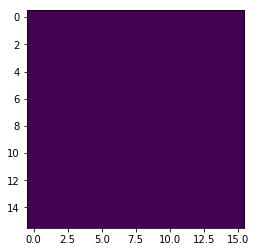

In [582]:
    for i in range(num_neurons):
        x = spi_loader((8 << 8) + i, 0, ODIN_READ_NEURON)
        y = spi_loader((9 << 8) + i, 0, ODIN_READ_NEURON)
        total = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)
        core_synapse_values[i, iteration] = total


In [82]:

def return_neuron_ca_values(neuron_idx):

    spi_loader_mmio(0, 1, ODIN_PROG_CONFIG)
    # Withdraw the calcium value
    x = spi_loader_mmio((9 << 8) + neuron_idx, 0, ODIN_READ_NEURON)
    y = spi_loader_mmio((10 << 8) + neuron_idx, 0, ODIN_READ_NEURON)
    calcium_values = ((y & 0x01) << 2) | ((x & 0xC0) >> 6)

    # Withdraw the core value
    x = spi_loader_mmio((8 << 8) + neuron_idx, 0, ODIN_READ_NEURON)
    y = spi_loader_mmio((9 << 8) + neuron_idx, 0, ODIN_READ_NEURON)
    core_values = ((y & 0x3F) << 2) | ((x & 0xC0) >> 6)

    # Withdraw the caleak_cnt value
    y = spi_loader_mmio((10 << 8) + neuron_idx, 0, ODIN_READ_NEURON)
    caleak_cnt_values = (y & 0x1E) >> 1
    
    spi_loader_mmio(0, 0, ODIN_PROG_CONFIG)

    return calcium_values, core_values, caleak_cnt_values

In [668]:
print(bin(spi_loader_mmio((9 << 8) + 0, 0, ODIN_READ_NEURON)))
print(bin(spi_loader_mmio((10 << 8) + i, 0, ODIN_READ_NEURON)))

0b11000000
0b1


In [678]:

for x in range(10):
    print(return_neuron_ca_values(x))
  

(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)
(0, 0, 0)


In [700]:
read_weights(3)

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [701]:
import numpy as np

# Parameters for the normal distribution
mean = 2
std_dev = 1  # Standard deviation, you can adjust this value to control the spread

# Generate a 16-number array with the specified normal distribution
array = np.random.normal(mean, std_dev, 16)

print(array)

[ 1.53903411  3.0087141   0.81647025  2.10883136  2.36049803  1.77942318
  0.35833656  2.34301153  2.3166188   0.17356286  2.39386819  2.56099903
  2.51202563  2.80895     1.00191562  3.5234079 ]


In [707]:
random_array = np.random.normal(mean, std_dev, 256)

TypeError: only length-1 arrays can be converted to Python scalars

In [713]:
mean = 2
std_dev = 1  # Standard deviation, you can adjust this value to control the spread

# Generate a 16-number array with the specified normal distribution
array = np.random.normal(mean, std_dev, 16)

# Ensure all numbers are positive and convert them to integers
positive_int_array = np.abs(array).astype(int)

In [714]:
positive_int_array

array([0, 0, 1, 3, 2, 1, 1, 1, 1, 0, 2, 1, 1, 2, 1, 1])